In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/onlineretail/Online Retail.xlsx


In [2]:
import warnings
warnings.filterwarnings("ignore") 

In [3]:
df = pd.read_excel("/kaggle/input/onlineretail/Online Retail.xlsx")

# Data Cleaning

In [4]:
## since it's a customer centric analysis drop the rows where customers are unidentifiable
df = df.dropna(subset = ["CustomerID"])

## Convert InvoiceDate to proper datetime format
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'], dayfirst=True)

## Assign timezone- since its UK Retail data, assumption is its UK time zone
df['InvoiceDate'] = df['InvoiceDate'].dt.tz_localize('Europe/London')

## convert InvoiceNo data type some are string while some are integers
df["InvoiceNo"] = df["InvoiceNo"].astype(str)

## convert customerID to integer
df['CustomerID'] = df['CustomerID'].astype(int)

In [5]:
# Remove all 'Manual' transactions, looks like accounting adjustment or system correction
manual_mask = (df['StockCode'] == 'M') & (df['Description'] == 'Manual')
df = df[~manual_mask]


print(f"Removed {manual_mask.sum()} manual adjustment records")

Removed 465 manual adjustment records


In [6]:
# Remove all 'bank charges' transactions, looks like accounting adjustment or system correction
bank_mask = df['Description'] == 'Bank Charges'
df = df[~bank_mask]

print(f"Removed {bank_mask.sum()} bank charges records")

Removed 12 bank charges records


In [7]:
# 1. Identify cancellation pairs
def find_cancellation_pairs(df):
    # Get all cancellation transactions
    cancellations = df[df['InvoiceNo'].str.startswith('C')].copy()
    cancellations['OriginalInvoice'] = cancellations['InvoiceNo'].str[1:]
    cancellations['Quantity'] = cancellations['Quantity'].abs()  # Make quantities positive
    
    # Merge with original orders to find matches
    matched_pairs = pd.merge(
        df[df['Quantity'] > 0],
        cancellations,
        on=['CustomerID', 'StockCode', 'Quantity'],
        suffixes=('_order', '_cancel'),
        how='inner'
    )
    
    # Filter for same-day cancellations (adjust time window as needed)
    time_window = pd.Timedelta('1D')
    matched_pairs = matched_pairs[
        (matched_pairs['InvoiceDate_cancel'] - matched_pairs['InvoiceDate_order']).abs() <= time_window
    ]
    
    # Return all invoice numbers to remove
    orders_to_remove = matched_pairs['InvoiceNo_order'].unique()
    cancels_to_remove = matched_pairs['InvoiceNo_cancel'].unique()
    
    return list(orders_to_remove) + list(cancels_to_remove)

# 2. Get all invoice pairs to remove
invoices_to_remove = find_cancellation_pairs(df)

# 3. Clean the dataset
df_clean = df[~df['InvoiceNo'].isin(invoices_to_remove)]

# 4. Final filtering (standard positive quantity sales)
df_sales_only = df_clean[
    (~df_clean['InvoiceNo'].str.startswith('C')) & 
    (df_clean['Quantity'] > 0) &
    (df_clean['UnitPrice'] > 0)
]

In [8]:
df_sales_only[df_sales_only['Country'] == 'United Kingdom']['CustomerID'].nunique()

3904

In [9]:
df_sales_only['CustomerID'].nunique()

4321

In [10]:
print(f"Found {len(invoices_to_remove)//2} order-cancellation pairs")

Found 306 order-cancellation pairs


In [11]:
df_sales_only.loc[:, 'Revenue'] = df_sales_only['UnitPrice'] * df_sales_only['Quantity']

# Creating Product Category 
## using Hybrid apporach (Rule-based + KMeans Clustering)

In [12]:
import re

# Clean descriptions
def clean_text(text):
    text = str(text).lower()
    text = re.sub(r'[^a-z0-9\s]', '', text)  # Remove special chars
    text = re.sub(r'\s+', ' ', text).strip()   # Remove extra spaces
    return text

# Create unique product catalog
product_catalog = df_sales_only.drop_duplicates('StockCode')[['StockCode', 'Description']].reset_index(drop=True)

# Clean descriptions
product_catalog['Cleaned_Description'] = product_catalog['Description'].apply(clean_text)

In [13]:
product_catalog.count()

StockCode              3657
Description            3657
Cleaned_Description    3657
dtype: int64

Cluster Analysis for 'Other' Products:

Cluster 0 (Size: 46)
Sample Products: ['SQUARECUSHION COVER PINK UNION FLAG', 'STRAWBERRY RAFFIA FOOD COVER', 'POLKA DOT RAFFIA FOOD COVER', 'CUSHION COVER PINK UNION JACK', 'LADYBIRD + BEE RAFFIA FOOD COVER', 'PIN CUSHION BABUSHKA PINK', 'FLOWER VINE RAFFIA FOOD COVER', 'BLUE/CREAM STRIPE CUSHION COVER ', 'UNION STRIPE CUSHION COVER ', 'PINK FAIRY CAKE CUSHION COVER']
Top Keywords: cover, cushion, pink, french, woven, food, raffia, floral, stripe, blue

Cluster 1 (Size: 12)
Sample Products: ['BLACK RECORD COVER FRAME', 'RECORD FRAME 7" SINGLE SIZE ', 'CLASSIC WHITE FRAME', 'VINYL RECORD FRAME SILVER', 'FAN BLACK FRAME ', 'WHITE 3 FRAME BIRDS AND TREE ', 'OVAL  MINI PORTRAIT FRAME', 'SQUARE MINI PORTRAIT FRAME', 'LANDMARK FRAME LONDON BRIDGE ', 'LANDMARK FRAME OXFORD STREET']
Top Keywords: frame, landmark, record, street, portrait, black, mini, white, classic, fan

Cluster 2 (Size: 52)
Sample Products: ['GIRLY PINK TOOL SET', 'SET OF 3 COLOURED  

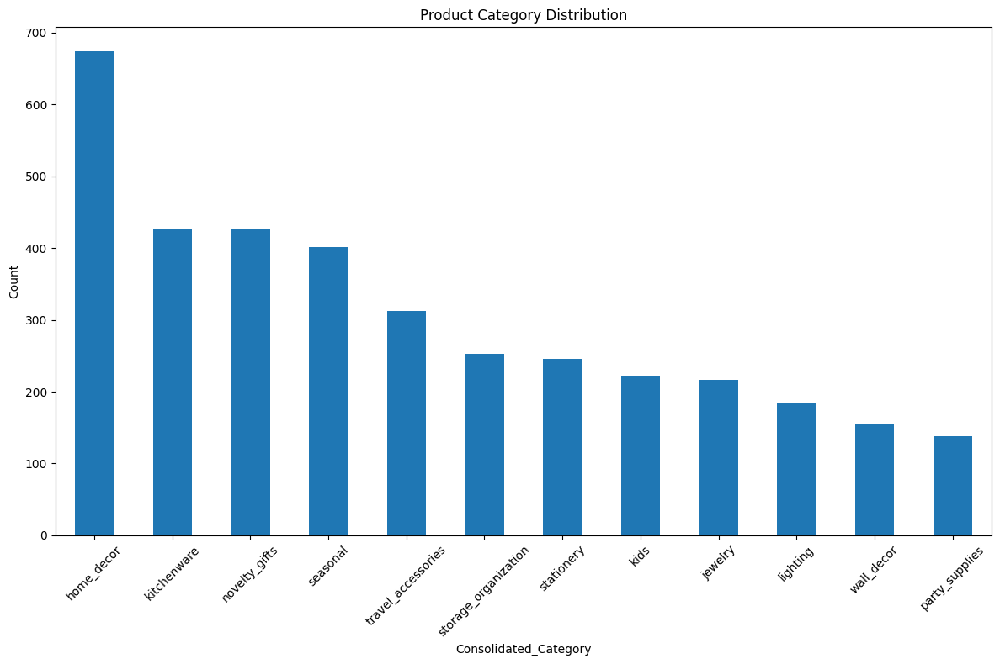

In [14]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans


# Step 1: category rules based on data patterns
category_rules = {
    "home_decor": ["photo", "candle holder", "door knob", "home sign", "decoration", "doormat", "building block word", 
                   "doorsign", "plant holder", "jug", "glass cloche","scented candle", "picture", "doorstop", "magnet", 
                   "home sweet home", "tlight", "wood letter"],
    "kitchenware": ["kitchen tool", "measuring spoon", "cutlery", "teapot", "milk jug", "whisk", "bowl", "plate", "jar",
                    "strainer", "baking dish", "oven glove", "coaster", "mug", "baking", "tray", "cup", "egg cosy", 
                    "tea cosy", "enamel jug", "fire bucket", "tea towel", "beaker", "egg holder", "jam", "popcorn holder"],
    "seasonal": ["christmas", "advent", "santa", "xmas", "heart", "valentine", "holiday", "easter", "christmas lights"],
    "lighting": ["light", "lamp", "night light", "candle holder", "illuminated", "fairy lights", "night owl", 
                 "babushka lights", "lantern", "candle stick", "candle holder", "candle"],
    "kids": ["game", "ludo", "cards", "puzzle", "toy", "dinosaur", "spaceboy", "pricess", "doll", "filecraft", "playhouse", "jigsaw"],
    "stationery": ["notebook", "pen", "pencil", "sticker", "drawing", "paint set", "ruler", "colouring", "skipping rope"],
    "travel_accessories": ["bag", "luggage", "airline", "tote", "purse", "suitcase", "tag", "umbrella", "passport cover"],
    "vintage_collectibles": ["vintage", "regency", "bakelike", "retrospot", "antique", "edwardian"],
    "party_supplies": ["cake cases", "fairycake", "petit four", "napkins", "cake stand", "tissues", "gift tape", 
                       "paper plates", "popcorn holder"],
    "personal_care": ["bath sponge", "lip gloss", "incense", "perfume", "soap", "hot water bottle", "party"],
    "novelty_gifts": ["alarm clock", "playing cards", "book box", "calculator", "money bank", "globe"],
    "storage_organization": ["container", "tin", "box", "drawer", "storage", "hanger", "coat rack", "bin", "bucket", "storage bin",
                            "basket", "wicker"],
    "winter_collection" : ["warmer", "thermal", "glove", "scarf", "hat", "beanie", "muff", "earmuff", "fleece", 
                         "insulated", "winter", "cold", "heated", "knitted", "wool", "thermal"],
    "craft_supplies": ["embroidery", "sewing", "feltcraft", "yarn", "make your own", "craft kit", "balloon art","crochet",  
                       "diy", "sewing kit", "sticker kit", "craft", "beads", "ribbon reel", "wool", "knitting", "sew", "ribbons"],
    "greeting_cards": ["birthday card", "greeting card", "valentine card", "card kit", "make your own card", "card"],
    "home_textiles": ["quilt", "towel", "linen", "cloth"],
    "jewelry": ["necklace", "earrings", "bracelet", "diamante", "gemstone", "bling", "brooch", "charm", "crystal"],
    "garden_outdoor": ["garden", "outdoor", "hook", "tile", "thermometer"],
    "wall_decor": ["wall art", "mirrored", "tidy", "metal sign", "sign", "clock"]
}

# Step 2: Rule-based categorization
def categorize_product(description):
    description = description.lower()
    for category, keywords in category_rules.items():
        if any(keyword in description for keyword in keywords):
            return category
    return "other"

# Apply categorization only once per product
product_catalog['Category'] = product_catalog['Cleaned_Description'].apply(categorize_product)

# Step 3: Handle 'Other' category with clustering
other_mask = product_catalog['Category'] == 'other'
other_df = product_catalog[other_mask].copy()

if not other_df.empty:
    # Vectorize descriptions
    tfidf = TfidfVectorizer(max_features=500, stop_words='english')
    X_other = tfidf.fit_transform(other_df['Cleaned_Description'])
    
    # Cluster (adjust n_clusters based on data size)
    n_clusters = min(15, len(other_df)//5)  # At least 5 samples per cluster
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=20)
    other_df['Temp_Cluster'] = kmeans.fit_predict(X_other)
    
    # Analyze cluster keywords
    print("Cluster Analysis for 'Other' Products:")
    feature_names = tfidf.get_feature_names_out()
    for i in range(n_clusters):
        cluster_samples = other_df[other_df['Temp_Cluster'] == i]
        print(f"\nCluster {i} (Size: {len(cluster_samples)})")
        print("Sample Products:", cluster_samples['Description'].head(10).tolist())
        
        # Show top keywords
        cluster_center = kmeans.cluster_centers_[i]
        top_keywords = [feature_names[idx] for idx in cluster_center.argsort()[-10:][::-1]]
        print("Top Keywords:", ", ".join(top_keywords))
    
    # Manually map clusters based on analysis
    cluster_map = {
        0: "home_textiles",        # Cushion covers, food covers
        1: "wall_decor",           # Picture frames
        2: "home_decor",           # Decorative sets (ducks, placemats, crates)
        3: "kitchenware",          # Pans, egg spoons
        4: "home_decor",           # Assorted decorative items
        5: "kids",                # Pink-themed kids products
        6: "party_supplies",      # Skull-themed party items
        7: "novelty_gifts",       # Diverse gift items (disco ball, slippers, bangles)
        8: "home_decor",           # Painted wooden items
        9: "kitchenware",          # Glassware
        10: "home_decor",          # Metal decorative items
        11: "party_supplies",      # Gift wraps
        12: "kids",               # Blue kids items (helicopter, rain mac)
        13: "personal_care",       # Mirrors
        14: "party_supplies"      # Party decorations (paper garlands, honeycomb bells)
    }
    # Apply cluster mapping to 'other' products
    other_df['Category'] = other_df['Temp_Cluster'].map(cluster_map)
    
    # Update main dataframe with categorized 'other' products
    product_catalog.loc[other_mask, 'Category'] = other_df['Category']
    #=======================================================================
    # CATEGORY CONSOLIDATION (FOR BETTER FORECASTING OF SMALL CATEGORIES)
    #=======================================================================
    consolidation_map = {
        'vintage_collectibles': 'home_decor',
        'garden_outdoor': 'home_decor',
        'home_textiles': 'home_decor',
        'winter_collection': 'seasonal',
        'greeting_cards': 'stationery',
        'craft_supplies': 'stationery',
        'personal_care': 'novelty_gifts',
        'gift_wraps': 'party_supplies'
    }

    # Apply consolidation to all products
    product_catalog['Consolidated_Category'] = product_catalog['Category'].replace(consolidation_map)

# Step 5: Final validation
category_counts = product_catalog['Consolidated_Category'].value_counts()
print("\nFinal Category Distribution:")
print(category_counts)

# Step 6: Visualize categories (optional)
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))
category_counts.plot(kind='bar')
plt.title('Product Category Distribution')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [15]:
# Merge categories to back to transaction
df_sales_categorized = df_sales_only.merge(
    product_catalog[['StockCode', 'Consolidated_Category']],
    on='StockCode',
    how='left'
)

In [16]:
# 1. Rename for clarity
df_sales_categorized = df_sales_categorized.rename(columns={
    'Consolidated_Category': 'Product_Category',
    'Description': 'Product_Description'
})

# 2. Reorder columns
final_columns = [
    'InvoiceNo', 'StockCode', 'Product_Category', 'Product_Description', 'Quantity', 'InvoiceDate',
    'UnitPrice', 'CustomerID', 'Country', 'Revenue'
]
df_sales_categorized = df_sales_categorized[final_columns]

In [17]:
df_sales_categorized.head(5)

,InvoiceNo,StockCode,Product_Category,Product_Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Revenue
0,536365,85123A,home_decor,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00+00:00,2.55,17850,United Kingdom,15.30
1,536365,71053,lighting,WHITE METAL LANTERN,6,2010-12-01 08:26:00+00:00,3.39,17850,United Kingdom,20.34
2,536365,84406B,kitchenware,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00+00:00,2.75,17850,United Kingdom,22.00
3,536365,84029G,novelty_gifts,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00+00:00,3.39,17850,United Kingdom,20.34
4,536365,84029E,seasonal,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00+00:00,3.39,17850,United Kingdom,20.34


In [18]:
# Handle edge case of CREAM CUPID HEARTS COAT HANGER being assigned Kitchenware
def apply_manual_rules(row):
    desc = row['Product_Description'].lower()
    
    if "hanger" in desc:
        return "storage_organization"
    
    return row['Product_Category']  # keep the cluster-assigned one

df_sales_categorized['Product_Category'] = df_sales_categorized.apply(apply_manual_rules, axis=1)

# Feature Engineering for Customer Behaviour Analysis

In [19]:
# Snapshot date for Recency calculation
snapshot_date = df_sales_categorized['InvoiceDate'].max() + pd.Timedelta(days=1)

# RFM Features
rfm = df_sales_categorized.groupby('CustomerID').agg({
    'InvoiceDate': lambda x: (snapshot_date - x.max()).days,
    'InvoiceNo': 'nunique',
    'Revenue': 'sum'
})
rfm.columns = ['Recency', 'Frequency', 'Monetary']

# Average basket size (Quantity per Invoice)
basket = df_sales_categorized.groupby('CustomerID').agg({
    'Quantity': 'sum',
    'InvoiceNo': 'nunique'
})
basket['AvgBasketSize'] = basket['Quantity'] / basket['InvoiceNo']

# Product Diversity, unique products purchased
product_diversity = df_sales_categorized.groupby('CustomerID')['StockCode'].nunique().rename('Product_Variety')

# Calculate average price paid vs. overall product price (proxy for price sensitivity)
price_sensitivity = (
    df_sales_categorized.groupby('CustomerID')
    .apply(lambda x: (x['UnitPrice'].mean() / df_sales_categorized['UnitPrice'].mean()))
    .rename('Price_Sensitivity')
)

# Average Time Between Purchases (days)
time_gaps = df_sales_categorized.sort_values(['CustomerID', 'InvoiceDate']) \
    .groupby('CustomerID')['InvoiceDate'] \
    .apply(lambda x: x.diff().dt.days.mean()).rename('AvgDaysBetweenPurchases')

# Merge All Features
customer_features = rfm \
    .merge(basket[['AvgBasketSize']], left_index=True, right_index=True) \
    .merge(product_diversity, left_index=True, right_index=True) \
    .merge(time_gaps, left_index=True, right_index=True) \
    .merge(price_sensitivity, left_index=True, right_index=True)

# Handle NaN in AvgDaysBetweenPurchases (e.g., single-purchase customers)
customer_features['AvgDaysBetweenPurchases'].fillna(999, inplace=True)

# Round All Float Columns to 2 Decimal Places
float_cols = customer_features.select_dtypes(include='float').columns
customer_features[float_cols] = customer_features[float_cols].round(2)

customer_features = customer_features.astype({
    'Recency': 'int',
    'Frequency': 'int',
    'Product_Variety': 'int',
})

# Making CustomerID as column instead from index
customer_features = customer_features.reset_index()

customer_features.head()

,CustomerID,Recency,Frequency,Monetary,AvgBasketSize,Product_Variety,AvgDaysBetweenPurchases,Price_Sensitivity
0,12347,2,7,4310.00,351.14,103,2.00,0.89
1,12348,76,4,1797.24,585.25,22,9.37,1.94
2,12349,19,1,1757.55,631.00,73,0.00,2.79
3,12350,310,1,334.40,197.00,17,0.00,1.29
4,12352,36,6,1505.41,78.17,58,3.55,2.08


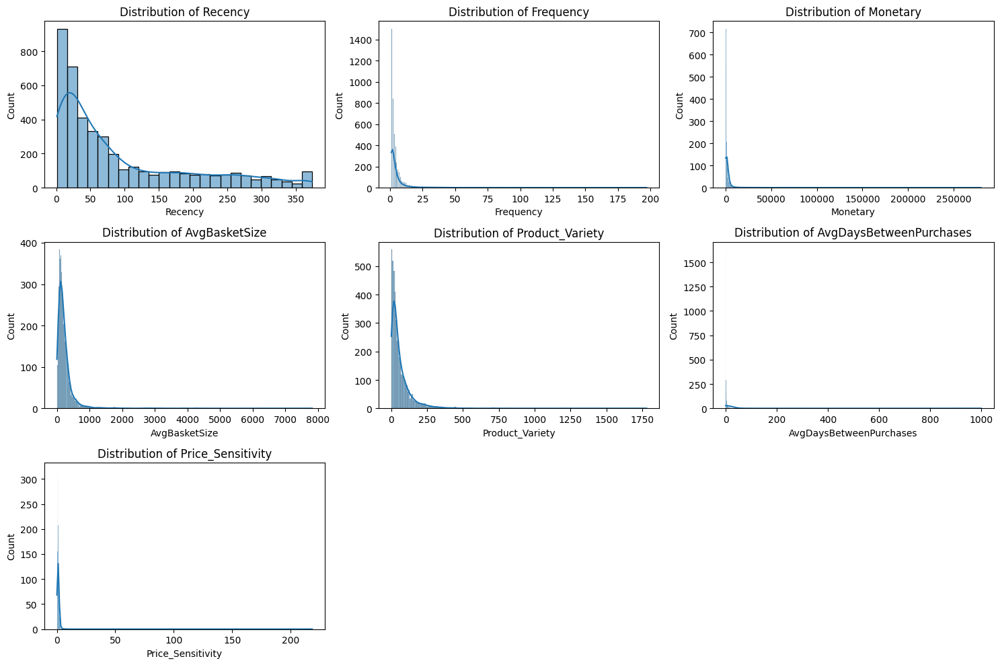

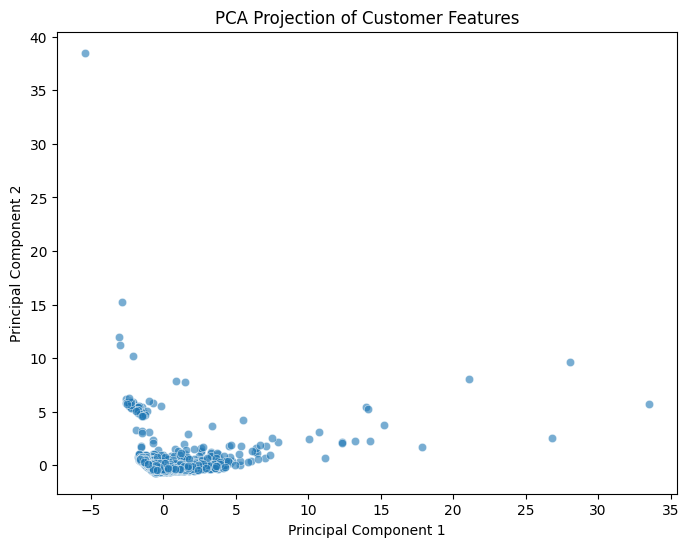

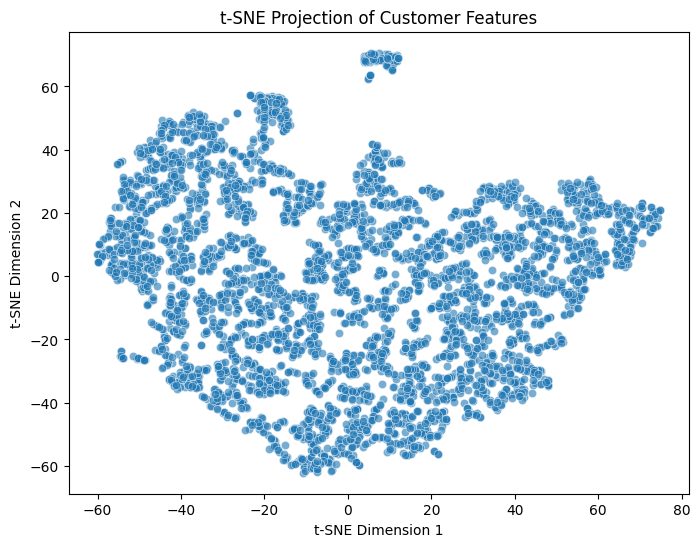

In [20]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler


# # Preprocessing for clustering
features = ['Recency', 'Frequency', 'Monetary', 'AvgBasketSize', 
            'Product_Variety', 'AvgDaysBetweenPurchases', 'Price_Sensitivity']
X = customer_features[features]

# Scale features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Step 1: Feature Distribution Visualization
plt.figure(figsize=(15, 10))
for i, feature in enumerate(features):
    plt.subplot(3, 3, i+1)
    sns.histplot(customer_features[feature], kde=True)
    plt.title(f'Distribution of {feature}')
plt.tight_layout()
plt.show()

# Step 2: PCA Visualization
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

plt.figure(figsize=(8, 6))
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], alpha=0.6)
plt.title('PCA Projection of Customer Features')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

# Step 3: t-SNE Visualization (more effective for clustering visualization)
tsne = TSNE(n_components=2, perplexity=30, random_state=42)
X_tsne = tsne.fit_transform(X_scaled)

plt.figure(figsize=(8, 6))
sns.scatterplot(x=X_tsne[:, 0], y=X_tsne[:, 1], alpha=0.6)
plt.title('t-SNE Projection of Customer Features')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.show()  

## Elbow Method for GMM and KMeans

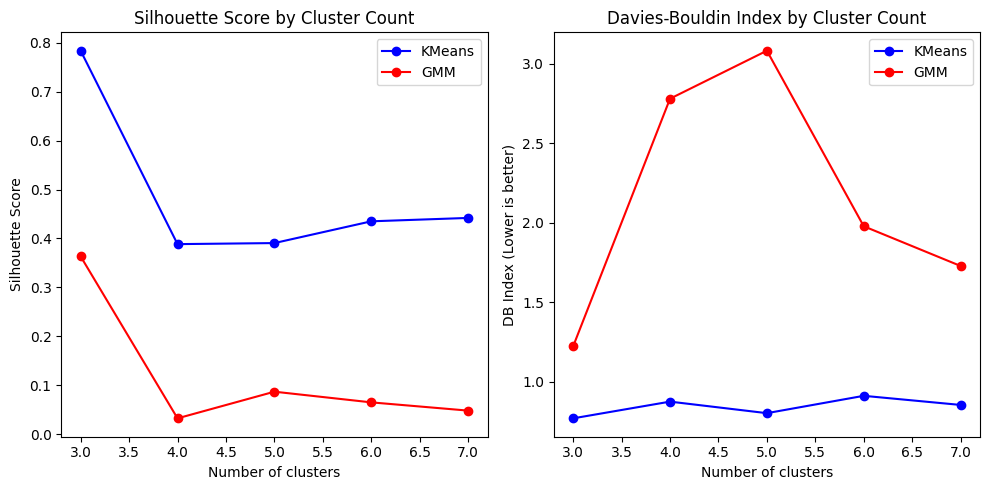

In [21]:
from sklearn.metrics import silhouette_score, davies_bouldin_score
from sklearn.mixture import GaussianMixture

# cluster range 3-7
k_range = range(3, 8)
kmeans_scores = {'silhouette': [], 'davies_bouldin': []}
gmm_scores = {'silhouette': [], 'davies_bouldin': []}

for k in k_range:
    # KMeans
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=20)
    kmeans_labels = kmeans.fit_predict(X_scaled)
    kmeans_scores['silhouette'].append(silhouette_score(X_scaled, kmeans_labels))
    kmeans_scores['davies_bouldin'].append(davies_bouldin_score(X_scaled, kmeans_labels))
    
    # GMM
    gmm = GaussianMixture(n_components=k, random_state=42)
    gmm_labels = gmm.fit_predict(X_scaled)
    gmm_scores['silhouette'].append(silhouette_score(X_scaled, gmm_labels))
    gmm_scores['davies_bouldin'].append(davies_bouldin_score(X_scaled, gmm_labels))

    
# Plot results
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.plot(k_range, kmeans_scores['silhouette'], 'bo-', label='KMeans')
plt.plot(k_range, gmm_scores['silhouette'], 'ro-', label='GMM')
plt.title('Silhouette Score by Cluster Count')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(k_range, kmeans_scores['davies_bouldin'], 'bo-', label='KMeans')
plt.plot(k_range, gmm_scores['davies_bouldin'], 'ro-', label='GMM')
plt.title('Davies-Bouldin Index by Cluster Count')
plt.xlabel('Number of clusters')
plt.ylabel('DB Index (Lower is better)')
plt.legend()
plt.tight_layout()

## KMeans Clustering

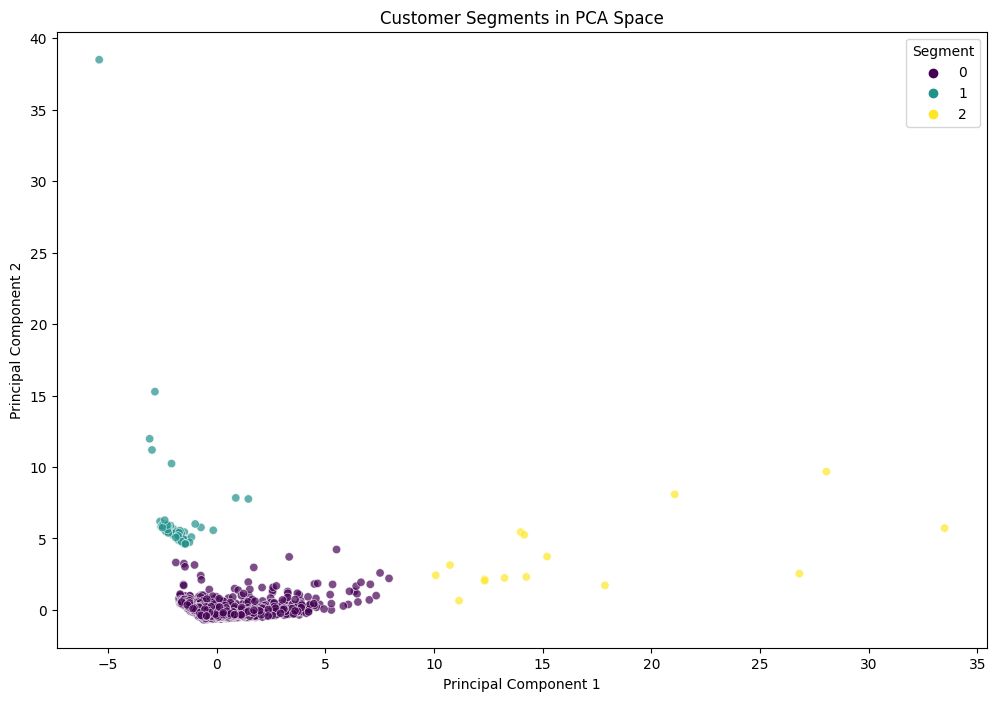

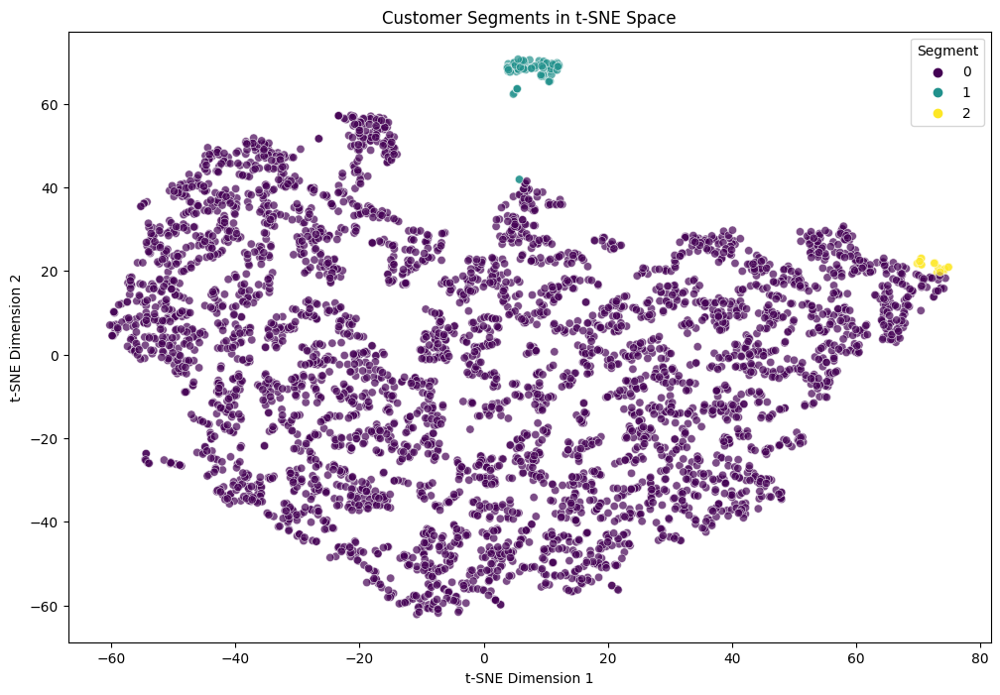

,Recency,Frequency,Monetary,AvgBasketSize,Product_Variety,Price_Sensitivity,Count
Segment,,,,,,,
0,91.358762,3.994804,1608.958996,225.046530,59.494804,1.118269,4234
1,203.583333,1.013889,315.641806,255.638889,1.000000,7.249722,72
2,4.866667,77.000000,101592.460000,1133.368000,778.066667,1.034000,15


In [22]:
# Step 4: Cluster with KMeans
kmeans = KMeans(n_clusters=3, random_state=42)
customer_features['Segment'] = kmeans.fit_predict(X_scaled)

# Step 5: Visualize Clusters in PCA Space
plt.figure(figsize=(12, 8))
sns.scatterplot(
    x=X_pca[:, 0], 
    y=X_pca[:, 1], 
    hue=customer_features['Segment'],
    palette='viridis',
    alpha=0.7
)
plt.title('Customer Segments in PCA Space')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Segment')
plt.show()

# Step 6: Visualize Clusters in t-SNE Space
plt.figure(figsize=(12, 8))
sns.scatterplot(
    x=X_tsne[:, 0], 
    y=X_tsne[:, 1], 
    hue=customer_features['Segment'],
    palette='viridis',
    alpha=0.7
)
plt.title('Customer Segments in t-SNE Space')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.legend(title='Segment')
plt.show()

# Step 7: Segment Profiling
segment_profile = customer_features.groupby('Segment').agg({
    'Recency': 'mean',
    'Frequency': 'mean',
    'Monetary': 'mean',
    'AvgBasketSize': 'mean',
    'Product_Variety': 'mean',
    'Price_Sensitivity': 'mean',
    'CustomerID': 'count'
}).rename(columns={'CustomerID': 'Count'})

segment_profile.head(3)

In [23]:
# Get customers in Segment 2
segment_1_customers = customer_features[customer_features['Segment'] == 1][['CustomerID', 'Recency', 'Frequency', 'Monetary']]

# Display the results
print(f"Number of customers in Segment 1: {len(segment_1_customers)}")
print("\n customers in Segment 1:")
segment_1_customers.head()

Number of customers in Segment 1: 72

 customers in Segment 1:


,CustomerID,Recency,Frequency,Monetary
433,12908,176,1,432.00
512,13017,7,1,204.00
569,13099,99,1,207.36
574,13106,133,1,76.50
584,13120,239,1,30.60


## GMM Clustering

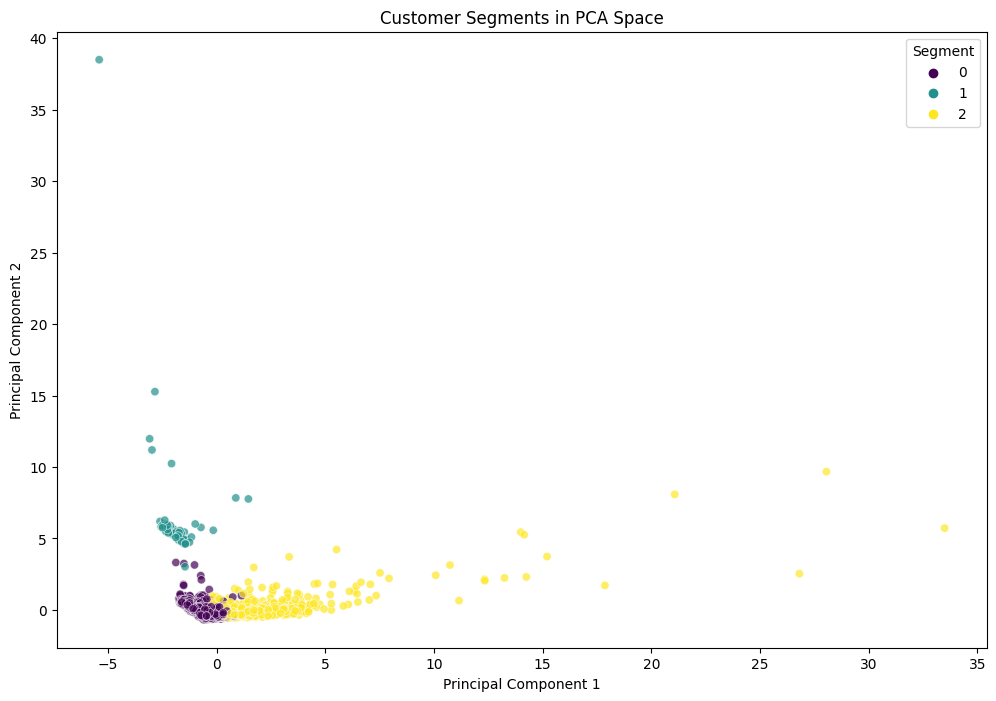

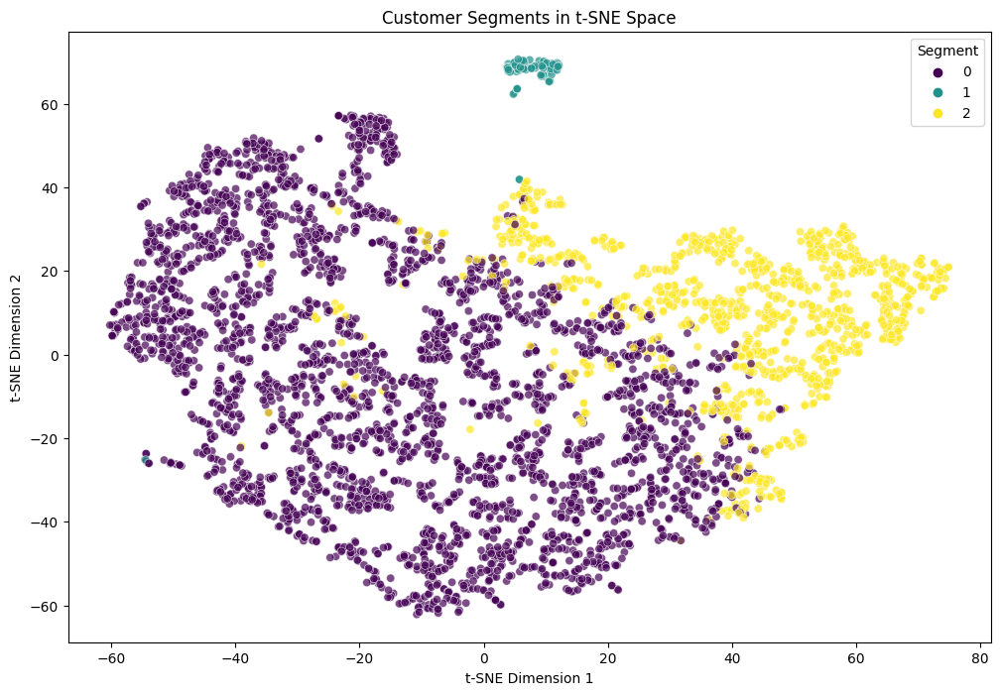

,Recency,Frequency,Monetary,AvgBasketSize,Product_Variety,Price_Sensitivity,Count
GMM_Segment,,,,,,,
0,111.190085,2.216293,639.819312,175.564177,33.502684,1.156985,3167
1,204.301370,1.027397,328.797397,253.178082,1.013699,7.405342,73
2,31.906568,10.220167,5835.925560,382.756503,145.667900,0.987493,1081


In [24]:
from sklearn.mixture import GaussianMixture

gmm = GaussianMixture(
    n_components=3,
    random_state=42
)
customer_features['GMM_Segment'] = gmm.fit_predict(X_scaled)

# Step 5: Visualize Clusters in PCA Space
plt.figure(figsize=(12, 8))
sns.scatterplot(
    x=X_pca[:, 0], 
    y=X_pca[:, 1], 
    hue=customer_features['GMM_Segment'],
    palette='viridis',
    alpha=0.7
)
plt.title('Customer Segments in PCA Space')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Segment')
plt.show()

# Step 6: Visualize Clusters in t-SNE Space
plt.figure(figsize=(12, 8))
sns.scatterplot(
    x=X_tsne[:, 0], 
    y=X_tsne[:, 1], 
    hue=customer_features['GMM_Segment'],
    palette='viridis',
    alpha=0.7
)
plt.title('Customer Segments in t-SNE Space')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.legend(title='Segment')
plt.show()

# Step 7: Segment Profiling
segment_profile = customer_features.groupby('GMM_Segment').agg({
    'Recency': 'mean',
    'Frequency': 'mean',
    'Monetary': 'mean',
    'AvgBasketSize': 'mean',
    'Product_Variety': 'mean',
    'Price_Sensitivity': 'mean',
    'CustomerID': 'count'
}).rename(columns={'CustomerID': 'Count'})

segment_profile.head()

## DBSCAN clustering

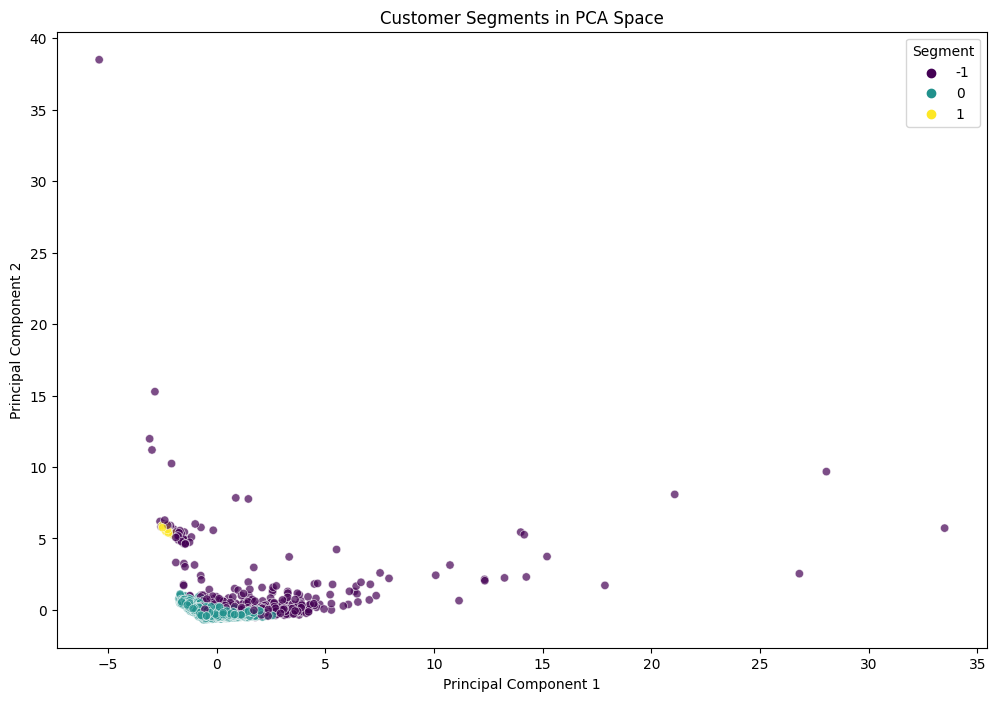

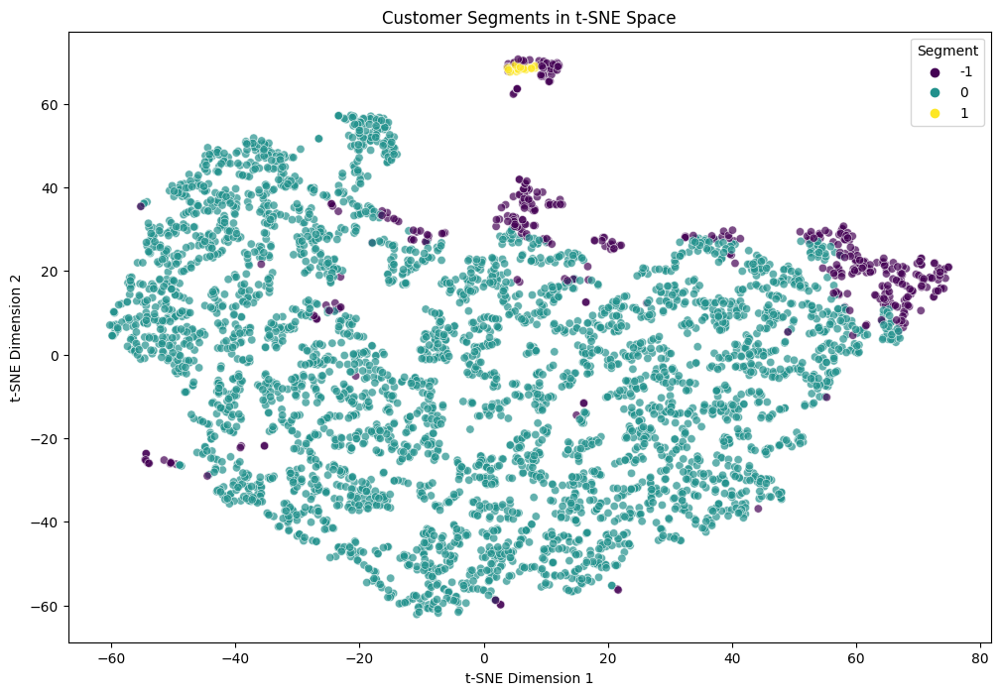

,Recency,Frequency,Monetary,AvgBasketSize,Product_Variety,Price_Sensitivity,Count
DBSCAN_Segment,,,,,,,
-1,73.515663,13.653012,10235.416988,598.354675,155.248193,2.515687,415
0,93.844965,3.207056,1058.057623,190.192722,51.298738,1.082833,3883
1,288.478261,1.000000,122.160870,61.652174,1.000000,1.025652,23


In [25]:
from sklearn.cluster import DBSCAN

dbscan = DBSCAN(
    eps=0.5, 
    min_samples=10,
    metric='euclidean'
)
customer_features['DBSCAN_Segment'] = dbscan.fit_predict(X_scaled)

# Step 5: Visualize Clusters in PCA Space
plt.figure(figsize=(12, 8))
sns.scatterplot(
    x=X_pca[:, 0], 
    y=X_pca[:, 1], 
    hue=customer_features['DBSCAN_Segment'],
    palette='viridis',
    alpha=0.7
)
plt.title('Customer Segments in PCA Space')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Segment')
plt.show()

# Step 6: Visualize Clusters in t-SNE Space
plt.figure(figsize=(12, 8))
sns.scatterplot(
    x=X_tsne[:, 0], 
    y=X_tsne[:, 1], 
    hue=customer_features['DBSCAN_Segment'],
    palette='viridis',
    alpha=0.7
)
plt.title('Customer Segments in t-SNE Space')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.legend(title='Segment')
plt.show()

# Step 7: Segment Profiling
segment_profile = customer_features.groupby('DBSCAN_Segment').agg({
    'Recency': 'mean',
    'Frequency': 'mean',
    'Monetary': 'mean',
    'AvgBasketSize': 'mean',
    'Product_Variety': 'mean',
    'Price_Sensitivity': 'mean',
    'CustomerID': 'count'
}).rename(columns={'CustomerID': 'Count'})

segment_profile.head()

In [26]:
from sklearn.metrics import silhouette_score, davies_bouldin_score

# KMean clustering evaluation
print("----KMean----")
print(f"Silhouette Score: {silhouette_score(X_scaled, customer_features['Segment']):.3f}")
print(f"Davies-Bouldin Index: {davies_bouldin_score(X_scaled, customer_features['Segment']):.3f}\n")
# GMM clustering evaluation
print("-----GMM-----")
print(f"Silhouette Score: {silhouette_score(X_scaled, customer_features['GMM_Segment']):.3f}")
print(f"Davies-Bouldin Index: {davies_bouldin_score(X_scaled, customer_features['GMM_Segment']):.3f}\n")
# DBSCAN clustering evaluation
print("----DBSCAN---")
print(f"Silhouette Score: {silhouette_score(X_scaled, customer_features['DBSCAN_Segment']):.3f}")
print(f"Davies-Bouldin Index: {davies_bouldin_score(X_scaled, customer_features['DBSCAN_Segment']):.3f}")

----KMean----
Silhouette Score: 0.784
Davies-Bouldin Index: 0.771

-----GMM-----
Silhouette Score: 0.363
Davies-Bouldin Index: 1.224

----DBSCAN---
Silhouette Score: 0.592
Davies-Bouldin Index: 1.626


# Feature Engineering for Demand Forecasting

In [27]:
df_sales_categorized.head(5)

,InvoiceNo,StockCode,Product_Category,Product_Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Revenue
0,536365,85123A,home_decor,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00+00:00,2.55,17850,United Kingdom,15.30
1,536365,71053,lighting,WHITE METAL LANTERN,6,2010-12-01 08:26:00+00:00,3.39,17850,United Kingdom,20.34
2,536365,84406B,storage_organization,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00+00:00,2.75,17850,United Kingdom,22.00
3,536365,84029G,novelty_gifts,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00+00:00,3.39,17850,United Kingdom,20.34
4,536365,84029E,seasonal,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00+00:00,3.39,17850,United Kingdom,20.34


In [28]:
df_sales_categorized = df_sales_categorized.merge(
    customer_features[['CustomerID', 'Segment', 'Price_Sensitivity']], # Merge CustomerID and the Segment column
    on='CustomerID',                              # on CustomerID 
    how='left'                                    # Using left merge to keep all transactions
)
df_sales_categorized['Segment'].fillna('Uncategorized', inplace=True)

In [29]:
df_sales_categorized.head()

,InvoiceNo,StockCode,Product_Category,Product_Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Revenue,Segment,Price_Sensitivity
0,536365,85123A,home_decor,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00+00:00,2.55,17850,United Kingdom,15.30,0,1.33
1,536365,71053,lighting,WHITE METAL LANTERN,6,2010-12-01 08:26:00+00:00,3.39,17850,United Kingdom,20.34,0,1.33
2,536365,84406B,storage_organization,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00+00:00,2.75,17850,United Kingdom,22.00,0,1.33
3,536365,84029G,novelty_gifts,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00+00:00,3.39,17850,United Kingdom,20.34,0,1.33
4,536365,84029E,seasonal,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00+00:00,3.39,17850,United Kingdom,20.34,0,1.33


In [30]:
# aggregating sales data 
df_sales_categorized['InvoiceWeek'] = df_sales_categorized['InvoiceDate'].dt.to_period('W').dt.start_time

weekly_segment_category_sales = df_sales_categorized.groupby(
    ['InvoiceWeek', 'Segment', 'Product_Category']
).agg(
    Total_Quantity=('Quantity', 'sum'),
    Avg_UnitPrice=('UnitPrice', 'mean'),
    Avg_Customer_Price_Sensitivity=('Price_Sensitivity', 'mean')
).reset_index()

In [31]:
# Create Segment-Specific Demand DataFrames

# Dictionary to temporarily store pivots during creation
temp_segment_pivots = {} 

unique_segments = weekly_segment_category_sales['Segment'].unique()

for segment_name in unique_segments:
    print(f"\n--- Creating demand DataFrame for Segment: {segment_name} ---")
    
    segment_data = weekly_segment_category_sales[weekly_segment_category_sales['Segment'] == segment_name].copy()
    
    if segment_data.empty:
        print(f"No data for segment {segment_name}. Skipping.")
        continue

    segment_pivot = segment_data.pivot_table(
        index='InvoiceWeek',
        columns='Product_Category',
        values=['Total_Quantity', 'Avg_UnitPrice', 'Avg_Customer_Price_Sensitivity'] 
    )

    segment_pivot.columns = [f'{col[1]}_{col[0]}' for col in segment_pivot.columns]

    segment_pivot.fillna(0, inplace=True)

    segment_pivot.sort_index(inplace=True)
    
    # Store in temporary dictionary first
    temp_segment_pivots[segment_name] = segment_pivot

    print(f"Segment {segment_name} Demand DataFrame Head:")
    display(segment_pivot.head())
    print(f"Shape of Segment {segment_name} Demand DataFrame: {segment_pivot.shape}")
    print(f"Columns for Segment {segment_name} (first 5, then last 5):")
    print(segment_pivot.columns.tolist()[:5] + ['...'] + segment_pivot.columns.tolist()[-5:])

# --- Now, assign them to individual DataFrames based on the ACTUAL segment names (0, 1, 2) ---
if 0 in temp_segment_pivots:
    demand_pivot_0 = temp_segment_pivots[0]
    print("\n'demand_pivot_0' created.")
if 1 in temp_segment_pivots:
    demand_pivot_1 = temp_segment_pivots[1]
    print("'demand_pivot_1' created.")
if 2 in temp_segment_pivots:
    demand_pivot_2 = temp_segment_pivots[2]
    print("'demand_pivot_2' created.")

print(f"\nTotal segment DataFrames created: {len(temp_segment_pivots)}")


--- Creating demand DataFrame for Segment: 0 ---
Segment 0 Demand DataFrame Head:


,home_decor_Avg_Customer_Price_Sensitivity,jewelry_Avg_Customer_Price_Sensitivity,kids_Avg_Customer_Price_Sensitivity,kitchenware_Avg_Customer_Price_Sensitivity,lighting_Avg_Customer_Price_Sensitivity,novelty_gifts_Avg_Customer_Price_Sensitivity,party_supplies_Avg_Customer_Price_Sensitivity,seasonal_Avg_Customer_Price_Sensitivity,stationery_Avg_Customer_Price_Sensitivity,storage_organization_Avg_Customer_Price_Sensitivity,...,kids_Total_Quantity,kitchenware_Total_Quantity,lighting_Total_Quantity,novelty_gifts_Total_Quantity,party_supplies_Total_Quantity,seasonal_Total_Quantity,stationery_Total_Quantity,storage_organization_Total_Quantity,travel_accessories_Total_Quantity,wall_decor_Total_Quantity
InvoiceWeek,,,,,,,,,,,,,,,,,,,,,
2010-11-29,1.093509,1.018478,0.937048,1.037575,1.061778,1.026903,0.964826,1.006047,0.906417,1.056802,...,4362.0,5314.0,3665.0,4916.0,3598.0,11823.0,5014.0,7752.0,6068.0,5250.0
2010-12-06,1.041992,1.085556,0.932609,1.022707,1.062226,1.014855,0.971713,0.962250,0.908495,1.011755,...,4980.0,7008.0,2401.0,9066.0,3504.0,12052.0,7985.0,6924.0,6939.0,3406.0
2010-12-13,1.034857,1.088437,0.922159,1.002484,0.975145,1.026744,0.987202,0.988653,0.914513,1.061546,...,4389.0,9474.0,4152.0,6351.0,3713.0,10316.0,5409.0,8186.0,5295.0,4741.0
2010-12-20,1.106549,1.120000,1.019383,1.049251,0.998983,1.048916,1.109851,1.030887,1.014949,1.073309,...,1286.0,1997.0,800.0,2586.0,3780.0,2365.0,1167.0,1007.0,1047.0,1016.0
2011-01-03,1.042419,1.367143,0.958097,0.967003,0.944463,1.000192,0.920760,0.995032,0.874908,1.035714,...,3117.0,7060.0,3060.0,4055.0,4645.0,4840.0,4363.0,3415.0,7665.0,2847.0


Shape of Segment 0 Demand DataFrame: (53, 36)
Columns for Segment 0 (first 5, then last 5):
['home_decor_Avg_Customer_Price_Sensitivity', 'jewelry_Avg_Customer_Price_Sensitivity', 'kids_Avg_Customer_Price_Sensitivity', 'kitchenware_Avg_Customer_Price_Sensitivity', 'lighting_Avg_Customer_Price_Sensitivity', '...', 'seasonal_Total_Quantity', 'stationery_Total_Quantity', 'storage_organization_Total_Quantity', 'travel_accessories_Total_Quantity', 'wall_decor_Total_Quantity']

--- Creating demand DataFrame for Segment: 1 ---
Segment 1 Demand DataFrame Head:


,home_decor_Avg_Customer_Price_Sensitivity,jewelry_Avg_Customer_Price_Sensitivity,kitchenware_Avg_Customer_Price_Sensitivity,lighting_Avg_Customer_Price_Sensitivity,novelty_gifts_Avg_Customer_Price_Sensitivity,party_supplies_Avg_Customer_Price_Sensitivity,seasonal_Avg_Customer_Price_Sensitivity,storage_organization_Avg_Customer_Price_Sensitivity,travel_accessories_Avg_Customer_Price_Sensitivity,wall_decor_Avg_Customer_Price_Sensitivity,...,home_decor_Total_Quantity,jewelry_Total_Quantity,kitchenware_Total_Quantity,lighting_Total_Quantity,novelty_gifts_Total_Quantity,party_supplies_Total_Quantity,seasonal_Total_Quantity,storage_organization_Total_Quantity,travel_accessories_Total_Quantity,wall_decor_Total_Quantity
InvoiceWeek,,,,,,,,,,,,,,,,,,,,,
2010-11-29,0.99,0.0,0.0,3.35,0.00,0.0,0.99,0.0,0.00,1.14,...,12.0,0.0,0.0,8.0,0.0,0.0,36.0,0.0,0.0,72.0
2010-12-06,0.36,0.0,0.0,0.00,0.99,0.0,0.00,0.0,0.00,0.00,...,72.0,0.0,0.0,0.0,200.0,0.0,0.0,0.0,0.0,0.0
2010-12-13,0.00,0.0,0.0,0.00,0.14,0.0,0.00,0.0,0.00,0.00,...,0.0,0.0,0.0,0.0,192.0,0.0,0.0,0.0,0.0,0.0
2010-12-20,0.00,0.0,0.0,0.00,1.16,0.0,0.00,0.0,0.00,0.00,...,0.0,0.0,0.0,0.0,39.0,0.0,0.0,0.0,0.0,0.0
2011-01-10,0.00,0.0,0.0,0.00,0.00,0.0,0.00,0.0,42.06,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0


Shape of Segment 1 Demand DataFrame: (41, 30)
Columns for Segment 1 (first 5, then last 5):
['home_decor_Avg_Customer_Price_Sensitivity', 'jewelry_Avg_Customer_Price_Sensitivity', 'kitchenware_Avg_Customer_Price_Sensitivity', 'lighting_Avg_Customer_Price_Sensitivity', 'novelty_gifts_Avg_Customer_Price_Sensitivity', '...', 'party_supplies_Total_Quantity', 'seasonal_Total_Quantity', 'storage_organization_Total_Quantity', 'travel_accessories_Total_Quantity', 'wall_decor_Total_Quantity']

--- Creating demand DataFrame for Segment: 2 ---
Segment 2 Demand DataFrame Head:


,home_decor_Avg_Customer_Price_Sensitivity,jewelry_Avg_Customer_Price_Sensitivity,kids_Avg_Customer_Price_Sensitivity,kitchenware_Avg_Customer_Price_Sensitivity,lighting_Avg_Customer_Price_Sensitivity,novelty_gifts_Avg_Customer_Price_Sensitivity,party_supplies_Avg_Customer_Price_Sensitivity,seasonal_Avg_Customer_Price_Sensitivity,stationery_Avg_Customer_Price_Sensitivity,storage_organization_Avg_Customer_Price_Sensitivity,...,kids_Total_Quantity,kitchenware_Total_Quantity,lighting_Total_Quantity,novelty_gifts_Total_Quantity,party_supplies_Total_Quantity,seasonal_Total_Quantity,stationery_Total_Quantity,storage_organization_Total_Quantity,travel_accessories_Total_Quantity,wall_decor_Total_Quantity
InvoiceWeek,,,,,,,,,,,,,,,,,,,,,
2010-11-29,0.907143,0.920,1.082632,0.834821,0.953125,0.932024,0.950000,0.960972,0.927609,0.920909,...,62.0,748.0,146.0,2603.0,203.0,701.0,260.0,239.0,363.0,66.0
2010-12-06,1.005149,0.896,0.840930,0.915789,0.875526,0.949265,0.938462,0.966100,0.863226,0.923065,...,119.0,750.0,258.0,431.0,1349.0,6138.0,262.0,483.0,1298.0,204.0
2010-12-13,0.826167,0.805,0.780000,0.729429,0.894074,0.768529,0.801000,0.843857,0.890286,0.795283,...,136.0,1554.0,260.0,1986.0,451.0,1762.0,1127.0,673.0,1203.0,438.0
2010-12-20,0.866889,0.890,0.892353,0.921556,0.603000,0.847037,0.918750,0.886842,0.870000,0.957037,...,874.0,1150.0,590.0,957.0,411.0,1120.0,433.0,551.0,993.0,35.0
2011-01-03,0.824592,0.530,0.806667,0.818696,0.792500,0.842308,0.831111,0.868182,0.868261,0.825556,...,240.0,2689.0,412.0,547.0,230.0,1409.0,1539.0,1815.0,1024.0,127.0


Shape of Segment 2 Demand DataFrame: (53, 36)
Columns for Segment 2 (first 5, then last 5):
['home_decor_Avg_Customer_Price_Sensitivity', 'jewelry_Avg_Customer_Price_Sensitivity', 'kids_Avg_Customer_Price_Sensitivity', 'kitchenware_Avg_Customer_Price_Sensitivity', 'lighting_Avg_Customer_Price_Sensitivity', '...', 'seasonal_Total_Quantity', 'stationery_Total_Quantity', 'storage_organization_Total_Quantity', 'travel_accessories_Total_Quantity', 'wall_decor_Total_Quantity']

'demand_pivot_0' created.
'demand_pivot_1' created.
'demand_pivot_2' created.

Total segment DataFrames created: 3


In [32]:
# List of all segment demand DataFrames to process
# IMPORTANT: Ensure demand_pivot_0, demand_pivot_1, demand_pivot_2 are defined
# and contain 'InvoiceWeek' as their datetime index and columns like 'Product_Category_Total_Quantity'.
all_segment_demand_dfs = [
    (demand_pivot_0, 0),
    (demand_pivot_1, 1),
    (demand_pivot_2, 2),
]

# Create a new list to store updated DataFrames if you want to access them outside the loop
updated_segment_demand_dfs = []


for demand_df_tuple in all_segment_demand_dfs:
    demand_df = demand_df_tuple[0].copy() 
    segment_name = demand_df_tuple[1]

    print(f"\n--- Adding features to Segment: {segment_name} Demand DataFrame ---")

    # Ensure demand_df index is datetime for merging
    if not isinstance(demand_df.index, pd.DatetimeIndex):
        demand_df.index = pd.to_datetime(demand_df.index)

    # Add other time series features (Lags, Rolling Means, Calendar Features)

    target_cols_segment = [col for col in demand_df.columns if '_Total_Quantity' in col]

    lag_periods = [1, 2, 3, 4]
    rolling_windows = [4, 8, 12]

    for col in target_cols_segment:
        # Lags for Quantity (these are good to keep as they are not from weekly_features_df)
        for lag in lag_periods:
            demand_df[f'{col}_lag_{lag}'] = demand_df[col].shift(lag)

        # Rolling Means for Quantity (these are good to keep as they are not from weekly_features_df)
        for window in rolling_windows:
            demand_df[f'{col}_rolling_mean_{window}'] = demand_df[col].rolling(window=window, min_periods=1).mean().shift(1)
        
    print(f"Added lagged and rolling features for Segment {segment_name}. Current shape: {demand_df.shape}")

    # Add Calendar Features (these are independent of weekly_features_df and should be kept)
    demand_df['Week_of_Year'] = demand_df.index.isocalendar().week.astype(int)
    demand_df['Month'] = demand_df.index.month
    demand_df['Quarter'] = demand_df.index.quarter
    demand_df['Day_of_Week_Start'] = demand_df.index.dayofweek
    demand_df['Day_of_Year'] = demand_df.index.dayofyear

    # Fill NaNs for all newly created features (lags, rolling means, and merged price features if missing)
    # The .fillna(0, inplace=True) handles NaNs from shifts even if no merge happens
    demand_df.fillna(0, inplace=True)
    print(f"Filled NaNs in Segment {segment_name} DataFrame. Current shape: {demand_df.shape}")


    # Drop the redundant Day_of_Week_Start column (only if it truly is constant for the full index)
    if 'Day_of_Week_Start' in demand_df.columns and demand_df['Day_of_Week_Start'].nunique() == 1:
        demand_df.drop('Day_of_Week_Start', axis=1, inplace=True)
        print(f"Dropped constant 'Day_of_Week_Start' for Segment {segment_name}.")

    print(f"Final shape of Segment {segment_name} Demand DataFrame: {demand_df.shape}")
    print(f"Number of columns for Segment {segment_name}: {len(demand_df.columns)}")
    print(f"Sample columns (first 5): {demand_df.columns.tolist()[:5]}")
    if len(demand_df.columns) > 10:
        print(f"Sample columns (last 5): {demand_df.columns.tolist()[-5:]}")


    # Append the updated DataFrame to the list if you want to use it outside the loop
    updated_segment_demand_dfs.append((demand_df, segment_name))


--- Adding features to Segment: 0 Demand DataFrame ---
Added lagged and rolling features for Segment 0. Current shape: (53, 120)
Filled NaNs in Segment 0 DataFrame. Current shape: (53, 125)
Dropped constant 'Day_of_Week_Start' for Segment 0.
Final shape of Segment 0 Demand DataFrame: (53, 124)
Number of columns for Segment 0: 124
Sample columns (first 5): ['home_decor_Avg_Customer_Price_Sensitivity', 'jewelry_Avg_Customer_Price_Sensitivity', 'kids_Avg_Customer_Price_Sensitivity', 'kitchenware_Avg_Customer_Price_Sensitivity', 'lighting_Avg_Customer_Price_Sensitivity']
Sample columns (last 5): ['wall_decor_Total_Quantity_rolling_mean_12', 'Week_of_Year', 'Month', 'Quarter', 'Day_of_Year']

--- Adding features to Segment: 1 Demand DataFrame ---
Added lagged and rolling features for Segment 1. Current shape: (41, 100)
Filled NaNs in Segment 1 DataFrame. Current shape: (41, 105)
Dropped constant 'Day_of_Week_Start' for Segment 1.
Final shape of Segment 1 Demand DataFrame: (41, 104)
Number 

## Data Splitting

In [33]:
from sklearn.model_selection import TimeSeriesSplit

# --- Prepare Data for Time Series K-Fold Cross-Validation (Per Segment) ---

segment_data_splits = {}

all_segment_demand_dfs_for_split = updated_segment_demand_dfs


for demand_df, segment_name in all_segment_demand_dfs_for_split:
    print(f"\n--- Preparing X and y for Segment: {segment_name} ---")

    total_weeks = len(demand_df)
    
    # Define test set size (e.g., 15% of total weeks, keeping the last weeks)
    test_size_weeks = int(total_weeks * 0.15)
    if test_size_weeks == 0: # Ensure at least 1 week for test if total_weeks is very small
        test_size_weeks = 1 
    
    train_val_end_idx = total_weeks - test_size_weeks

    # Split into a combined training+validation pool and a final hold-out test set
    train_val_pool_df = demand_df.iloc[:train_val_end_idx].copy()
    test_df = demand_df.iloc[train_val_end_idx:].copy()

    print(f"Segment {segment_name} Train+Validation Pool period: {train_val_pool_df.index.min()} to {train_val_pool_df.index.max()} ({len(train_val_pool_df)} weeks)")
    print(f"Segment {segment_name} Test period: {test_df.index.min()} to {test_df.index.max()} ({len(test_df)} weeks)")


    # Define target columns (current quantities only)
    target_cols_segment = [col for col in demand_df.columns if col.endswith('_Total_Quantity')]

    # Define feature columns
    final_feature_cols = []
    
    for col in demand_df.columns:
        # Exclude the current target columns
        if col in target_cols_segment:
            continue
        # Exclude current unit price columns (they are either targets or have lagged versions as features)
        # Assuming you have lagged _Avg_UnitPrice as features, you don't need the current one
        if col.endswith('_Avg_UnitPrice'): 
            continue
        # Exclude the index column if it somehow became a regular column (e.g., if reset_index was called)
        if col == 'InvoiceWeek': 
            continue
        
        # Include all other columns that represent features
        final_feature_cols.append(col)

    # Sort to ensure consistent column order
    final_feature_cols.sort()
    
    # --- Generate Time Series K-Fold Splits ---
    n_splits_for_tscv = max(2, len(train_val_pool_df) // 8) # At least 2 splits, or more if pool is large enough
    
    tscv = TimeSeriesSplit(n_splits=n_splits_for_tscv)
    
    # Generate the actual train/validation index pairs
    tscv_splits = []
    print(f"Generating {n_splits_for_tscv} TimeSeriesSplit folds for Segment {segment_name} (from {len(train_val_pool_df)} weeks in train+val pool):")
    for fold_idx, (train_idx, val_idx) in enumerate(tscv.split(train_val_pool_df)):
        tscv_splits.append((train_idx, val_idx))
        print(f"  Fold {fold_idx+1}: Train Weeks {len(train_idx)}, Validation Weeks {len(val_idx)}")
    
    segment_data_splits[segment_name] = {
        'X_train_val_pool': train_val_pool_df[final_feature_cols],
        'y_train_val_pool_dict': {tc: train_val_pool_df[tc].clip(lower=0) for tc in target_cols_segment},
        'tscv_splits': tscv_splits, # Store the list of (train_idx, val_idx) tuples
        'X_test': test_df[final_feature_cols],
        'y_test_dict': {tc: test_df[tc].clip(lower=0) for tc in target_cols_segment},
        'target_cols_segment': target_cols_segment,
        'feature_cols_segment': final_feature_cols # Store the final list of features
    }

    print(f"Number of target columns for segment {segment_name}: {len(target_cols_segment)}")
    print(f"Number of feature columns for segment {segment_name}: {len(final_feature_cols)}")


--- Preparing X and y for Segment: 0 ---
Segment 0 Train+Validation Pool period: 2010-11-29 00:00:00 to 2011-10-17 00:00:00 (46 weeks)
Segment 0 Test period: 2011-10-24 00:00:00 to 2011-12-05 00:00:00 (7 weeks)
Generating 5 TimeSeriesSplit folds for Segment 0 (from 46 weeks in train+val pool):
  Fold 1: Train Weeks 11, Validation Weeks 7
  Fold 2: Train Weeks 18, Validation Weeks 7
  Fold 3: Train Weeks 25, Validation Weeks 7
  Fold 4: Train Weeks 32, Validation Weeks 7
  Fold 5: Train Weeks 39, Validation Weeks 7
Number of target columns for segment 0: 12
Number of feature columns for segment 0: 100

--- Preparing X and y for Segment: 1 ---
Segment 1 Train+Validation Pool period: 2010-11-29 00:00:00 to 2011-10-10 00:00:00 (35 weeks)
Segment 1 Test period: 2011-10-17 00:00:00 to 2011-12-05 00:00:00 (6 weeks)
Generating 4 TimeSeriesSplit folds for Segment 1 (from 35 weeks in train+val pool):
  Fold 1: Train Weeks 7, Validation Weeks 7
  Fold 2: Train Weeks 14, Validation Weeks 7
  Fold

In [34]:
def mean_absolute_percentage_error(y_true, y_pred):
    """Calculates Mean Absolute Percentage Error (MAPE).
    Handles cases where y_true is zero by setting the error for that point to zero,
    to avoid division by zero.
    """
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    
    # Handle cases where y_true is zero to prevent division by zero errors
    # If y_true is 0, the error for that point is considered 0 for MAPE calculation.
    # Otherwise, calculate standard percentage error.
    percentage_errors = np.where(y_true == 0, 0, np.abs((y_true - y_pred) / y_true))
    
    return np.mean(percentage_errors) * 100

# Demand Forcast for Segment 0

In [35]:
segment_id = 0

## XGB Regressor: For Segment 0(Mainstream Customers)

In [36]:
!pip install xgboost

In [37]:
from xgboost import XGBRegressor, XGBClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error

** Modeling for Segment 0 (Mainstream Customers) using XGBoost Regressor **

Beginning training for 12 product categories in Segment 0...

--- Training XGBoost for target: home_decor_Total_Quantity ---
  Starting RandomizedSearchCV for home_decor_Total_Quantity...
  Best params for home_decor_Total_Quantity: {'subsample': 0.6, 'reg_lambda': 10, 'reg_alpha': 1, 'min_child_weight': 1, 'max_depth': 3, 'gamma': 0.1, 'colsample_bytree': 0.7}

--- Training XGBoost for target: jewelry_Total_Quantity ---
  Starting RandomizedSearchCV for jewelry_Total_Quantity...
  Best params for jewelry_Total_Quantity: {'subsample': 0.6, 'reg_lambda': 10, 'reg_alpha': 10, 'min_child_weight': 3, 'max_depth': 5, 'gamma': 0.4, 'colsample_bytree': 0.7}

--- Training XGBoost for target: kids_Total_Quantity ---
  Starting RandomizedSearchCV for kids_Total_Quantity...
  Best params for kids_Total_Quantity: {'subsample': 1.0, 'reg_lambda': 0.1, 'reg_alpha': 0.1, 'min_child_weight': 3, 'max_depth': 9, 'gamma': 0.1, '

,RMSE,MAE,MAPE
Product_Category,,,
storage_organization,1522.551115,1159.768415,13.551645
seasonal,4315.255900,3388.959542,14.776557
kitchenware,2312.795965,1762.197056,15.317732
stationery,1656.705179,1510.505022,16.366193
travel_accessories,2717.889752,2274.926758,18.208140
home_decor,6021.500562,5409.210100,21.560154
wall_decor,2842.345748,1970.026786,27.140205
novelty_gifts,3747.860924,3199.059222,27.637944
kids,2453.646199,2207.388742,33.214551



** Segment 0: XGBoost Regressor - Actual vs. Predicted Demand (Test Set Visuals) **


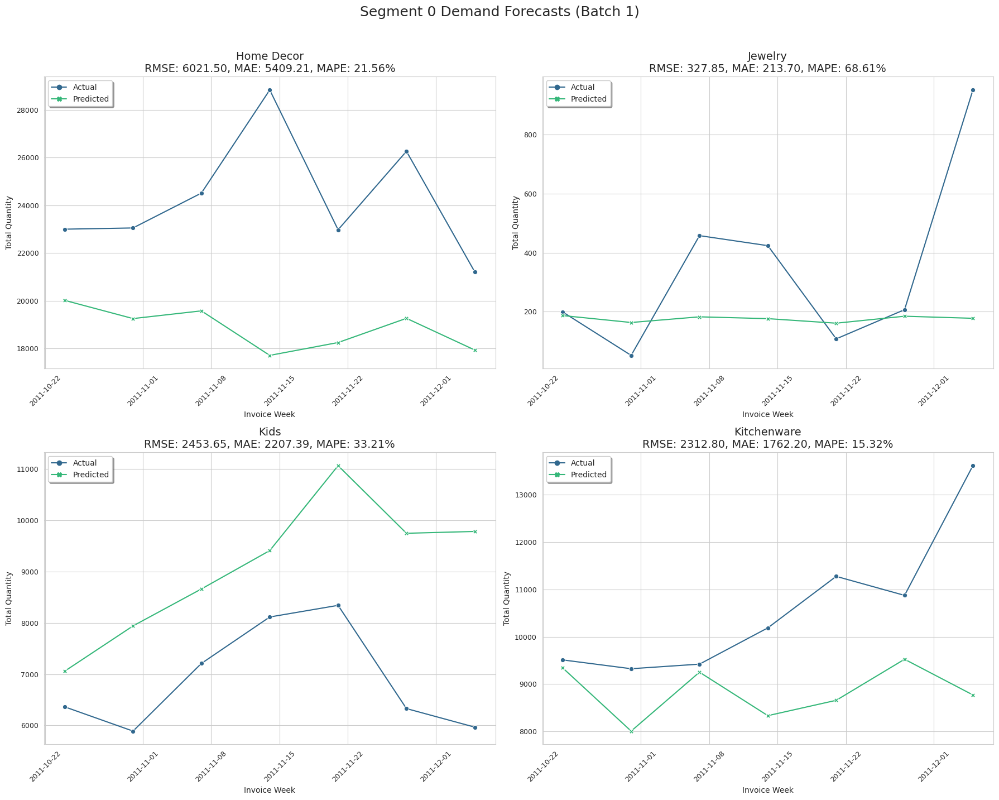

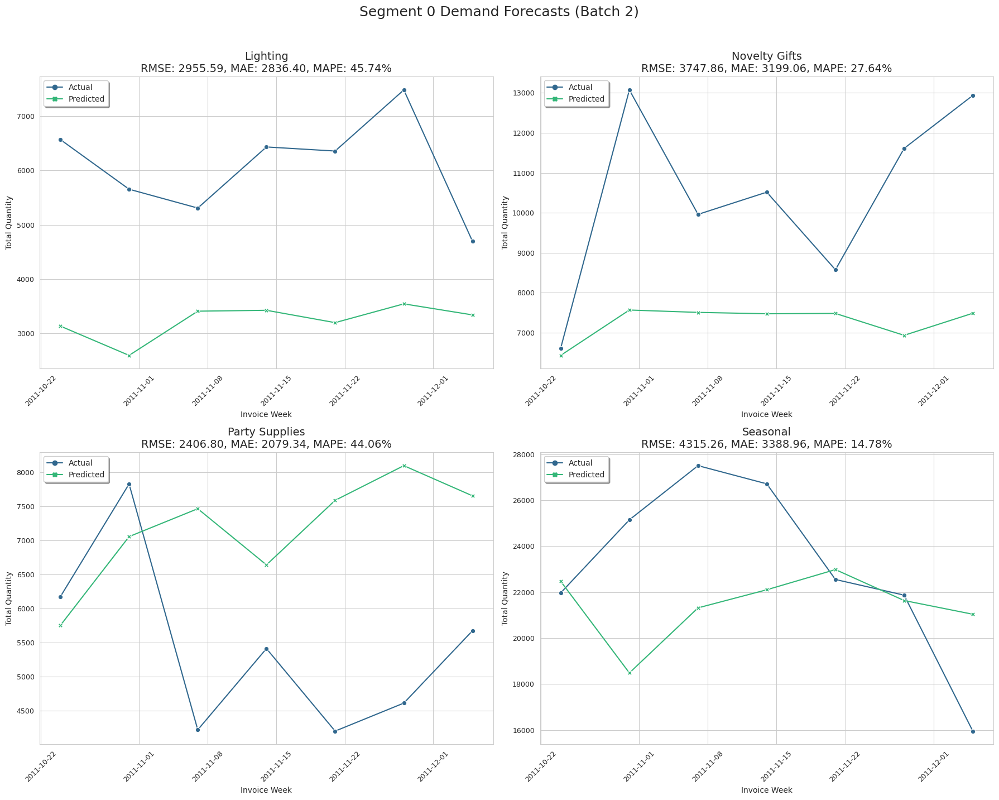

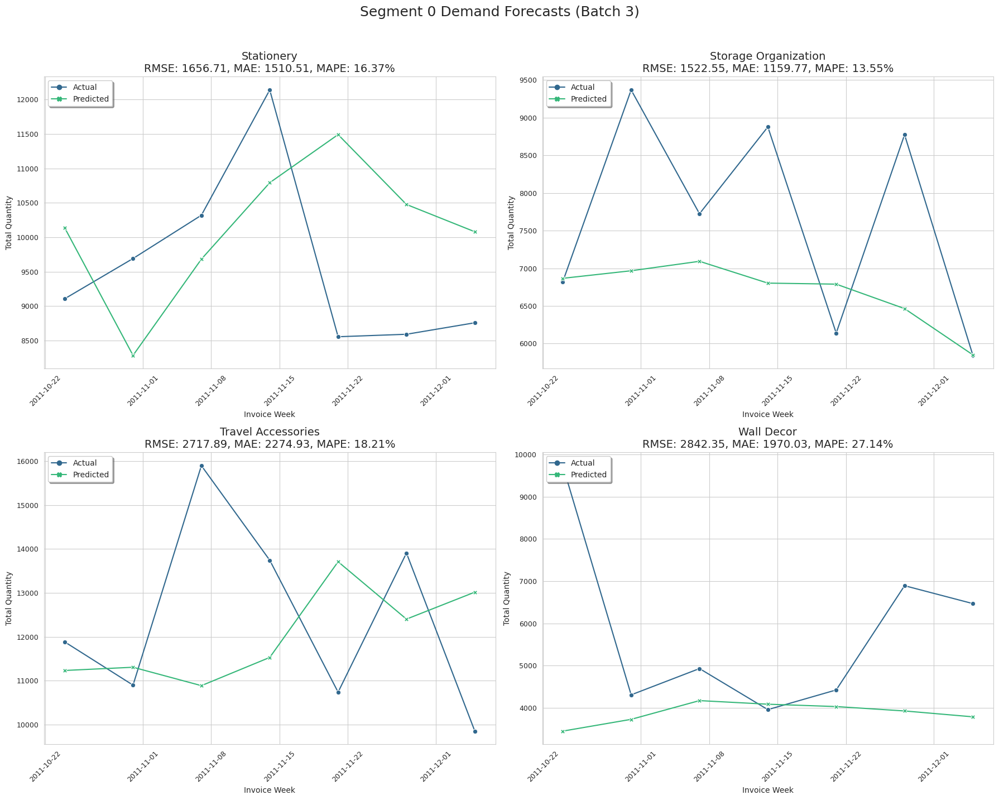

In [38]:
print(f"** Modeling for Segment {segment_id} (Mainstream Customers) using XGBoost Regressor **")

X_pool = segment_data_splits[segment_id]['X_train_val_pool']
y_pool_dict = segment_data_splits[segment_id]['y_train_val_pool_dict']
tscv_splits = segment_data_splits[segment_id]['tscv_splits']
X_test = segment_data_splits[segment_id]['X_test']
y_test_dict = segment_data_splits[segment_id]['y_test_dict']
target_cols_segment = segment_data_splits[segment_id]['target_cols_segment']

# Prepare to store results
results_summary = []
predictions_for_plotting = {}

# Define the XGBoost Regressor base model
xgb_base_model = XGBRegressor(objective='reg:squarederror',
                              eval_metric='rmse',
                              n_estimators=1000,
                              learning_rate=0.05,
                              random_state=42,
                              n_jobs=-1)

# Define hyperparameters for RandomizedSearchCV
param_distributions = {
    'max_depth': [3, 5, 7, 9, 11, 13, 15],
    'min_child_weight': [1, 2, 3, 4, 5],
    'gamma': [0.0, 0.1, 0.2, 0.3, 0.4],
    'subsample': [0.6, 0.7, 0.8, 0.9, 1.0],
    'colsample_bytree': [0.6, 0.7, 0.8, 0.9, 1.0],
    'reg_alpha': [0, 0.001, 0.01, 0.1, 0.5, 1, 5, 10],
    'reg_lambda': [0, 0.001, 0.01, 0.1, 0.5, 1, 5, 10],
}

print(f"\nBeginning training for {len(target_cols_segment)} product categories in Segment {segment_id}...")

for target_product_category in target_cols_segment:
    print(f"\n--- Training XGBoost for target: {target_product_category} ---")

    y_pool_target = y_pool_dict[target_product_category]
    y_test_target = y_test_dict[target_product_category]

    # Initialize RandomizedSearchCV for the current target
    random_search = RandomizedSearchCV(
        estimator=xgb_base_model,
        param_distributions=param_distributions,
        n_iter=50,
        scoring='neg_mean_squared_error',
        cv=tscv_splits,
        verbose=0,
        random_state=42,
        n_jobs=-1,
        return_train_score=False 
    )

    # Fit RandomizedSearchCV
    print(f"  Starting RandomizedSearchCV for {target_product_category}...")
    random_search.fit(X_pool, y_pool_target)
    print(f"  Best params for {target_product_category}: {random_search.best_params_}")

    # Train the final model with the best parameters on the full training+validation pool
    best_xgb_model = random_search.best_estimator_
    best_xgb_model.fit(X_pool, y_pool_target)

    # Make predictions on the hold-out test set
    predictions = best_xgb_model.predict(X_test)
    predictions[predictions < 0] = 0 # Ensure predictions are non-negative

    # Evaluate the model
    rmse = np.sqrt(mean_squared_error(y_test_target, predictions))
    mae = mean_absolute_error(y_test_target, predictions)
    mape = mean_absolute_percentage_error(y_test_target, predictions)

    results_summary.append({
        'Product_Category': target_product_category.replace('_Total_Quantity', ''),
        'RMSE': rmse,
        'MAE': mae,
        'MAPE': mape
    })

    # Store actuals and predictions for plotting, using the test set's original index
    predictions_for_plotting[target_product_category] = pd.DataFrame({
        'Actual': y_test_target,
        'Predicted': predictions
    }, index=X_test.index)

print("\n--- All models trained and evaluated. ---")

# --- Display Summary Table Statistics ---
print("\n** Segment 0: XGBoost Regressor Performance Summary (Test Set) **")
summary_df = pd.DataFrame(results_summary).set_index('Product_Category')
display(summary_df.sort_values(by='MAPE', ascending=True))

# --- Visualize Predictions for Each Product Category (Revised for clarity) ---
print("\n** Segment 0: XGBoost Regressor - Actual vs. Predicted Demand (Test Set Visuals) **")

sns.set_style("whitegrid")
# Set a custom color palette for better differentiation
colors = sns.color_palette("viridis", n_colors=2) # Or any other suitable palette

# Determine how many plots per figure. Adjust this number based on how many categories you have
# and how large you want each subplot to be. 4 or 6 usually works well.
plots_per_figure = 4 # Example: 2 rows x 2 columns

num_plots = len(predictions_for_plotting)
rows_per_figure = int(np.ceil(plots_per_figure / 2)) # For 2 columns
cols_per_figure = 2

# Iterate through categories and plot in batches
for i, (category, data) in enumerate(predictions_for_plotting.items()):
    # Start a new figure for every 'plots_per_figure' categories
    if i % plots_per_figure == 0:
        if i > 0: # Close the previous figure if not the first batch
            plt.tight_layout()
            plt.show()
        
        # Create a new figure for the current batch
        plt.figure(figsize=(18, 7 * rows_per_figure)) # Adjust overall figure size as needed
        plt.suptitle(f'Segment 0 Demand Forecasts (Batch {int(i/plots_per_figure) + 1})', fontsize=18, y=1.02)


    # Calculate subplot position within the current figure
    subplot_idx = (i % plots_per_figure) + 1
    ax = plt.subplot(rows_per_figure, cols_per_figure, subplot_idx)

    product_name = category.replace('_Total_Quantity', '').replace('_', ' ').title() # Clean name for title

    # Get RMSE, MAE, and MAPE for this specific category to display on the plot
    try:
        category_metrics = summary_df.loc[product_name.lower().replace(' ', '_')]
        rmse_val = category_metrics['RMSE']
        mae_val = category_metrics['MAE']
        mape_val = category_metrics['MAPE']
        plot_title_metrics = f'\nRMSE: {rmse_val:.2f}, MAE: {mae_val:.2f}, MAPE: {mape_val:.2f}%'
    except KeyError:
        plot_title_metrics = "\nMetrics N/A"

    sns.lineplot(data=data, ax=ax, markers=True, dashes=False, palette=colors)
    
    ax.set_title(f'{product_name}{plot_title_metrics}', fontsize=14)
    ax.set_xlabel('Invoice Week', fontsize=10)
    ax.set_ylabel('Total Quantity', fontsize=10)
    
    ax.tick_params(axis='x', rotation=45, labelsize=9)
    ax.tick_params(axis='y', labelsize=9)
    
    ax.legend(loc='upper left', fontsize=10, frameon=True, fancybox=True, shadow=True)

plt.tight_layout()
plt.show()

## Linear Regression: For Segment 0(Mainstream Customers)

** Modeling for Segment 0 (Mainstream Customers) using Linear Regression **

Beginning training for 12 product categories in Segment 0 using Linear Regression...

--- Training Linear Regression for target: home_decor_Total_Quantity ---
  Starting Linear Regression training for home_decor_Total_Quantity...

--- Training Linear Regression for target: jewelry_Total_Quantity ---
  Starting Linear Regression training for jewelry_Total_Quantity...

--- Training Linear Regression for target: kids_Total_Quantity ---
  Starting Linear Regression training for kids_Total_Quantity...

--- Training Linear Regression for target: kitchenware_Total_Quantity ---
  Starting Linear Regression training for kitchenware_Total_Quantity...

--- Training Linear Regression for target: lighting_Total_Quantity ---
  Starting Linear Regression training for lighting_Total_Quantity...

--- Training Linear Regression for target: novelty_gifts_Total_Quantity ---
  Starting Linear Regression training for novelty_gifts_

,RMSE,MAE,MAPE
Product_Category,,,
kids,1807.565545,1532.926700,23.017803
seasonal,7073.953427,5678.000215,23.092135
party_supplies,1571.259599,1286.455980,24.365844
home_decor,10358.922795,8953.448494,36.366829
kitchenware,5067.619103,4090.537472,38.138873
travel_accessories,6263.773271,5596.848270,44.645899
lighting,3319.759684,2891.521854,46.179778
stationery,6041.279539,5218.461229,52.492312
jewelry,341.338905,189.603159,54.780084



** Segment 0: Linear Regression - Actual vs. Predicted Demand (Test Set Visuals) **


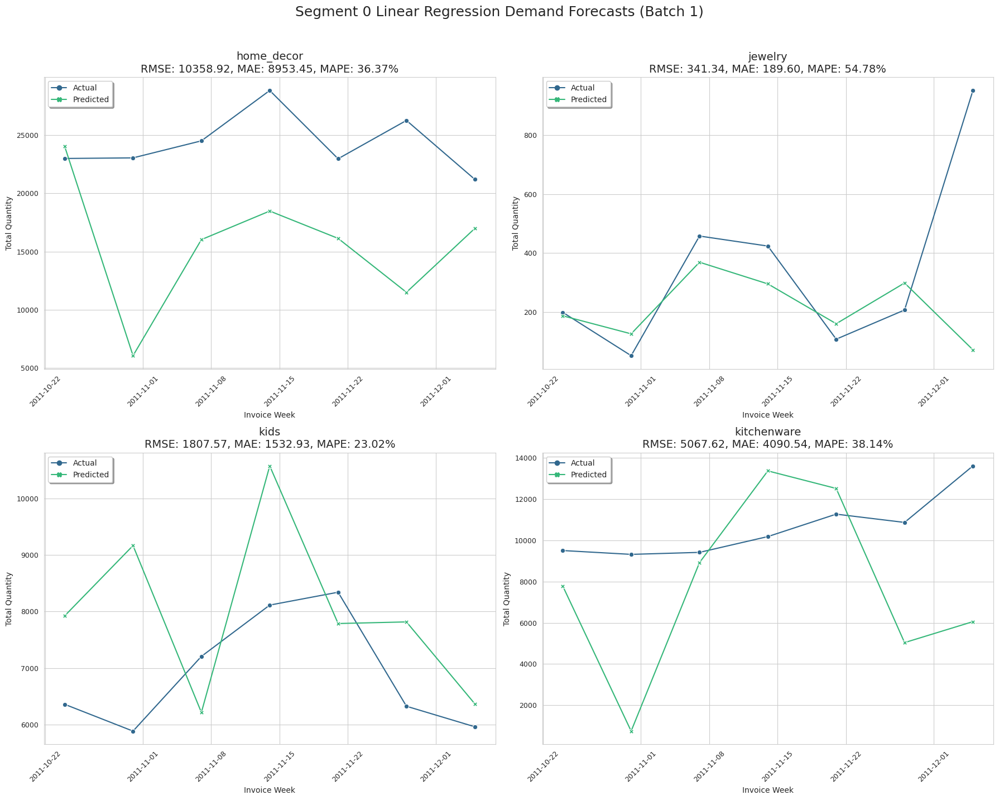

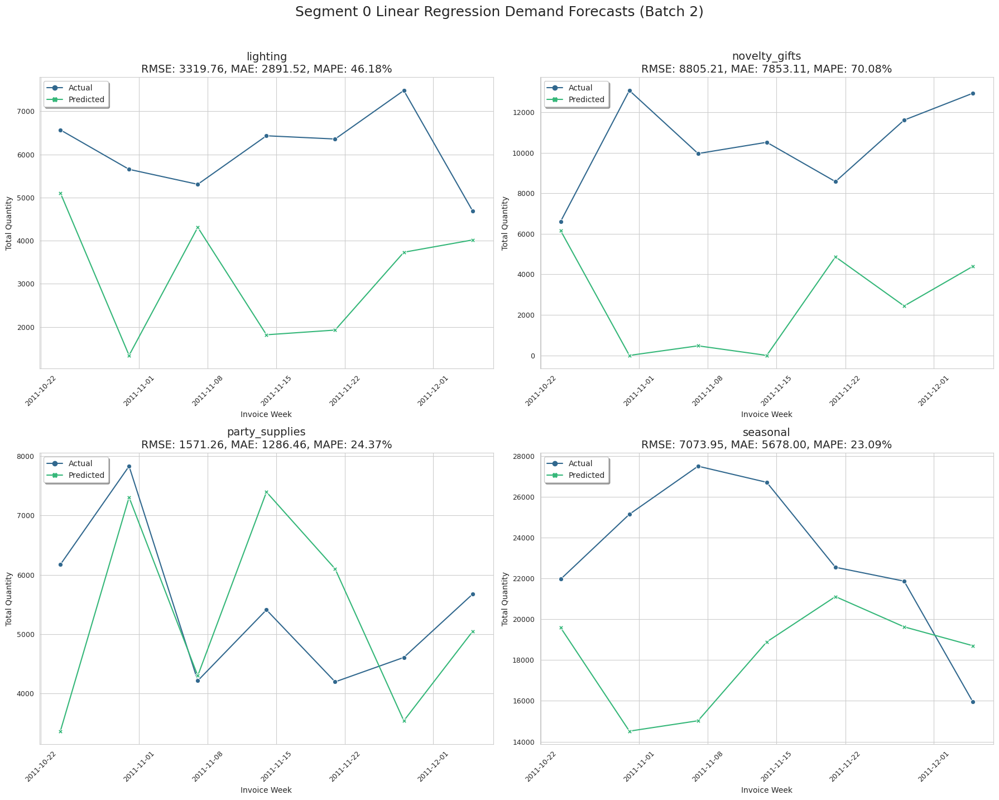

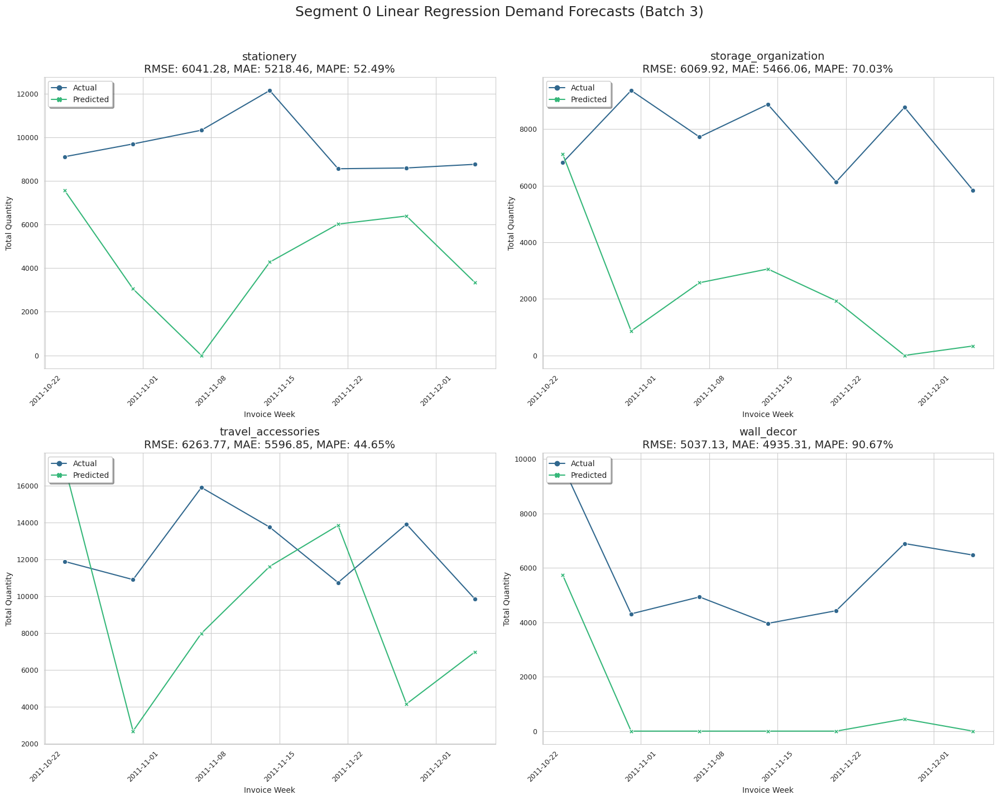


Visualizations for Segment 0 product categories (Linear Regression) complete.


In [40]:
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import MinMaxScaler

print(f"** Modeling for Segment {segment_id} (Mainstream Customers) using Linear Regression **")

X_pool = segment_data_splits[segment_id]['X_train_val_pool']
y_pool_dict = segment_data_splits[segment_id]['y_train_val_pool_dict']
tscv_splits = segment_data_splits[segment_id]['tscv_splits']
X_test = segment_data_splits[segment_id]['X_test']
y_test_dict = segment_data_splits[segment_id]['y_test_dict']
target_cols_segment = segment_data_splits[segment_id]['target_cols_segment']

# Prepare to store results for Linear Regression
results_summary_lr = []
predictions_for_plotting_lr = {}

print(f"\nBeginning training for {len(target_cols_segment)} product categories in Segment {segment_id} using Linear Regression...")

for target_product_category in target_cols_segment:
    print(f"\n--- Training Linear Regression for target: {target_product_category} ---")

    y_pool_target = y_pool_dict[target_product_category]
    y_test_target = y_test_dict[target_product_category]

    # --- Scaling ---
    # Scaler for features (fit on X_pool only)
    feature_scaler_lr = MinMaxScaler()
    scaled_X_pool_lr = feature_scaler_lr.fit_transform(X_pool)
    scaled_X_test_lr = feature_scaler_lr.transform(X_test)
    
    # Scaler for target (fit on y_pool_target only)
    target_scaler_lr = MinMaxScaler()
    scaled_y_pool_target_lr = target_scaler_lr.fit_transform(y_pool_target.values.reshape(-1, 1)).flatten()
    scaled_y_test_target_lr = target_scaler_lr.transform(y_test_target.values.reshape(-1, 1)).flatten()

    # --- Build and Train the Linear Regression Model ---
    model_lr = LinearRegression()
    
    print(f"  Starting Linear Regression training for {target_product_category}...")
    model_lr.fit(scaled_X_pool_lr, scaled_y_pool_target_lr)

    # --- Make predictions ---
    predictions_scaled_lr = model_lr.predict(scaled_X_test_lr)
    
    # --- Inverse transform predictions and actuals ---
    predictions_lr = target_scaler_lr.inverse_transform(predictions_scaled_lr.reshape(-1, 1)).flatten()
    actuals_lr = target_scaler_lr.inverse_transform(scaled_y_test_target_lr.reshape(-1, 1)).flatten()

    # Ensure predictions are non-negative, as demand cannot be negative
    predictions_lr[predictions_lr < 0] = 0

    # --- Evaluate the model (Test Data only, for summary table) ---
    rmse_lr = np.sqrt(mean_squared_error(actuals_lr, predictions_lr))
    mae_lr = mean_absolute_error(actuals_lr, predictions_lr)
    mape_lr = mean_absolute_percentage_error(actuals_lr, predictions_lr)

    results_summary_lr.append({
        'Product_Category': target_product_category.replace('_Total_Quantity', ''),
        'RMSE': rmse_lr,
        'MAE': mae_lr,
        'MAPE': mape_lr
    })

    # Store actuals and predictions for plotting
    predictions_for_plotting_lr[target_product_category] = pd.DataFrame({
        'Actual': actuals_lr,
        'Predicted': predictions_lr
    }, index=X_test.index) # Use the original X_test indices for correct alignment

print("\n--- All Linear Regression models trained and evaluated. ---")

# --- Display Summary Table Statistics ---
print("\n** Segment 0: Linear Regression Performance Summary (Test Set) **")
summary_df_lr = pd.DataFrame(results_summary_lr).set_index('Product_Category')
display(summary_df_lr.sort_values(by='MAPE', ascending=True))

# --- Visualize Predictions for Each Product Category ---
print("\n** Segment 0: Linear Regression - Actual vs. Predicted Demand (Test Set Visuals) **")

sns.set_style("whitegrid")
colors = sns.color_palette("viridis", n_colors=2)
plots_per_figure = 4
rows_per_figure = int(np.ceil(plots_per_figure / 2))
cols_per_figure = 2

# Get the order of categories from the sorted summary_df
ordered_categories_display_name_lr = summary_df_lr.index.tolist()

for i, display_name in enumerate(ordered_categories_display_name_lr):
    # Reconstruct the original full category name used as key in predictions_for_plotting
    category_key = display_name.replace(' ', '_') + '_Total_Quantity' 
    
    data = predictions_for_plotting_lr[category_key]

    if i % plots_per_figure == 0:
        if i > 0:
            plt.tight_layout()
            plt.show()
        
        plt.figure(figsize=(18, 7 * rows_per_figure))
        plt.suptitle(f'Segment 0 Linear Regression Demand Forecasts (Batch {int(i/plots_per_figure) + 1})', fontsize=18, y=1.02)

    subplot_idx = (i % plots_per_figure) + 1
    ax = plt.subplot(rows_per_figure, cols_per_figure, subplot_idx)

    # Use the cleaned display_name for the plot title
    product_name = display_name

    category_metrics = summary_df_lr.loc[display_name]
    rmse_val = category_metrics['RMSE']
    mae_val = category_metrics['MAE']
    mape_val = category_metrics['MAPE']
    plot_title_metrics = f'\nRMSE: {rmse_val:.2f}, MAE: {mae_val:.2f}, MAPE: {mape_val:.2f}%'

    sns.lineplot(data=data, ax=ax, markers=True, dashes=False, palette=colors)
    
    ax.set_title(f'{product_name}{plot_title_metrics}', fontsize=14)
    ax.set_xlabel('Invoice Week', fontsize=10)
    ax.set_ylabel('Total Quantity', fontsize=10)
    
    ax.tick_params(axis='x', rotation=45, labelsize=9)
    ax.tick_params(axis='y', labelsize=9)
    
    ax.legend(loc='upper left', fontsize=10, frameon=True, fancybox=True, shadow=True)

plt.tight_layout()
plt.show()

print("\nVisualizations for Segment 0 product categories (Linear Regression) complete.")

## LSTM: For Segment 0(Mainstream Customers)

[I 2025-07-13 15:47:46,109] A new study created in memory with name: no-name-5dafe61d-84fe-4012-843a-efd408ed719a


Using device: cuda
** Modeling for Segment 0 (Loyalist) using LSTM **

--- Tuning and training LSTM for target: home_decor_Total_Quantity ---


[I 2025-07-13 15:47:46,509] Trial 0 finished with value: 2886.439453125 and parameters: {'look_back': 12, 'lstm_units': 93, 'dropout': 0.16891032330567013, 'batch_size': 128, 'lr': 0.006984640971733761, 'epochs': 98, 'patience': 16}. Best is trial 0 with value: 2886.439453125.
[I 2025-07-13 15:47:46,875] Trial 1 finished with value: 2347.823974609375 and parameters: {'look_back': 21, 'lstm_units': 121, 'dropout': 0.44704755478378577, 'batch_size': 128, 'lr': 0.0011396423517710539, 'epochs': 96, 'patience': 25}. Best is trial 1 with value: 2347.823974609375.
[I 2025-07-13 15:47:47,069] Trial 2 finished with value: 2978.23095703125 and parameters: {'look_back': 6, 'lstm_units': 51, 'dropout': 0.4570508211487101, 'batch_size': 64, 'lr': 0.009327091806136516, 'epochs': 51, 'patience': 22}. Best is trial 1 with value: 2347.823974609375.
[I 2025-07-13 15:47:47,128] Trial 3 finished with value: 2597.40478515625 and parameters: {'look_back': 15, 'lstm_units': 70, 'dropout': 0.23162373658659346

  Best parameters for home_decor_Total_Quantity: {'look_back': 19, 'lstm_units': 100, 'dropout': 0.47960194058745265, 'batch_size': 128, 'lr': 0.008234795345527606, 'epochs': 63, 'patience': 24}
  Training final model for home_decor_Total_Quantity with best params...

--- Tuning and training LSTM for target: jewelry_Total_Quantity ---


[I 2025-07-13 15:47:52,633] A new study created in memory with name: no-name-a1c20511-f07c-47eb-a52d-6fc0a06391b0
[I 2025-07-13 15:47:52,826] Trial 0 finished with value: 226.6226043701172 and parameters: {'look_back': 13, 'lstm_units': 90, 'dropout': 0.12407675690109798, 'batch_size': 128, 'lr': 0.0027679188680340833, 'epochs': 54, 'patience': 14}. Best is trial 0 with value: 226.6226043701172.
[I 2025-07-13 15:47:53,032] Trial 1 finished with value: 219.37757873535156 and parameters: {'look_back': 14, 'lstm_units': 74, 'dropout': 0.05336056957462526, 'batch_size': 64, 'lr': 0.003244033000376634, 'epochs': 52, 'patience': 20}. Best is trial 1 with value: 219.37757873535156.
[I 2025-07-13 15:47:53,148] Trial 2 finished with value: 249.2689666748047 and parameters: {'look_back': 15, 'lstm_units': 49, 'dropout': 0.26056138776483484, 'batch_size': 64, 'lr': 0.008134855749739323, 'epochs': 80, 'patience': 29}. Best is trial 1 with value: 219.37757873535156.
[I 2025-07-13 15:47:53,466] Tria

  Best parameters for jewelry_Total_Quantity: {'look_back': 8, 'lstm_units': 70, 'dropout': 0.15213396941103197, 'batch_size': 32, 'lr': 0.003952702422954559, 'epochs': 82, 'patience': 22}
  Training final model for jewelry_Total_Quantity with best params...


[I 2025-07-13 15:48:02,108] A new study created in memory with name: no-name-68c9aaf2-2bd5-498f-bc14-c3d4e08fc88b
[I 2025-07-13 15:48:02,221] Trial 0 finished with value: 2148.9580078125 and parameters: {'look_back': 18, 'lstm_units': 58, 'dropout': 0.48390139999031684, 'batch_size': 32, 'lr': 0.006868005703484718, 'epochs': 53, 'patience': 20}. Best is trial 0 with value: 2148.9580078125.



--- Tuning and training LSTM for target: kids_Total_Quantity ---


[I 2025-07-13 15:48:02,362] Trial 1 finished with value: 1184.896240234375 and parameters: {'look_back': 8, 'lstm_units': 75, 'dropout': 0.07634241480445786, 'batch_size': 128, 'lr': 0.007986003226377034, 'epochs': 76, 'patience': 30}. Best is trial 1 with value: 1184.896240234375.
[I 2025-07-13 15:48:02,462] Trial 2 finished with value: 1101.087646484375 and parameters: {'look_back': 18, 'lstm_units': 52, 'dropout': 0.18525564084732765, 'batch_size': 128, 'lr': 0.005281285165851057, 'epochs': 78, 'patience': 21}. Best is trial 2 with value: 1101.087646484375.
[I 2025-07-13 15:48:02,591] Trial 3 finished with value: 2336.70654296875 and parameters: {'look_back': 20, 'lstm_units': 93, 'dropout': 0.059729707072853855, 'batch_size': 32, 'lr': 0.007360853132586636, 'epochs': 91, 'patience': 29}. Best is trial 2 with value: 1101.087646484375.
[I 2025-07-13 15:48:02,705] Trial 4 finished with value: 2722.609375 and parameters: {'look_back': 15, 'lstm_units': 115, 'dropout': 0.462348287693698

  Best parameters for kids_Total_Quantity: {'look_back': 16, 'lstm_units': 33, 'dropout': 0.34175847563646233, 'batch_size': 128, 'lr': 0.0007039157759409194, 'epochs': 67, 'patience': 23}
  Training final model for kids_Total_Quantity with best params...

--- Tuning and training LSTM for target: kitchenware_Total_Quantity ---


[I 2025-07-13 15:48:07,623] Trial 0 finished with value: 2284.947021484375 and parameters: {'look_back': 20, 'lstm_units': 66, 'dropout': 0.06924822528168295, 'batch_size': 32, 'lr': 0.0028508910095733845, 'epochs': 76, 'patience': 23}. Best is trial 0 with value: 2284.947021484375.
[I 2025-07-13 15:48:07,820] Trial 1 finished with value: 2717.841552734375 and parameters: {'look_back': 15, 'lstm_units': 58, 'dropout': 0.09005381714707783, 'batch_size': 32, 'lr': 0.0030095060039133344, 'epochs': 67, 'patience': 12}. Best is trial 0 with value: 2284.947021484375.
[I 2025-07-13 15:48:08,027] Trial 2 finished with value: 2060.884033203125 and parameters: {'look_back': 10, 'lstm_units': 64, 'dropout': 0.36240074700744185, 'batch_size': 128, 'lr': 0.0006845437584701272, 'epochs': 66, 'patience': 26}. Best is trial 2 with value: 2060.884033203125.
[I 2025-07-13 15:48:08,325] Trial 3 finished with value: 2964.732666015625 and parameters: {'look_back': 9, 'lstm_units': 69, 'dropout': 0.01348846

  Best parameters for kitchenware_Total_Quantity: {'look_back': 16, 'lstm_units': 89, 'dropout': 0.2476078743003719, 'batch_size': 64, 'lr': 0.00013795031947424347, 'epochs': 59, 'patience': 30}
  Training final model for kitchenware_Total_Quantity with best params...


[I 2025-07-13 15:48:15,980] A new study created in memory with name: no-name-cc280b9a-33e6-4c93-8ca4-1e82d80ddbf5



--- Tuning and training LSTM for target: lighting_Total_Quantity ---


[I 2025-07-13 15:48:16,581] Trial 0 finished with value: 2858.172119140625 and parameters: {'look_back': 6, 'lstm_units': 62, 'dropout': 0.06258351449883376, 'batch_size': 32, 'lr': 0.007353942185558356, 'epochs': 81, 'patience': 27}. Best is trial 0 with value: 2858.172119140625.
[I 2025-07-13 15:48:17,009] Trial 1 finished with value: 2838.46142578125 and parameters: {'look_back': 16, 'lstm_units': 96, 'dropout': 0.06015711912645327, 'batch_size': 128, 'lr': 0.008208187091562628, 'epochs': 90, 'patience': 19}. Best is trial 1 with value: 2838.46142578125.
[I 2025-07-13 15:48:17,129] Trial 2 finished with value: 4017.310546875 and parameters: {'look_back': 15, 'lstm_units': 94, 'dropout': 0.24981364967190245, 'batch_size': 32, 'lr': 0.009862688254891913, 'epochs': 94, 'patience': 12}. Best is trial 1 with value: 2838.46142578125.
[I 2025-07-13 15:48:17,317] Trial 3 finished with value: 3574.354248046875 and parameters: {'look_back': 13, 'lstm_units': 85, 'dropout': 0.32874345281349804

  Best parameters for lighting_Total_Quantity: {'look_back': 18, 'lstm_units': 127, 'dropout': 0.03574485354875728, 'batch_size': 128, 'lr': 0.0030869510163290476, 'epochs': 61, 'patience': 30}
  Training final model for lighting_Total_Quantity with best params...


[I 2025-07-13 15:48:24,883] A new study created in memory with name: no-name-8659ce34-5466-4c89-a8f3-54d37ac456df



--- Tuning and training LSTM for target: novelty_gifts_Total_Quantity ---


[I 2025-07-13 15:48:25,376] Trial 0 finished with value: 3222.25 and parameters: {'look_back': 7, 'lstm_units': 88, 'dropout': 0.2828920309483599, 'batch_size': 32, 'lr': 0.004207690536350746, 'epochs': 88, 'patience': 23}. Best is trial 0 with value: 3222.25.
[I 2025-07-13 15:48:25,572] Trial 1 finished with value: 3213.711181640625 and parameters: {'look_back': 10, 'lstm_units': 34, 'dropout': 0.02264037703096239, 'batch_size': 64, 'lr': 0.0023247673094309376, 'epochs': 52, 'patience': 29}. Best is trial 1 with value: 3213.711181640625.
[I 2025-07-13 15:48:25,700] Trial 2 finished with value: 4279.36181640625 and parameters: {'look_back': 8, 'lstm_units': 71, 'dropout': 0.4965742768766344, 'batch_size': 128, 'lr': 0.0051554465908235534, 'epochs': 51, 'patience': 21}. Best is trial 1 with value: 3213.711181640625.
[I 2025-07-13 15:48:25,807] Trial 3 finished with value: 3498.712646484375 and parameters: {'look_back': 6, 'lstm_units': 106, 'dropout': 0.380907350590407, 'batch_size': 12

  Best parameters for novelty_gifts_Total_Quantity: {'look_back': 19, 'lstm_units': 115, 'dropout': 0.09118868454200107, 'batch_size': 32, 'lr': 0.0046883949010420485, 'epochs': 68, 'patience': 12}
  Training final model for novelty_gifts_Total_Quantity with best params...

--- Tuning and training LSTM for target: party_supplies_Total_Quantity ---


[I 2025-07-13 15:48:31,288] Trial 0 finished with value: 1683.185791015625 and parameters: {'look_back': 15, 'lstm_units': 120, 'dropout': 0.14291620916243503, 'batch_size': 64, 'lr': 0.0012702044181874296, 'epochs': 65, 'patience': 25}. Best is trial 0 with value: 1683.185791015625.
[I 2025-07-13 15:48:31,793] Trial 1 finished with value: 2344.905029296875 and parameters: {'look_back': 11, 'lstm_units': 91, 'dropout': 0.20736222047693548, 'batch_size': 32, 'lr': 0.0021561491585239453, 'epochs': 83, 'patience': 24}. Best is trial 0 with value: 1683.185791015625.
[I 2025-07-13 15:48:31,899] Trial 2 finished with value: 1112.1097412109375 and parameters: {'look_back': 17, 'lstm_units': 112, 'dropout': 0.20921743288138644, 'batch_size': 32, 'lr': 0.007523454986963483, 'epochs': 94, 'patience': 13}. Best is trial 2 with value: 1112.1097412109375.
[I 2025-07-13 15:48:32,248] Trial 3 finished with value: 1731.8050537109375 and parameters: {'look_back': 13, 'lstm_units': 70, 'dropout': 0.1777

  Best parameters for party_supplies_Total_Quantity: {'look_back': 10, 'lstm_units': 128, 'dropout': 0.18201873392294082, 'batch_size': 128, 'lr': 0.008507203330953356, 'epochs': 86, 'patience': 28}
  Training final model for party_supplies_Total_Quantity with best params...

--- Tuning and training LSTM for target: seasonal_Total_Quantity ---


[I 2025-07-13 15:48:38,958] Trial 0 finished with value: 5593.85693359375 and parameters: {'look_back': 10, 'lstm_units': 50, 'dropout': 0.2413359051841224, 'batch_size': 64, 'lr': 0.0011279245835544391, 'epochs': 94, 'patience': 17}. Best is trial 0 with value: 5593.85693359375.
[I 2025-07-13 15:48:39,071] Trial 1 finished with value: 2902.93701171875 and parameters: {'look_back': 6, 'lstm_units': 91, 'dropout': 0.02432665791515265, 'batch_size': 64, 'lr': 0.004299178865212108, 'epochs': 75, 'patience': 24}. Best is trial 1 with value: 2902.93701171875.
[I 2025-07-13 15:48:39,170] Trial 2 finished with value: 3049.774658203125 and parameters: {'look_back': 16, 'lstm_units': 75, 'dropout': 0.046603345307259014, 'batch_size': 32, 'lr': 0.008454284343782556, 'epochs': 84, 'patience': 16}. Best is trial 1 with value: 2902.93701171875.
[I 2025-07-13 15:48:39,243] Trial 3 finished with value: 4798.27197265625 and parameters: {'look_back': 9, 'lstm_units': 58, 'dropout': 0.49734671895555843,

  Best parameters for seasonal_Total_Quantity: {'look_back': 6, 'lstm_units': 91, 'dropout': 0.02432665791515265, 'batch_size': 64, 'lr': 0.004299178865212108, 'epochs': 75, 'patience': 24}
  Training final model for seasonal_Total_Quantity with best params...

--- Tuning and training LSTM for target: stationery_Total_Quantity ---


[I 2025-07-13 15:48:44,696] Trial 1 finished with value: 1192.3851318359375 and parameters: {'look_back': 13, 'lstm_units': 105, 'dropout': 0.48084551752959465, 'batch_size': 128, 'lr': 0.004819277787522202, 'epochs': 70, 'patience': 17}. Best is trial 0 with value: 1182.7017822265625.
[I 2025-07-13 15:48:44,971] Trial 2 finished with value: 829.6596069335938 and parameters: {'look_back': 5, 'lstm_units': 89, 'dropout': 0.011512191453334708, 'batch_size': 64, 'lr': 0.0020355047044671, 'epochs': 66, 'patience': 12}. Best is trial 2 with value: 829.6596069335938.
[I 2025-07-13 15:48:45,507] Trial 3 finished with value: 2236.615234375 and parameters: {'look_back': 9, 'lstm_units': 53, 'dropout': 0.29002880558816857, 'batch_size': 32, 'lr': 0.007179793722679536, 'epochs': 92, 'patience': 25}. Best is trial 2 with value: 829.6596069335938.
[I 2025-07-13 15:48:46,078] Trial 4 finished with value: 1283.7767333984375 and parameters: {'look_back': 6, 'lstm_units': 41, 'dropout': 0.1338270909854

  Best parameters for stationery_Total_Quantity: {'look_back': 5, 'lstm_units': 89, 'dropout': 0.011512191453334708, 'batch_size': 64, 'lr': 0.0020355047044671, 'epochs': 66, 'patience': 12}
  Training final model for stationery_Total_Quantity with best params...

--- Tuning and training LSTM for target: storage_organization_Total_Quantity ---


[I 2025-07-13 15:48:51,358] Trial 1 finished with value: 1371.213134765625 and parameters: {'look_back': 19, 'lstm_units': 107, 'dropout': 0.4215168873192143, 'batch_size': 128, 'lr': 0.004172365867784617, 'epochs': 75, 'patience': 17}. Best is trial 0 with value: 1336.3797607421875.
[I 2025-07-13 15:48:51,570] Trial 2 finished with value: 1292.3240966796875 and parameters: {'look_back': 13, 'lstm_units': 73, 'dropout': 0.06661775667637942, 'batch_size': 32, 'lr': 0.00917022968961588, 'epochs': 50, 'patience': 29}. Best is trial 2 with value: 1292.3240966796875.
[I 2025-07-13 15:48:51,781] Trial 3 finished with value: 1228.5107421875 and parameters: {'look_back': 15, 'lstm_units': 45, 'dropout': 0.13413828344482887, 'batch_size': 32, 'lr': 0.0015704376726918164, 'epochs': 57, 'patience': 22}. Best is trial 3 with value: 1228.5107421875.
[I 2025-07-13 15:48:51,922] Trial 4 finished with value: 1725.558349609375 and parameters: {'look_back': 16, 'lstm_units': 88, 'dropout': 0.33465505669

  Best parameters for storage_organization_Total_Quantity: {'look_back': 15, 'lstm_units': 68, 'dropout': 0.15617070671511835, 'batch_size': 32, 'lr': 0.00989694439758083, 'epochs': 70, 'patience': 20}
  Training final model for storage_organization_Total_Quantity with best params...

--- Tuning and training LSTM for target: travel_accessories_Total_Quantity ---


[I 2025-07-13 15:48:57,695] Trial 0 finished with value: 2599.066162109375 and parameters: {'look_back': 21, 'lstm_units': 91, 'dropout': 0.10174475284194345, 'batch_size': 128, 'lr': 0.006821648617349332, 'epochs': 62, 'patience': 23}. Best is trial 0 with value: 2599.066162109375.
[I 2025-07-13 15:48:58,063] Trial 1 finished with value: 2455.564697265625 and parameters: {'look_back': 14, 'lstm_units': 122, 'dropout': 0.26410438658583446, 'batch_size': 64, 'lr': 0.007748170664063773, 'epochs': 84, 'patience': 30}. Best is trial 1 with value: 2455.564697265625.
[I 2025-07-13 15:48:58,340] Trial 2 finished with value: 2369.306640625 and parameters: {'look_back': 18, 'lstm_units': 81, 'dropout': 0.2233790118447901, 'batch_size': 32, 'lr': 0.002942073094837, 'epochs': 61, 'patience': 26}. Best is trial 2 with value: 2369.306640625.
[I 2025-07-13 15:48:58,525] Trial 3 finished with value: 2495.8203125 and parameters: {'look_back': 8, 'lstm_units': 58, 'dropout': 0.17506154374060762, 'batch

  Best parameters for travel_accessories_Total_Quantity: {'look_back': 15, 'lstm_units': 65, 'dropout': 0.40836502784859674, 'batch_size': 64, 'lr': 0.007223287659866004, 'epochs': 76, 'patience': 18}
  Training final model for travel_accessories_Total_Quantity with best params...


[I 2025-07-13 15:49:06,998] A new study created in memory with name: no-name-b2ea25ce-1b30-416d-8c6e-d9a13c135a9d



--- Tuning and training LSTM for target: wall_decor_Total_Quantity ---


[I 2025-07-13 15:49:07,322] Trial 0 finished with value: 2068.48193359375 and parameters: {'look_back': 18, 'lstm_units': 102, 'dropout': 0.12834351989756543, 'batch_size': 128, 'lr': 0.004500958997501046, 'epochs': 75, 'patience': 26}. Best is trial 0 with value: 2068.48193359375.
[I 2025-07-13 15:49:07,616] Trial 1 finished with value: 1736.006103515625 and parameters: {'look_back': 21, 'lstm_units': 34, 'dropout': 0.09027149939632678, 'batch_size': 64, 'lr': 0.0052248971934367025, 'epochs': 82, 'patience': 23}. Best is trial 1 with value: 1736.006103515625.
[I 2025-07-13 15:49:07,723] Trial 2 finished with value: 2155.619384765625 and parameters: {'look_back': 19, 'lstm_units': 125, 'dropout': 0.48353281034537104, 'batch_size': 32, 'lr': 0.004204561873865994, 'epochs': 91, 'patience': 10}. Best is trial 1 with value: 1736.006103515625.
[I 2025-07-13 15:49:08,123] Trial 3 finished with value: 1675.7337646484375 and parameters: {'look_back': 16, 'lstm_units': 82, 'dropout': 0.34160269

  Best parameters for wall_decor_Total_Quantity: {'look_back': 14, 'lstm_units': 91, 'dropout': 0.28676619258734903, 'batch_size': 128, 'lr': 0.0023893139725128893, 'epochs': 57, 'patience': 10}
  Training final model for wall_decor_Total_Quantity with best params...

--- All LSTM models trained and evaluated. ---

** Segment 0: LSTM with Optuna Tuning - Performance Summary (PyTorch) **


,RMSE,MAE,MAPE
Product_Category,,,
stationery,1394.091919,1157.360352,11.673205
kitchenware,1949.113159,1465.538818,12.618843
kids,1084.235962,990.505859,14.238775
storage_organization,1506.489258,1303.338257,16.272810
travel_accessories,3112.590820,2267.747314,16.355453
home_decor,4980.019043,4406.454102,17.444922
party_supplies,1206.267212,966.985535,18.381962
seasonal,5074.948730,4599.030273,19.899094
wall_decor,2249.544189,1502.462036,20.555010



** Segment 0: LSTM Regressor - Actual vs. Predicted Demand (Test Set Visuals) **


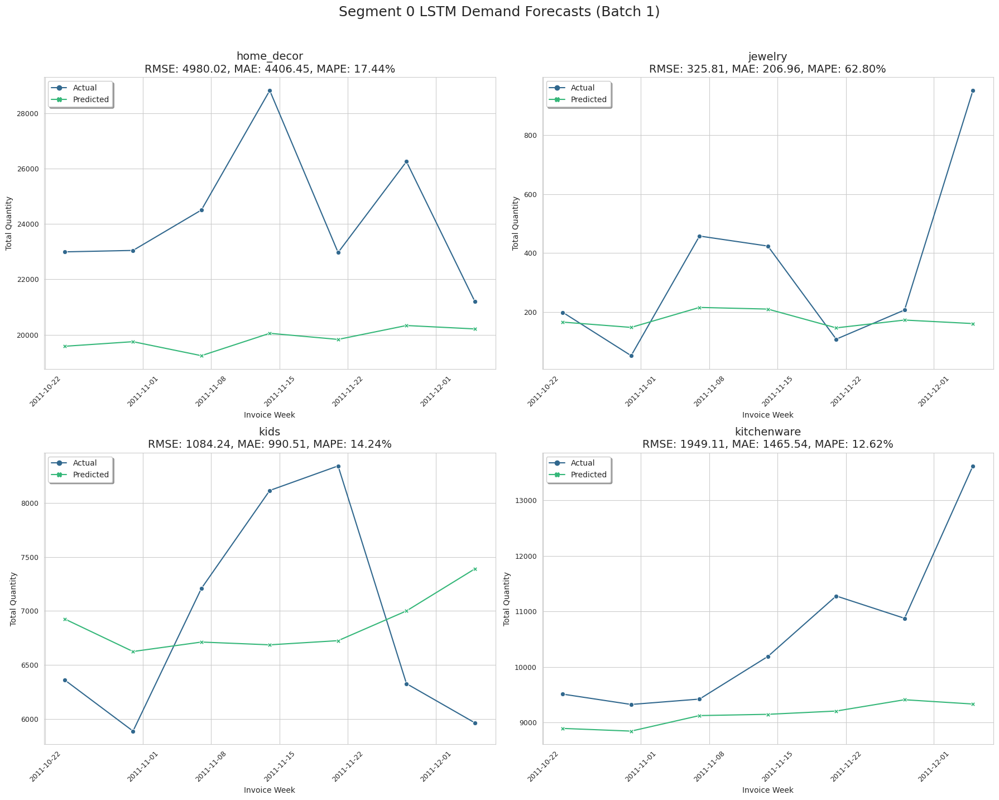

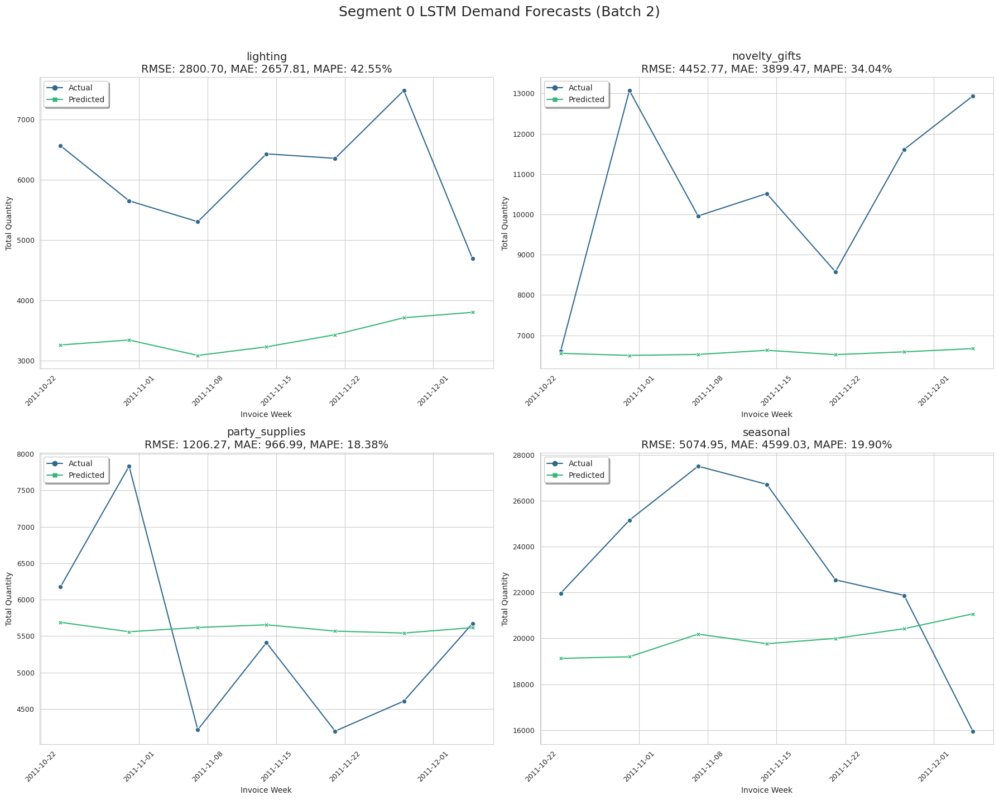

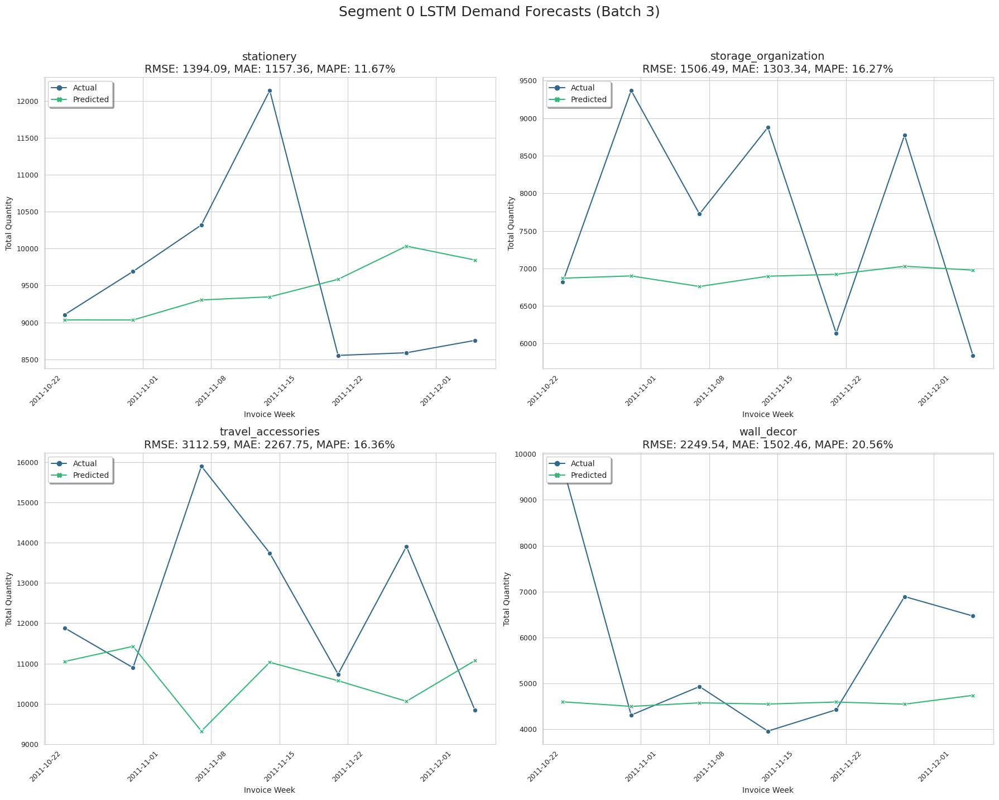

In [44]:
import optuna
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader

# --- Helper function for creating sequences ---
def create_sequences(X, y, look_back):
    Xs, ys = [], []
    for i in range(look_back, len(X)):
        Xs.append(X.iloc[i-look_back:i].values)
        ys.append(y.iloc[i])
    return np.array(Xs), np.array(ys)

# --- PyTorch LSTM Model Definition ---
class LSTMModel(nn.Module):
    def __init__(self, input_size, hidden_layer_size, output_size, dropout_rate):
        super().__init__()
        self.hidden_layer_size = hidden_layer_size
        self.lstm = nn.LSTM(input_size, hidden_layer_size, batch_first=True)
        self.dropout = nn.Dropout(dropout_rate)
        self.linear = nn.Linear(hidden_layer_size, output_size)

    def forward(self, input_seq):
        lstm_out, _ = self.lstm(input_seq)
        last_output = lstm_out[:, -1, :] 
        dropout_out = self.dropout(last_output)
        predictions = self.linear(dropout_out)
        return predictions

# --- Set up GPU device if available ---
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# --- Objective function for Optuna (PyTorch version) ---
def make_objective_pytorch(X_pool, X_test, y_pool_target, y_test_target):
    def objective(trial):
        look_back = trial.suggest_int("look_back", 5, 21)
        lstm_units = trial.suggest_int("lstm_units", 32, 128)
        dropout_rate = trial.suggest_float("dropout", 0.0, 0.5)
        batch_size = trial.suggest_categorical("batch_size", [32, 64, 128])
        learning_rate = trial.suggest_float("lr", 1e-5, 1e-2, log=False)
        epochs = trial.suggest_int("epochs", 50, 100) 
        patience = trial.suggest_int("patience", 10, 30)

        # Data Scaling
        feature_scaler = MinMaxScaler()
        feature_scaler.fit(X_pool)
        scaled_full_X = feature_scaler.transform(pd.concat([X_pool, X_test]))

        target_scaler = MinMaxScaler()
        target_scaler.fit(y_pool_target.values.reshape(-1, 1))
        scaled_full_y_target = target_scaler.transform(pd.concat([y_pool_target, y_test_target]).values.reshape(-1, 1)).flatten()

        scaled_full_X_df = pd.DataFrame(scaled_full_X, index=pd.concat([X_pool, X_test]).index, columns=X_pool.columns)
        scaled_full_y_target_series = pd.Series(scaled_full_y_target, index=pd.concat([y_pool_target, y_test_target]).index)

        # Sequence creation
        X_seq, y_seq = create_sequences(scaled_full_X_df, scaled_full_y_target_series, look_back)
        
        original_pool_len = len(X_pool)
        num_train_sequences = original_pool_len - look_back
        
        if num_train_sequences <= 0:
            return float("inf")

        X_train_seq, y_train_seq = X_seq[:num_train_sequences], y_seq[:num_train_sequences]
        X_test_seq, y_test_seq = X_seq[num_train_sequences:], y_seq[num_train_sequences:]

        if len(X_test_seq) == 0:
            return float("inf")

        # Convert to PyTorch tensors and move to device
        X_train_tensor = torch.tensor(X_train_seq, dtype=torch.float32).to(device)
        y_train_tensor = torch.tensor(y_train_seq, dtype=torch.float32).unsqueeze(1).to(device)
        X_test_tensor = torch.tensor(X_test_seq, dtype=torch.float32).to(device)
        y_test_tensor = torch.tensor(y_test_seq, dtype=torch.float32).unsqueeze(1).to(device)

        train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
        train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)

        # Build model and move to device
        model = LSTMModel(input_size=X_train_seq.shape[2], 
                          hidden_layer_size=lstm_units, 
                          output_size=1, 
                          dropout_rate=dropout_rate).to(device)
        
        optimizer = optim.Adam(model.parameters(), lr=learning_rate)
        criterion = nn.L1Loss() # MAE loss

        # Early stopping logic
        best_loss = float('inf')
        patience_counter = 0
        
        # Train model
        for epoch in range(epochs):
            model.train()
            for batch_X, batch_y in train_loader:
                optimizer.zero_grad()
                outputs = model(batch_X)
                loss = criterion(outputs, batch_y)
                loss.backward()
                optimizer.step()

            model.eval()
            with torch.no_grad():
                val_split_idx = int(len(X_train_seq) * 0.8)
                if val_split_idx >= len(X_train_seq):
                    val_loss = float('inf')
                else:
                    val_outputs = model(X_train_tensor[val_split_idx:])
                    val_loss = criterion(val_outputs, y_train_tensor[val_split_idx:]).item()
                
            if val_loss < best_loss:
                best_loss = val_loss
                patience_counter = 0
                torch.save(model.state_dict(), 'best_lstm_model.pth')
            else:
                patience_counter += 1
                if patience_counter >= patience:
                    break
        
        # Load best model weights before predicting
        model.load_state_dict(torch.load('best_lstm_model.pth'))
        
        # Predict
        model.eval()
        with torch.no_grad():
            preds_scaled_tensor = model(X_test_tensor)
        
        # Move predictions back to CPU for numpy conversion and inverse scaling
        preds_scaled = preds_scaled_tensor.cpu().numpy().flatten()
        actuals = y_test_tensor.cpu().numpy().flatten() # Already on device, move to CPU

        # Inverse transform predictions and actuals
        preds = target_scaler.inverse_transform(preds_scaled.reshape(-1, 1)).flatten()
        actuals = target_scaler.inverse_transform(actuals.reshape(-1, 1)).flatten()

        preds[preds < 0] = 0 

        return mean_absolute_error(actuals, preds)
    return objective

print(f"** Modeling for Segment {segment_id} (Mainstream Customers) using LSTM **")

X_pool = segment_data_splits[segment_id]['X_train_val_pool']
y_pool_dict = segment_data_splits[segment_id]['y_train_val_pool_dict']
tscv_splits = segment_data_splits[segment_id]['tscv_splits'] 
X_test = segment_data_splits[segment_id]['X_test']
y_test_dict = segment_data_splits[segment_id]['y_test_dict']
target_cols_segment = segment_data_splits[segment_id]['target_cols_segment']

# Storage for results
results_summary_lstm = []
predictions_for_plotting_lstm = {}

# --- Training Loop per Product Category ---
for target_product_category in target_cols_segment:
    print(f"\n--- Tuning and training LSTM for target: {target_product_category} ---")

    y_pool_target = y_pool_dict[target_product_category]
    y_test_target = y_test_dict[target_product_category]
    
    min_data_points = max(21, len(X_test)) + 1 
    if len(X_pool) + len(X_test) < min_data_points:
        print(f"  Skipping {target_product_category}: Not enough total data points ({len(X_pool) + len(X_test)}) for sequencing.")
        results_summary_lstm.append({
            'Product_Category': target_product_category.replace('_Total_Quantity', ''),
            'RMSE': np.nan, 'MAE': np.nan, 'MAPE': np.nan
        })
        continue

    # Run Optuna study
    study = optuna.create_study(direction="minimize")
    study.optimize(make_objective_pytorch(X_pool, X_test, y_pool_target, y_test_target), n_trials=30, show_progress_bar=False) # Reduced n_trials for quicker demo

    best_params = study.best_params
    print(f"  Best parameters for {target_product_category}: {best_params}")

    # --- Rebuild and Train Final Model with Best Params (outside Optuna's objective) ---
    look_back = best_params["look_back"]
    lstm_units = best_params["lstm_units"]
    dropout_rate = best_params["dropout"]
    batch_size = best_params["batch_size"]
    learning_rate = best_params["lr"]
    epochs = best_params["epochs"]
    patience = best_params["patience"]

    # Prepare sequences using best look_back for the final model training
    feature_scaler = MinMaxScaler()
    feature_scaler.fit(X_pool)
    scaled_full_X = feature_scaler.transform(pd.concat([X_pool, X_test]))

    target_scaler = MinMaxScaler()
    target_scaler.fit(y_pool_target.values.reshape(-1, 1))
    scaled_full_y_target = target_scaler.transform(pd.concat([y_pool_target, y_test_target]).values.reshape(-1, 1)).flatten()

    scaled_full_X_df = pd.DataFrame(scaled_full_X, index=pd.concat([X_pool, X_test]).index, columns=X_pool.columns)
    scaled_full_y_target_series = pd.Series(scaled_full_y_target, index=pd.concat([y_pool_target, y_test_target]).index)

    X_seq, y_seq = create_sequences(scaled_full_X_df, scaled_full_y_target_series, look_back)
    
    num_train_sequences = len(X_pool) - look_back
    
    if num_train_sequences <= 0:
        print(f"  Skipping final training for {target_product_category}: not enough training data for sequences with look_back={look_back}.")
        results_summary_lstm.append({
            'Product_Category': target_product_category.replace('_Total_Quantity', ''),
            'RMSE': np.nan, 'MAE': np.nan, 'MAPE': np.nan
        })
        continue

    X_train_seq_final, y_train_seq_final = X_seq[:num_train_sequences], y_seq[:num_train_sequences]
    X_test_seq_final, y_test_seq_final = X_seq[num_train_sequences:], y_seq[num_train_sequences:]

    if len(X_test_seq_final) == 0:
        print(f"  Skipping final training for {target_product_category}: no test sequences can be formed with look_back={look_back}.")
        results_summary_lstm.append({
            'Product_Category': target_product_category.replace('_Total_Quantity', ''),
            'RMSE': np.nan, 'MAE': np.nan, 'MAPE': np.nan
        })
        continue

    # Convert to PyTorch tensors and move to device for final training
    X_train_tensor_final = torch.tensor(X_train_seq_final, dtype=torch.float32).to(device)
    y_train_tensor_final = torch.tensor(y_train_seq_final, dtype=torch.float32).unsqueeze(1).to(device)
    X_test_tensor_final = torch.tensor(X_test_seq_final, dtype=torch.float32).to(device)
    y_test_tensor_final = torch.tensor(y_test_seq_final, dtype=torch.float32).unsqueeze(1).to(device)

    train_dataset_final = TensorDataset(X_train_tensor_final, y_train_tensor_final)
    train_loader_final = DataLoader(train_dataset_final, batch_size=batch_size, shuffle=False)

    # Final model instance and move to device
    final_model = LSTMModel(input_size=X_train_seq_final.shape[2], 
                            hidden_layer_size=lstm_units, 
                            output_size=1, 
                            dropout_rate=dropout_rate).to(device)
    
    optimizer_final = optim.Adam(final_model.parameters(), lr=learning_rate)
    criterion_final = nn.L1Loss() # MAE loss

    best_loss_final = float('inf')
    patience_counter_final = 0

    print(f"  Training final model for {target_product_category} with best params...")
    for epoch in range(epochs):
        final_model.train()
        for batch_X, batch_y in train_loader_final:
            optimizer_final.zero_grad()
            outputs = final_model(batch_X)
            loss = criterion_final(outputs, batch_y)
            loss.backward()
            optimizer_final.step()

        final_model.eval()
        with torch.no_grad():
            val_split_idx_final = int(len(X_train_seq_final) * 0.8)
            if val_split_idx_final >= len(X_train_seq_final):
                val_loss_final = float('inf') 
            else:
                val_outputs_final = final_model(X_train_tensor_final[val_split_idx_final:])
                val_loss_final = criterion_final(val_outputs_final, y_train_tensor_final[val_split_idx_final:]).item()
            
        if val_loss_final < best_loss_final:
            best_loss_final = val_loss_final
            patience_counter_final = 0
            torch.save(final_model.state_dict(), 'final_lstm_model.pth')
        else:
            patience_counter_final += 1
            if patience_counter_final >= patience:
                break
    
    # Load best model weights for prediction
    final_model.load_state_dict(torch.load('final_lstm_model.pth'))

    # Prediction on test set
    final_model.eval()
    with torch.no_grad():
        preds_scaled_tensor_final = final_model(X_test_tensor_final)
    
    # Move predictions and actuals back to CPU for numpy conversion and inverse scaling
    preds_scaled_final = preds_scaled_tensor_final.cpu().numpy().flatten()
    actuals_final = y_test_tensor_final.cpu().numpy().flatten()

    preds_final = target_scaler.inverse_transform(preds_scaled_final.reshape(-1, 1)).flatten()
    actuals_final = target_scaler.inverse_transform(actuals_final.reshape(-1, 1)).flatten()

    preds_final[preds_final < 0] = 0

    # Evaluation (only standard metrics as requested)
    rmse = np.sqrt(mean_squared_error(actuals_final, preds_final))
    mae = mean_absolute_error(actuals_final, preds_final)
    mape = mean_absolute_percentage_error(actuals_final, preds_final)

    results_summary_lstm.append({
        'Product_Category': target_product_category.replace('_Total_Quantity', ''),
        'RMSE': rmse, 'MAE': mae, 'MAPE': mape
    })

    predictions_for_plotting_lstm[target_product_category] = pd.DataFrame({
        'Actual': actuals_final,
        'Predicted': preds_final
    }, index=X_test.index[-len(actuals_final):])

print("\n--- All LSTM models trained and evaluated. ---")

# --- Display Results ---
summary_df_lstm = pd.DataFrame(results_summary_lstm).set_index('Product_Category')
print(f"\n** Segment {segment_id}: LSTM with Optuna Tuning - Performance Summary (PyTorch) **")
display(summary_df_lstm.sort_values(by='MAPE'))

# Plotting Code (same as yours, with metric titles adjusted for standard metrics)
print(f"\n** Segment {segment_id}: LSTM Regressor - Actual vs. Predicted Demand (Test Set Visuals) **")

sns.set_style("whitegrid")
colors = sns.color_palette("viridis", n_colors=2)
plots_per_figure = 4
rows_per_figure = int(np.ceil(plots_per_figure / 2))
cols_per_figure = 2

ordered_categories_display_name = summary_df_lstm.index.tolist()

for i, display_name in enumerate(ordered_categories_display_name):
    category_key = display_name.replace(' ', '_') + '_Total_Quantity'
    
    if category_key not in predictions_for_plotting_lstm or predictions_for_plotting_lstm[category_key].empty:
        print(f"  Skipping plot for {display_name} as test set was empty or invalid for LSTM.")
        continue

    data = predictions_for_plotting_lstm[category_key]

    if i % plots_per_figure == 0:
        if i > 0:
            plt.tight_layout()
            plt.show()
        
        plt.figure(figsize=(18, 7 * rows_per_figure))
        plt.suptitle(f'Segment {segment_id} LSTM Demand Forecasts (Batch {int(i/plots_per_figure) + 1})', fontsize=18, y=1.02)

    subplot_idx = (i % plots_per_figure) + 1
    ax = plt.subplot(rows_per_figure, cols_per_figure, subplot_idx)
    product_name = display_name

    try:
        category_metrics = summary_df_lstm.loc[display_name]
        rmse_val = category_metrics['RMSE']
        mae_val = category_metrics['MAE']
        mape_val = category_metrics['MAPE']
        plot_title_metrics = f'\nRMSE: {rmse_val:.2f}, MAE: {mae_val:.2f}, MAPE: {mape_val:.2f}%'
    except KeyError:
        plot_title_metrics = "\nMetrics N/A"

    sns.lineplot(data=data, ax=ax, markers=True, dashes=False, palette=colors)
    
    ax.set_title(f'{product_name}{plot_title_metrics}', fontsize=14)
    ax.set_xlabel('Invoice Week', fontsize=10)
    ax.set_ylabel('Total Quantity', fontsize=10)
    
    ax.tick_params(axis='x', rotation=45, labelsize=9)
    ax.tick_params(axis='y', labelsize=9)
    
    ax.legend(loc='upper left', fontsize=10, frameon=True, fancybox=True, shadow=True)

plt.tight_layout()
plt.show()

# Demand Forcast for Segment 1

In [48]:
segment_id = 1

## XGB Regressor: For Segment 1(Low-Value Infrequent Buyers)

** Modeling for Segment 1 (Low-Value Infrequent Buyers) using XGBoost Regressor **

Beginning training for 10 product categories in Segment 1...

--- Training XGBoost for target: home_decor_Total_Quantity ---
  Starting RandomizedSearchCV for home_decor_Total_Quantity...
  Best params for home_decor_Total_Quantity: {'subsample': 1.0, 'reg_lambda': 0.1, 'reg_alpha': 0.1, 'min_child_weight': 3, 'max_depth': 9, 'gamma': 0.1, 'colsample_bytree': 0.9}

--- Training XGBoost for target: jewelry_Total_Quantity ---
  Starting RandomizedSearchCV for jewelry_Total_Quantity...
  Best params for jewelry_Total_Quantity: {'subsample': 0.9, 'reg_lambda': 10, 'reg_alpha': 0, 'min_child_weight': 2, 'max_depth': 15, 'gamma': 0.0, 'colsample_bytree': 0.8}

--- Training XGBoost for target: kitchenware_Total_Quantity ---
  Starting RandomizedSearchCV for kitchenware_Total_Quantity...
  Best params for kitchenware_Total_Quantity: {'subsample': 0.6, 'reg_lambda': 10, 'reg_alpha': 1, 'min_child_weight': 1, 'ma

,RMSE,MAE,MAPE
Product_Category,,,
jewelry,0.101516,0.054673,0.000000
kitchenware,155.426964,125.980057,0.000000
lighting,0.257821,0.257781,0.000000
storage_organization,0.990013,0.813465,6.506305
wall_decor,718.754762,625.057869,12.809222
travel_accessories,15.620760,6.400852,12.991689
party_supplies,58.782609,24.008404,16.665208
seasonal,127.839795,58.483830,16.666667
home_decor,88.411649,52.767177,60.339509



** Segment 1: XGBoost Regressor - Actual vs. Predicted Demand (Test Set Visuals) **


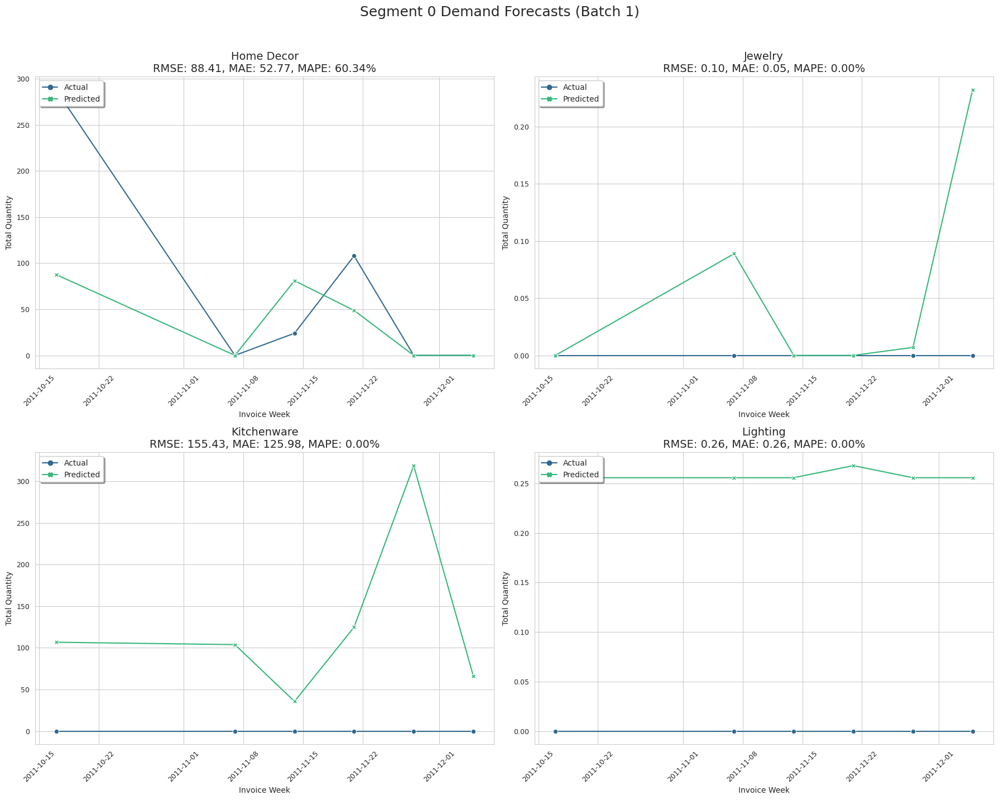

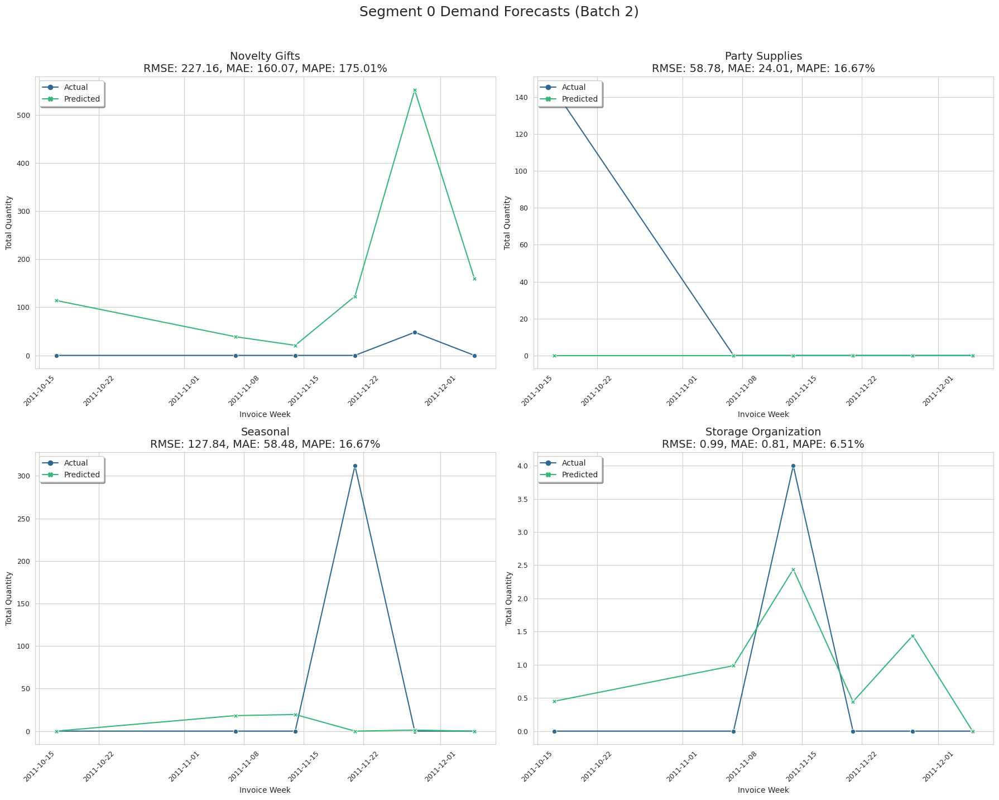

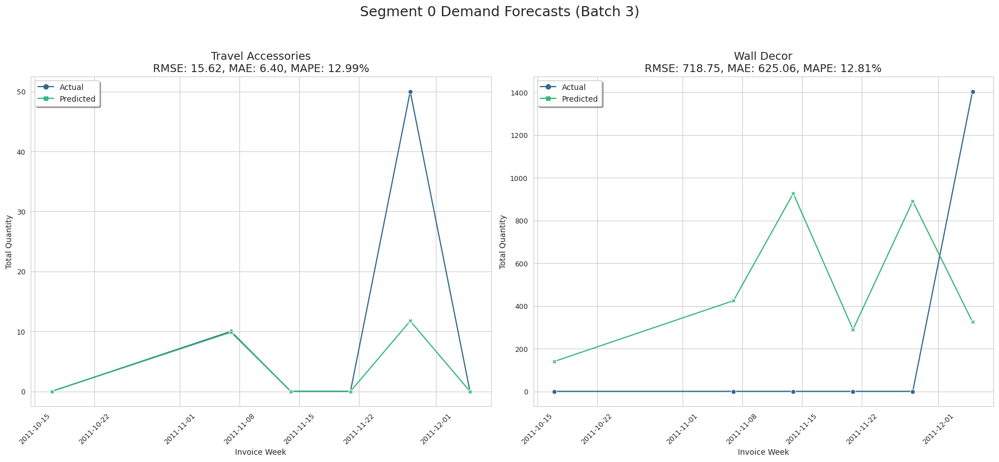

In [46]:
print(f"** Modeling for Segment {segment_id} (Low-Value Infrequent Buyers) using XGBoost Regressor **")

X_pool = segment_data_splits[segment_id]['X_train_val_pool']
y_pool_dict = segment_data_splits[segment_id]['y_train_val_pool_dict']
tscv_splits = segment_data_splits[segment_id]['tscv_splits']
X_test = segment_data_splits[segment_id]['X_test']
y_test_dict = segment_data_splits[segment_id]['y_test_dict']
target_cols_segment = segment_data_splits[segment_id]['target_cols_segment']

# Prepare to store results
results_summary = []
predictions_for_plotting = {}

# Define the XGBoost Regressor base model
xgb_base_model = XGBRegressor(objective='reg:squarederror',
                              eval_metric='rmse',
                              n_estimators=1000,
                              learning_rate=0.05,
                              random_state=42,
                              n_jobs=-1)

# Define hyperparameters for RandomizedSearchCV
param_distributions = {
    'max_depth': [3, 5, 7, 9, 11, 13, 15],
    'min_child_weight': [1, 2, 3, 4, 5],
    'gamma': [0.0, 0.1, 0.2, 0.3, 0.4],
    'subsample': [0.6, 0.7, 0.8, 0.9, 1.0],
    'colsample_bytree': [0.6, 0.7, 0.8, 0.9, 1.0],
    'reg_alpha': [0, 0.001, 0.01, 0.1, 0.5, 1, 5, 10],
    'reg_lambda': [0, 0.001, 0.01, 0.1, 0.5, 1, 5, 10],
}

print(f"\nBeginning training for {len(target_cols_segment)} product categories in Segment {segment_id}...")

for target_product_category in target_cols_segment:
    print(f"\n--- Training XGBoost for target: {target_product_category} ---")

    y_pool_target = y_pool_dict[target_product_category]
    y_test_target = y_test_dict[target_product_category]

    # Initialize RandomizedSearchCV for the current target
    random_search = RandomizedSearchCV(
        estimator=xgb_base_model,
        param_distributions=param_distributions,
        n_iter=50,
        scoring='neg_mean_squared_error',
        cv=tscv_splits,
        verbose=0,
        random_state=42,
        n_jobs=-1,
        return_train_score=False 
    )

    # Fit RandomizedSearchCV
    print(f"  Starting RandomizedSearchCV for {target_product_category}...")
    random_search.fit(X_pool, y_pool_target)
    print(f"  Best params for {target_product_category}: {random_search.best_params_}")

    # Train the final model with the best parameters on the full training+validation pool
    best_xgb_model = random_search.best_estimator_
    best_xgb_model.fit(X_pool, y_pool_target)

    # Make predictions on the hold-out test set
    predictions = best_xgb_model.predict(X_test)
    predictions[predictions < 0] = 0 # Ensure predictions are non-negative

    # Evaluate the model
    rmse = np.sqrt(mean_squared_error(y_test_target, predictions))
    mae = mean_absolute_error(y_test_target, predictions)
    mape = mean_absolute_percentage_error(y_test_target, predictions)

    results_summary.append({
        'Product_Category': target_product_category.replace('_Total_Quantity', ''),
        'RMSE': rmse,
        'MAE': mae,
        'MAPE': mape
    })

    # Store actuals and predictions for plotting, using the test set's original index
    predictions_for_plotting[target_product_category] = pd.DataFrame({
        'Actual': y_test_target,
        'Predicted': predictions
    }, index=X_test.index)

print("\n--- All models trained and evaluated. ---")

# --- Display Summary Table Statistics ---
print("\n** Segment 1: XGBoost Regressor Performance Summary (Test Set) **")
summary_df = pd.DataFrame(results_summary).set_index('Product_Category')
display(summary_df.sort_values(by='MAPE', ascending=True))

# --- Visualize Predictions for Each Product Category (Revised for clarity) ---
print("\n** Segment 1: XGBoost Regressor - Actual vs. Predicted Demand (Test Set Visuals) **")

sns.set_style("whitegrid")
# Set a custom color palette for better differentiation
colors = sns.color_palette("viridis", n_colors=2) # Or any other suitable palette

# Determine how many plots per figure. Adjust this number based on how many categories you have
# and how large you want each subplot to be. 4 or 6 usually works well.
plots_per_figure = 4 # Example: 2 rows x 2 columns

num_plots = len(predictions_for_plotting)
rows_per_figure = int(np.ceil(plots_per_figure / 2)) # For 2 columns
cols_per_figure = 2

# Iterate through categories and plot in batches
for i, (category, data) in enumerate(predictions_for_plotting.items()):
    # Start a new figure for every 'plots_per_figure' categories
    if i % plots_per_figure == 0:
        if i > 0: # Close the previous figure if not the first batch
            plt.tight_layout()
            plt.show()
        
        # Create a new figure for the current batch
        plt.figure(figsize=(18, 7 * rows_per_figure)) # Adjust overall figure size as needed
        plt.suptitle(f'Segment 0 Demand Forecasts (Batch {int(i/plots_per_figure) + 1})', fontsize=18, y=1.02)


    # Calculate subplot position within the current figure
    subplot_idx = (i % plots_per_figure) + 1
    ax = plt.subplot(rows_per_figure, cols_per_figure, subplot_idx)

    product_name = category.replace('_Total_Quantity', '').replace('_', ' ').title() # Clean name for title

    # Get RMSE, MAE, and MAPE for this specific category to display on the plot
    try:
        category_metrics = summary_df.loc[product_name.lower().replace(' ', '_')]
        rmse_val = category_metrics['RMSE']
        mae_val = category_metrics['MAE']
        mape_val = category_metrics['MAPE']
        plot_title_metrics = f'\nRMSE: {rmse_val:.2f}, MAE: {mae_val:.2f}, MAPE: {mape_val:.2f}%'
    except KeyError:
        plot_title_metrics = "\nMetrics N/A"

    sns.lineplot(data=data, ax=ax, markers=True, dashes=False, palette=colors)
    
    ax.set_title(f'{product_name}{plot_title_metrics}', fontsize=14)
    ax.set_xlabel('Invoice Week', fontsize=10)
    ax.set_ylabel('Total Quantity', fontsize=10)
    
    ax.tick_params(axis='x', rotation=45, labelsize=9)
    ax.tick_params(axis='y', labelsize=9)
    
    ax.legend(loc='upper left', fontsize=10, frameon=True, fancybox=True, shadow=True)

plt.tight_layout()
plt.show()

## Holt-Winters: For Segment 1(Low-Value Infrequent Buyers)

In [50]:
pip install statsmodels

Note: you may need to restart the kernel to use updated packages.


In [51]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing

** Modeling for Segment 1 (Low-Value Infrequent Buyers) using Holt-Winters **

Beginning training for 10 product categories in Segment 1 using Holt-Winters (Exponential Smoothing)...
Note: Due to the short training data length (39 weeks), a 52-week seasonality cannot be reliably modeled.
      The Exponential Smoothing model will be configured for Level and Trend only (non-seasonal).

--- Training Holt-Winters for target: home_decor_Total_Quantity ---
  Could not infer frequency for home_decor_Total_Quantity. Attempting to force 'W-MON' frequency.
    Failed to assign 'W-MON' frequency directly (index might not align). Trying reindex.
    Successfully forced frequency by reindexing.
  Holt-Winters model for home_decor_Total_Quantity fitted successfully.

--- Training Holt-Winters for target: jewelry_Total_Quantity ---
  Could not infer frequency for jewelry_Total_Quantity. Attempting to force 'W-MON' frequency.
    Failed to assign 'W-MON' frequency directly (index might not align). Tr

,RMSE,MAE,MAPE
Product_Category,,,
jewelry,0.187072,0.186677,0.000000
kitchenware,24.565963,22.873102,0.000000
lighting,0.975682,0.975393,0.000000
novelty_gifts,50.832050,47.912069,0.871244
seasonal,106.120913,49.168296,11.938283
wall_decor,488.668317,196.308835,12.288859
storage_organization,1.414212,0.500002,12.499989
travel_accessories,16.457233,11.505046,13.078342
party_supplies,88.181631,54.000000,37.500000



** Segment 1: Holt-Winters - Actual vs. Predicted Demand (Test Set Visuals) **


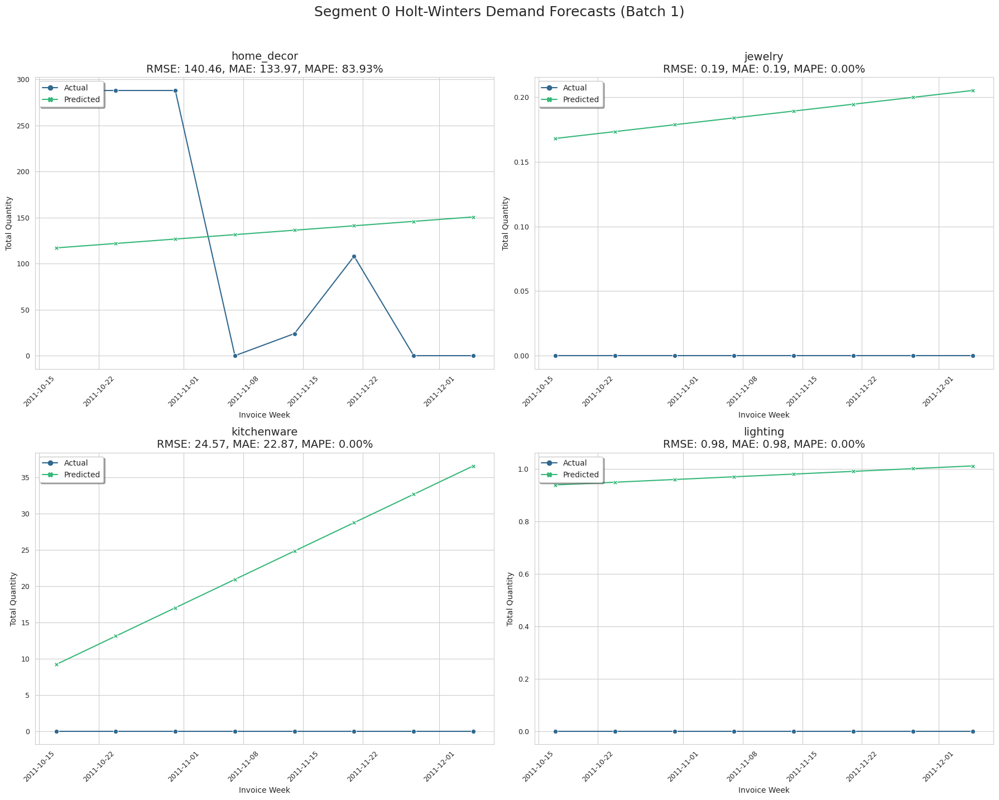

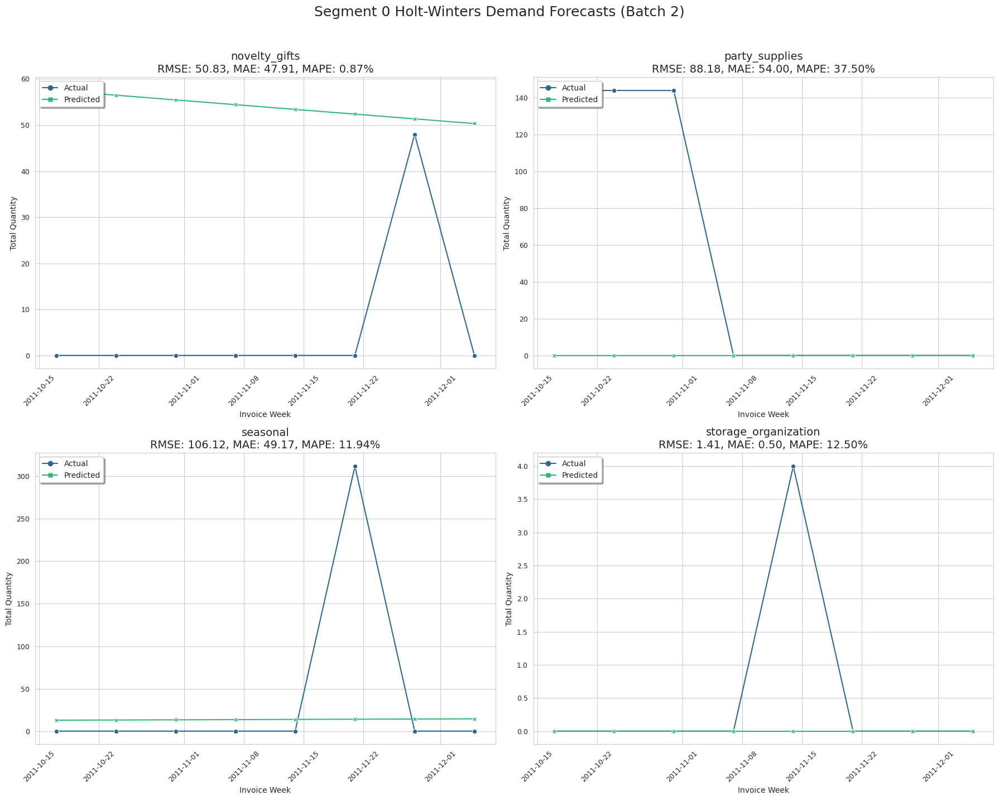

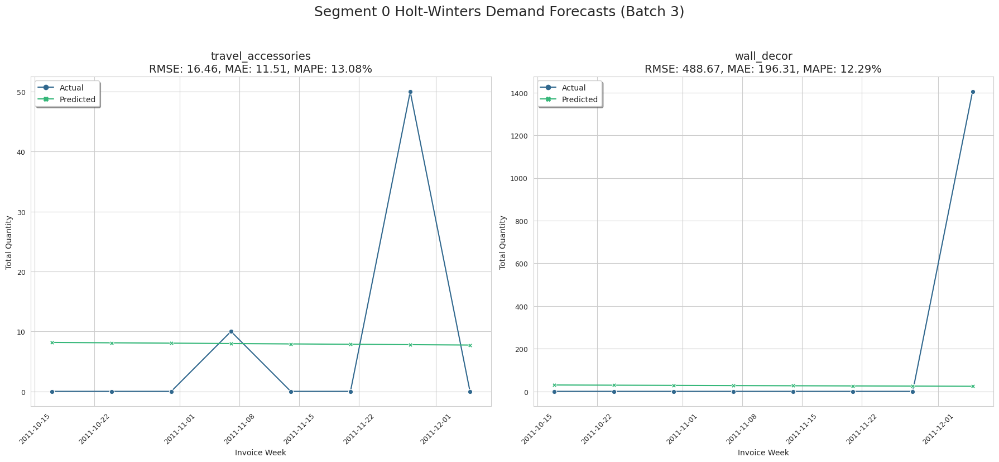


Visualizations for Segment 0 product categories (Holt-Winters) complete.


In [52]:
print(f"** Modeling for Segment {segment_id} (Low-Value Infrequent Buyers) using Holt-Winters **")

X_pool = segment_data_splits[segment_id]['X_train_val_pool']
y_pool_dict = segment_data_splits[segment_id]['y_train_val_pool_dict']
tscv_splits = segment_data_splits[segment_id]['tscv_splits']
X_test = segment_data_splits[segment_id]['X_test']
y_test_dict = segment_data_splits[segment_id]['y_test_dict']
target_cols_segment = segment_data_splits[segment_id]['target_cols_segment']

results_summary_hw = []
predictions_for_plotting_hw = {}

print(f"\nBeginning training for {len(target_cols_segment)} product categories in Segment {segment_id} using Holt-Winters (Exponential Smoothing)...")
print("Note: Due to the short training data length (39 weeks), a 52-week seasonality cannot be reliably modeled.")
print("      The Exponential Smoothing model will be configured for Level and Trend only (non-seasonal).")


for target_product_category in target_cols_segment:
    print(f"\n--- Training Holt-Winters for target: {target_product_category} ---")

    # --- Robust Indexing for y_pool_target and y_test_target ---
    # Ensure indices are DatetimeIndex objects first
    base_pool_index = pd.to_datetime(X_pool.index)
    base_test_index = pd.to_datetime(X_test.index)

    # Now create the Series using these DatetimeIndices
    y_pool_series = pd.Series(y_pool_dict[target_product_category].values, index=base_pool_index)
    y_test_series = pd.Series(y_test_dict[target_product_category].values, index=base_test_index)

    # Attempt to infer frequency. If it can't be inferred, we'll assign a default.
    inferred_freq = pd.infer_freq(y_pool_series.index)

    if inferred_freq:
        print(f"  Inferred frequency for {target_product_category}: {inferred_freq}")
        # Explicitly set frequency for the series if inferred (good practice for statsmodels)
        y_pool_series = y_pool_series.asfreq(inferred_freq)
        y_test_series = y_test_series.asfreq(inferred_freq)
    else:
        # If infer_freq fails, it means the index is not perfectly regular,
        # or there aren't enough points, or the dates are not truly weekly without gaps.
        # We need to *force* a frequency for statsmodels to work well with forecasting.
        print(f"  Could not infer frequency for {target_product_category}. Attempting to force 'W-MON' frequency.")
        
        # It's better to reindex and fill if there are missing dates, or just assign freq
        # Forcing a frequency on an irregularly spaced DatetimeIndex can introduce NaNs if dates are skipped.
        # Let's try assigning freq directly and then check for NaNs.
        
        # Method 1: Assign freq directly to the index (more direct for a DtIndex)
        try:
            y_pool_series.index.freq = 'W-MON' # Or 'W-SUN' or 'W' depending on your data
            y_test_series.index.freq = 'W-MON'
            inferred_freq = 'W-MON' # Update inferred_freq variable for clarity
        except ValueError:
            print(f"    Failed to assign 'W-MON' frequency directly (index might not align). Trying reindex.")
            # Method 2: If direct assignment fails (e.g., due to gaps), use asfreq to reindex
            # This will fill missing dates with NaNs, which you might need to handle.
            try:
                # Create a date range with the desired frequency
                full_index_pool = pd.date_range(start=y_pool_series.index.min(), 
                                                  end=y_pool_series.index.max(), 
                                                  freq='W-MON')
                y_pool_series = y_pool_series.reindex(full_index_pool)
                y_pool_series = y_pool_series.ffill().bfill() # Fill NaNs if created by reindex
                y_pool_series.index.freq = 'W-MON'
                
                full_index_test = pd.date_range(start=y_test_series.index.min(), 
                                                  end=y_test_series.index.max(), 
                                                  freq='W-MON')
                y_test_series = y_test_series.reindex(full_index_test)
                y_test_series = y_test_series.ffill().bfill() # Fill NaNs
                y_test_series.index.freq = 'W-MON'

                print("    Successfully forced frequency by reindexing.")
                inferred_freq = 'W-MON'
            except Exception as reindex_e:
                print(f"    Failed to force frequency even with reindexing: {reindex_e}. Model might still fail.")
                inferred_freq = None # Indicate frequency still not set reliably

    # Final check: if frequency is still None, statsmodels will warn, but forecast() might still work
    if y_pool_series.index.freq is None:
        print(f"WARNING: No reliable frequency set for {target_product_category} series. Forecasting might be less accurate.")


    # --- Build and Train the Holt-Winters Model ---
    try:
        model_hw = ExponentialSmoothing(y_pool_series,
                                        trend='add',
                                        seasonal=None,
                                        initialization_method="estimated"
                                       ).fit()
        
        print(f"  Holt-Winters model for {target_product_category} fitted successfully.")

        # --- Make predictions ---
        n_periods = len(y_test_series)
        predictions_hw = model_hw.forecast(steps=n_periods)
        
        # Ensure predictions are non-negative
        predictions_hw[predictions_hw < 0] = 0

        # --- Evaluate the model ---
        actuals_hw = y_test_series.values 
        
        # Align predictions to the test series index for accurate comparison
        predictions_hw_aligned = pd.Series(predictions_hw, index=predictions_hw.index).reindex(y_test_series.index).values
        
        if np.isnan(predictions_hw_aligned).any():
             print(f"WARNING: NaNs found in aligned predictions for {target_product_category}. Filling with 0.")
             predictions_hw_aligned = np.nan_to_num(predictions_hw_aligned, nan=0.0)

        rmse_hw = np.sqrt(mean_squared_error(actuals_hw, predictions_hw_aligned))
        mae_hw = mean_absolute_error(actuals_hw, predictions_hw_aligned)
        mape_hw = mean_absolute_percentage_error(actuals_hw, predictions_hw_aligned)

        results_summary_hw.append({
            'Product_Category': target_product_category.replace('_Total_Quantity', ''),
            'RMSE': rmse_hw,
            'MAE': mae_hw,
            'MAPE': mape_hw
        })

        predictions_for_plotting_hw[target_product_category] = pd.DataFrame({
            'Actual': actuals_hw,
            'Predicted': predictions_hw_aligned
        }, index=y_test_series.index)

    except Exception as e:
        print(f"ERROR: Could not train or predict for {target_product_category}: {e}")
        results_summary_hw.append({
            'Product_Category': target_product_category.replace('_Total_Quantity', ''),
            'RMSE': np.nan,
            'MAE': np.nan,
            'MAPE': np.nan
        })
        predictions_for_plotting_hw[target_product_category] = pd.DataFrame({
            'Actual': y_test_series.values,
            'Predicted': np.full_like(y_test_series.values, np.nan, dtype=float)
        }, index=y_test_series.index)


print("\n--- All Holt-Winters models trained and evaluated. ---")

# --- Display Summary Table Statistics ---
print("\n** Segment 1: Holt-Winters Performance Summary (Test Set) **")
summary_df_hw = pd.DataFrame(results_summary_hw).set_index('Product_Category')
display(summary_df_hw.sort_values(by='MAPE', ascending=True))

# --- Visualize Predictions for Each Product Category ---
print("\n** Segment 1: Holt-Winters - Actual vs. Predicted Demand (Test Set Visuals) **")

sns.set_style("whitegrid")
colors = sns.color_palette("viridis", n_colors=2)
plots_per_figure = 4
rows_per_figure = int(np.ceil(plots_per_figure / 2))
cols_per_figure = 2

ordered_categories_display_name_hw = summary_df_hw.index.tolist()

for i, display_name in enumerate(ordered_categories_display_name_hw):
    category_key = display_name.replace(' ', '_') + '_Total_Quantity' 
    
    if category_key not in predictions_for_plotting_hw:
        print(f"Skipping plot for {display_name} as no prediction data was generated.")
        continue

    data = predictions_for_plotting_hw[category_key]

    if data['Predicted'].isnull().all():
        print(f"Skipping plot for {display_name} because all predicted values are NaN.")
        continue

    if i % plots_per_figure == 0:
        if i > 0:
            plt.tight_layout()
            plt.show()
        
        plt.figure(figsize=(18, 7 * rows_per_figure))
        plt.suptitle(f'Segment 0 Holt-Winters Demand Forecasts (Batch {int(i/plots_per_figure) + 1})', fontsize=18, y=1.02)

    subplot_idx = (i % plots_per_figure) + 1
    ax = plt.subplot(rows_per_figure, cols_per_figure, subplot_idx)

    product_name = display_name

    category_metrics = summary_df_hw.loc[display_name]
    rmse_val = category_metrics.get('RMSE', np.nan)
    mae_val = category_metrics.get('MAE', np.nan)
    mape_val = category_metrics.get('MAPE', np.nan)
    
    plot_title_metrics = ""
    if not np.isnan(rmse_val):
        plot_title_metrics = f'\nRMSE: {rmse_val:.2f}, MAE: {mae_val:.2f}, MAPE: {mape_val:.2f}%'
    else:
        plot_title_metrics = '\n(Metrics unavailable due to prediction error)'

    sns.lineplot(data=data, ax=ax, markers=True, dashes=False, palette=colors)
    
    ax.set_title(f'{product_name}{plot_title_metrics}', fontsize=14)
    ax.set_xlabel('Invoice Week', fontsize=10)
    ax.set_ylabel('Total Quantity', fontsize=10)
    
    ax.tick_params(axis='x', rotation=45, labelsize=9)
    ax.tick_params(axis='y', labelsize=9)
    
    ax.legend(loc='upper left', fontsize=10, frameon=True, fancybox=True, shadow=True)

plt.tight_layout()
plt.show()

print("\nVisualizations for Segment 0 product categories (Holt-Winters) complete.")

## Classifier+Regressor: For Segment 1(Low-Value Infrequent Buyers)


Training hybrid model (classifier + regressor) for Segment 1...


Processing: home_decor
Class distribution: Counter({0: 22, 1: 13}), scale_pos_weight: 1.69
The history saving thread hit an unexpected error (OperationalError('attempt to write a readonly database')).History will not be written to the database.

Processing: jewelry
Class distribution: Counter({0: 34, 1: 1}), scale_pos_weight: 34.00

Processing: kitchenware
Class distribution: Counter({0: 29, 1: 6}), scale_pos_weight: 4.83

Processing: lighting
Class distribution: Counter({0: 32, 1: 3}), scale_pos_weight: 10.67

Processing: novelty_gifts
Class distribution: Counter({0: 22, 1: 13}), scale_pos_weight: 1.69

Processing: party_supplies
Class distribution: Counter({0: 33, 1: 2}), scale_pos_weight: 16.50

Processing: seasonal
Class distribution: Counter({0: 30, 1: 5}), scale_pos_weight: 6.00

Processing: storage_organization
Class distribution: Counter({0: 31, 1: 4}), scale_pos_weight: 7.75

Processing: travel_accessories
Clas

,RMSE,MAE,MAPE
Product_Category,,,
jewelry,0.000000,0.000000,0.000000
kitchenware,0.000000,0.000000,0.000000
lighting,0.000000,0.000000,0.000000
storage_organization,1.223990,0.499692,12.492298
travel_accessories,16.347441,6.680955,13.419065
wall_decor,543.786312,221.999832,15.811954
seasonal,127.373467,52.000000,16.666667
party_supplies,58.787754,24.000000,16.666667
home_decor,112.171585,65.645123,61.960099



** Actual vs. Predicted Demand Plots (Hybrid Model) **


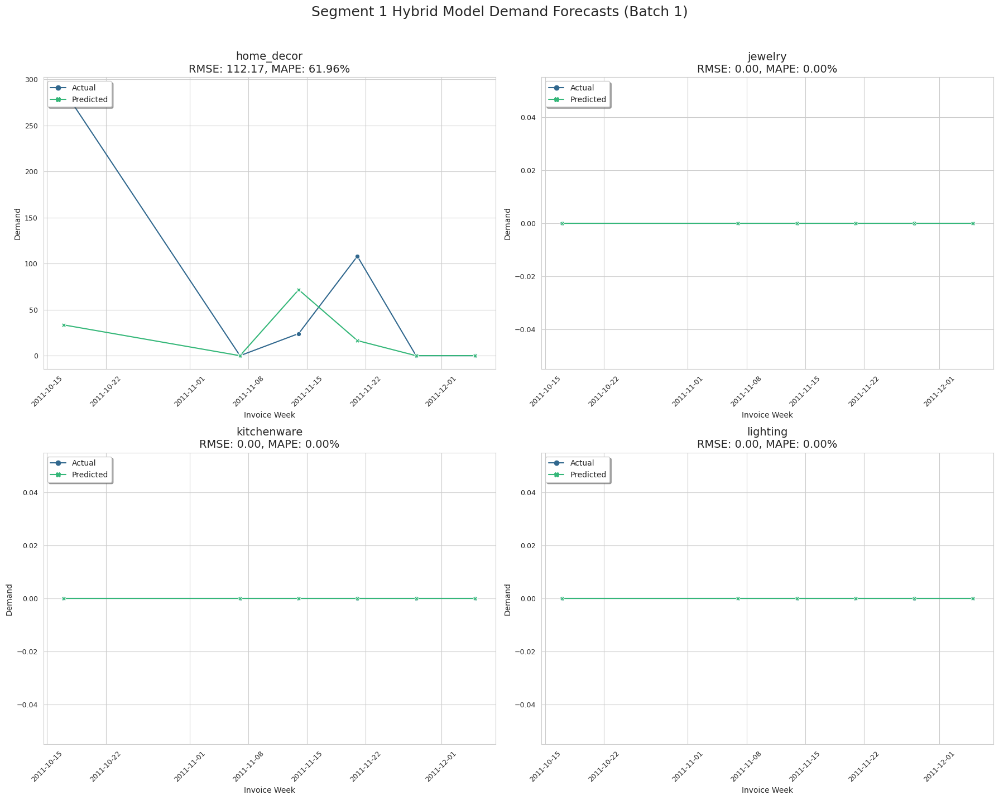

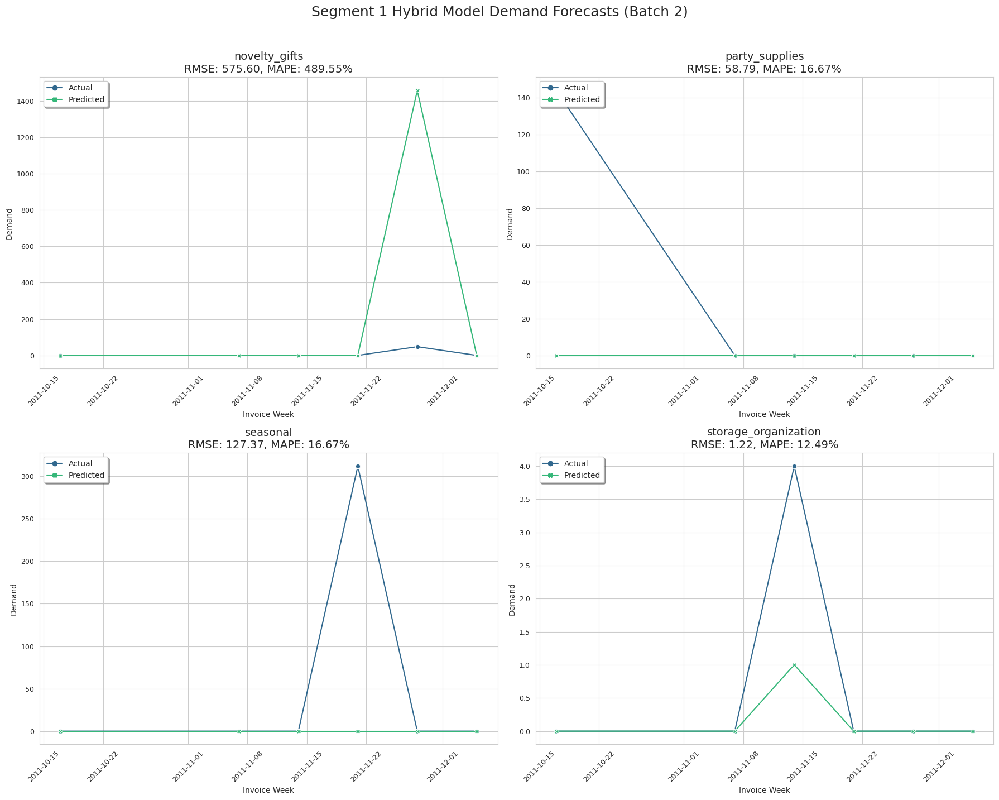

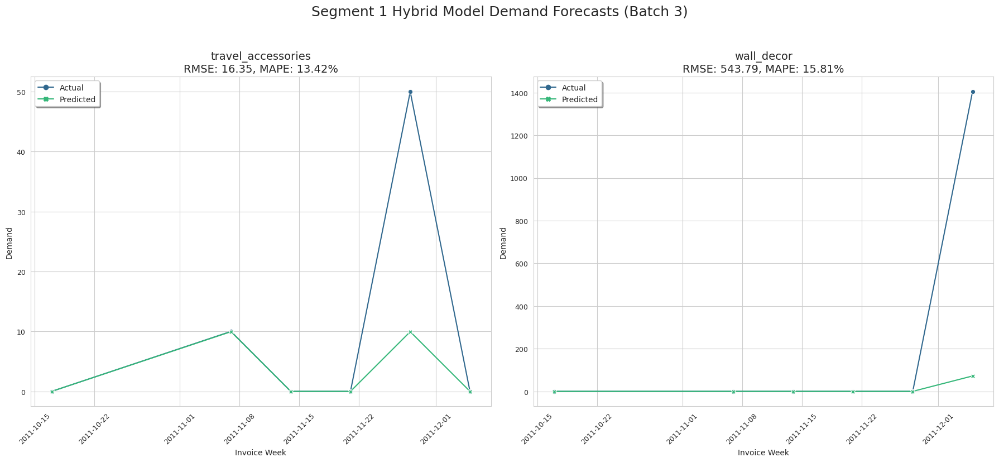

In [61]:
# from sklearn.model_selection import RandomizedSearchCV
from collections import Counter
# from xgboost import XGBClassifier, XGBRegressor
# from sklearn.preprocessing import MinMaxScaler
# from sklearn.metrics import mean_squared_error, mean_absolute_error, accuracy_score, precision_score, recall_score, f1_score

# Prepare data
segment_id = 1
X_pool = segment_data_splits[segment_id]['X_train_val_pool']
y_pool_dict = segment_data_splits[segment_id]['y_train_val_pool_dict']
X_test = segment_data_splits[segment_id]['X_test']
y_test_dict = segment_data_splits[segment_id]['y_test_dict']
target_cols_segment = segment_data_splits[segment_id]['target_cols_segment']

results_hybrid = []
predictions_for_plotting_hybrid = {}

print(f"\nTraining hybrid model (classifier + regressor) for Segment {segment_id}...\n")

for target_col in target_cols_segment:
    product = target_col.replace('_Total_Quantity', '')
    print(f"\nProcessing: {product}")

    y_pool = y_pool_dict[target_col]
    y_test = y_test_dict[target_col]

    # Define classifier target: 1 if demand > 0, else 0
    y_pool_class = (y_pool > 0).astype(int)
    y_test_class = (y_test > 0).astype(int)

    # Calculate scale_pos_weight to handle class imbalance
    counter = Counter(y_pool_class)
    scale_pos_weight = counter[0] / counter[1] if counter[1] > 0 else 1
    print(f"Class distribution: {counter}, scale_pos_weight: {scale_pos_weight:.2f}")

    # --- Scale features ---
    feature_scaler = MinMaxScaler()
    X_pool_scaled = feature_scaler.fit_transform(X_pool)
    X_test_scaled = feature_scaler.transform(X_test)

    # --- Stage 1: Classifier --- 
    clf = XGBClassifier(
        random_state=42,
        n_estimators=100,
        max_depth=3,
        scale_pos_weight=scale_pos_weight,
        use_label_encoder=False,
        eval_metric='aucpr'
    )
    clf.fit(X_pool_scaled, y_pool_class)

    # Predict class probabilities
    y_pred_proba = clf.predict_proba(X_test_scaled)[:, 1]

    # Tune threshold to maximize F1 score on test set (optional)
    # thresholds = np.arange(0.1, 0.9, 0.05)
    # f1_scores = []
    # for thresh in thresholds:
    #     preds = (y_pred_proba > thresh).astype(int)
    #     f1_scores.append(f1_score(y_test_class, preds))
    # best_thresh_idx = np.argmax(f1_scores)
    # confidence_threshold = thresholds[best_thresh_idx]
    # print(f"Best threshold by F1 score: {confidence_threshold:.2f}")

    y_pred_class = (y_pred_proba > confidence_threshold).astype(int)

    # acc = accuracy_score(y_test_class, y_pred_class)
    # prec = precision_score(y_test_class, y_pred_class, zero_division=0)
    # recall = recall_score(y_test_class, y_pred_class, zero_division=0)

    # --- Stage 2: Regressor ---

    X_train_reg = X_pool[y_pool_class == 1]
    y_train_reg = y_pool[y_pool_class == 1]
    X_train_reg_scaled = feature_scaler.transform(X_train_reg)

    reg = XGBRegressor(random_state=42, n_estimators=100, max_depth=3)
    reg.fit(X_train_reg_scaled, y_train_reg)

    y_pred_demand = np.zeros_like(y_test.values)
    demand_weeks = np.where(y_pred_class == 1)[0]
    if len(demand_weeks) > 0:
        y_pred_quantity = reg.predict(X_test_scaled[demand_weeks])
        y_pred_demand[demand_weeks] = y_pred_quantity
        y_pred_demand[y_pred_demand < 0] = 0

    # --- Evaluation ---
    rmse = np.sqrt(mean_squared_error(y_test, y_pred_demand))
    mae = mean_absolute_error(y_test, y_pred_demand)
    with np.errstate(divide='ignore', invalid='ignore'):
        mape = np.mean(np.abs((y_test.values - y_pred_demand) / np.where(y_test.values == 0, 1, y_test.values))) * 100

    results_hybrid.append({
        'Product_Category': product,
        # 'Classifier_Accuracy': acc,
        # 'Classifier_Precision': prec,
        # 'Classifier_Recall': recall,
        'RMSE': rmse,
        'MAE': mae,
        'MAPE': mape
    })

    predictions_for_plotting_hybrid[target_col] = pd.DataFrame({
        'Actual': y_test.values,
        'Predicted': y_pred_demand
    }, index=X_test.index)

# Summary table
summary_df_hybrid = pd.DataFrame(results_hybrid).set_index('Product_Category')
print("\n** Hybrid Model Performance Summary (Segment 1) **")
display(summary_df_hybrid.sort_values(by='MAPE'))

# --- Visualizations ---
print("\n** Actual vs. Predicted Demand Plots (Hybrid Model) **")
sns.set_style("whitegrid")
colors = sns.color_palette("viridis", n_colors=2)
plots_per_figure = 4
rows_per_figure = int(np.ceil(plots_per_figure / 2))
cols_per_figure = 2

products_ordered = summary_df_hybrid.index.tolist()

for i, product in enumerate(products_ordered):
    category_key = product + '_Total_Quantity'
    data = predictions_for_plotting_hybrid[category_key]

    if i % plots_per_figure == 0:
        if i > 0:
            plt.tight_layout()
            plt.show()

        plt.figure(figsize=(18, 7 * rows_per_figure))
        plt.suptitle(f'Segment {segment_id} Hybrid Model Demand Forecasts (Batch {int(i/plots_per_figure) + 1})', fontsize=18, y=1.02)

    subplot_idx = (i % plots_per_figure) + 1
    ax = plt.subplot(rows_per_figure, cols_per_figure, subplot_idx)

    try:
        metrics = summary_df_hybrid.loc[product]
        rmse_val = metrics['RMSE']
        mape_val = metrics['MAPE']
        plot_title_metrics = f'\nRMSE: {rmse_val:.2f}, MAPE: {mape_val:.2f}%'
    except KeyError:
        plot_title_metrics = "\nMetrics N/A"

    sns.lineplot(data=data, ax=ax, markers=True, dashes=False, palette=colors)

    ax.set_title(f'{product}{plot_title_metrics}', fontsize=14)
    ax.set_xlabel('Invoice Week', fontsize=10)
    ax.set_ylabel('Demand', fontsize=10)

    ax.tick_params(axis='x', rotation=45, labelsize=9)
    ax.tick_params(axis='y', labelsize=9)

    ax.legend(loc='upper left', fontsize=10, frameon=True, fancybox=True, shadow=True)

plt.tight_layout()
plt.show()



# Demand Forecast for Segment 2

In [59]:
segment_id = 2

## XGB Regressor: For Segment 2(Wholesalers)

** Modeling for Segment 2 (Loyalist) using XGBoost Regressor **

Beginning training for 12 product categories in Segment 2...

--- Training XGBoost for target: home_decor_Total_Quantity ---
  Starting RandomizedSearchCV for home_decor_Total_Quantity...
  Best params for home_decor_Total_Quantity: {'subsample': 0.8, 'reg_lambda': 1, 'reg_alpha': 0.01, 'min_child_weight': 2, 'max_depth': 7, 'gamma': 0.2, 'colsample_bytree': 0.9}

--- Training XGBoost for target: jewelry_Total_Quantity ---
  Starting RandomizedSearchCV for jewelry_Total_Quantity...
  Best params for jewelry_Total_Quantity: {'subsample': 0.6, 'reg_lambda': 10, 'reg_alpha': 1, 'min_child_weight': 1, 'max_depth': 3, 'gamma': 0.1, 'colsample_bytree': 0.7}

--- Training XGBoost for target: kids_Total_Quantity ---
  Starting RandomizedSearchCV for kids_Total_Quantity...
  Best params for kids_Total_Quantity: {'subsample': 1.0, 'reg_lambda': 1, 'reg_alpha': 1, 'min_child_weight': 5, 'max_depth': 9, 'gamma': 0.2, 'colsample_bytre

,RMSE,MAE,MAPE
Product_Category,,,
seasonal,1388.404917,1122.086914,32.176301
lighting,1371.674320,870.163151,37.973336
home_decor,1612.933963,1393.842250,49.366219
travel_accessories,807.972995,721.840646,55.469551
storage_organization,835.051461,760.546613,58.593100
wall_decor,905.496167,758.867004,59.058421
party_supplies,412.112024,320.376312,66.345380
kitchenware,1936.356085,1588.870257,93.526387
stationery,1167.155526,1056.179740,98.213317



** Segment 2: XGBoost Regressor - Actual vs. Predicted Demand (Test Set Visuals) **


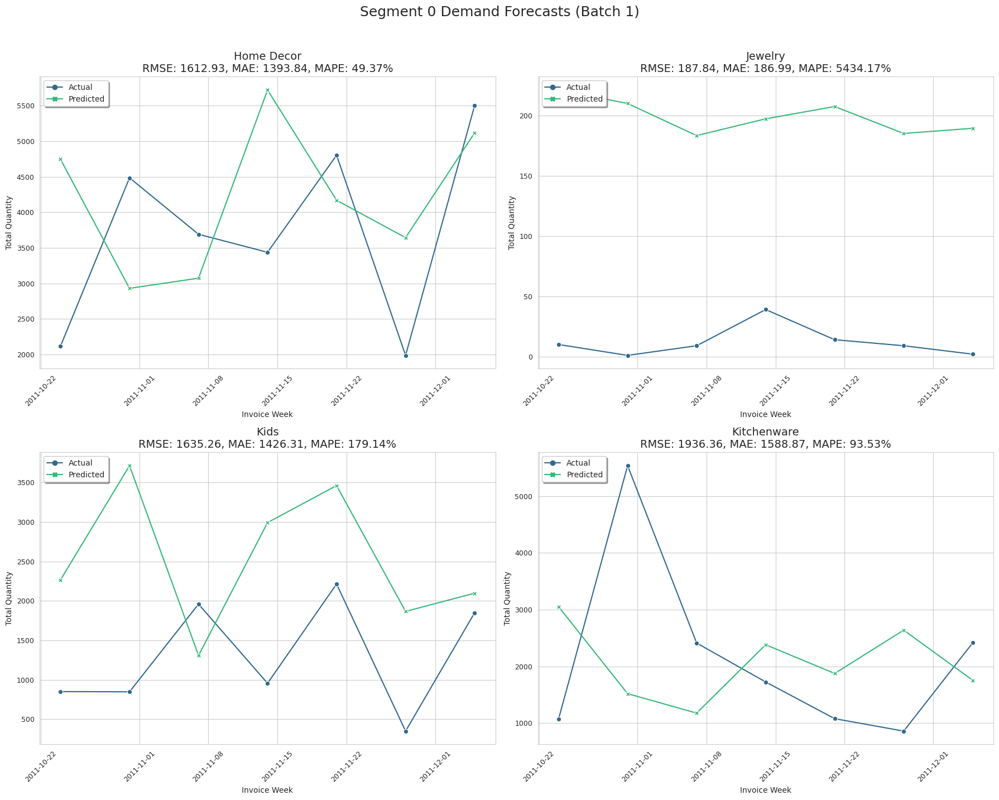

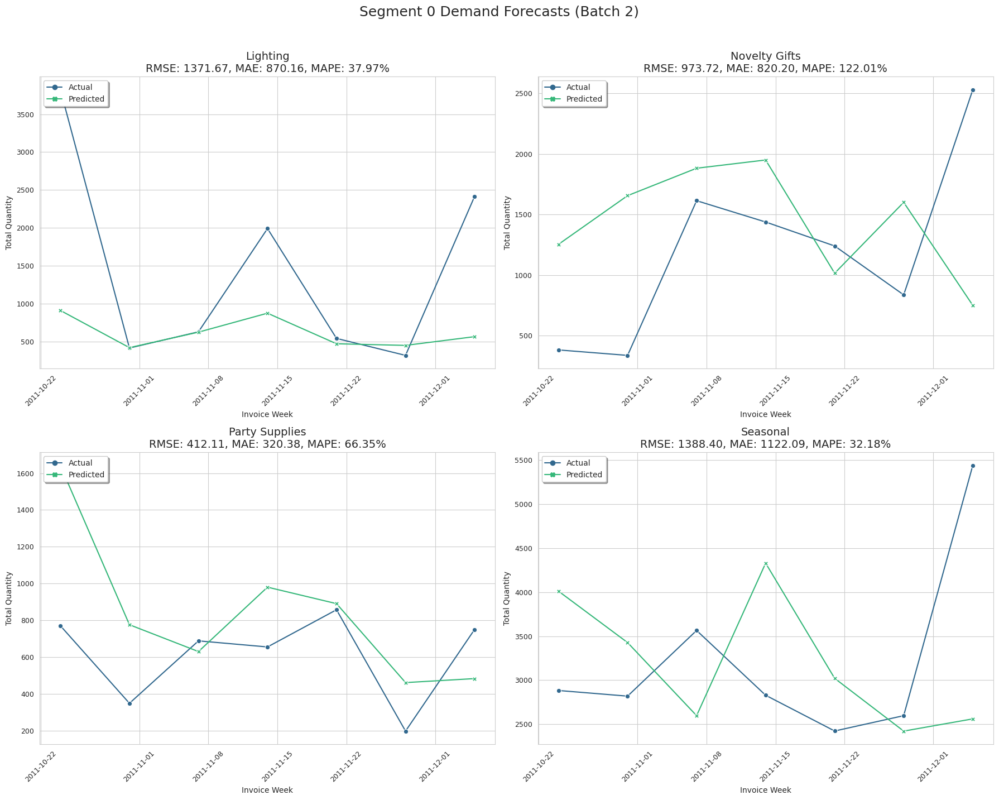

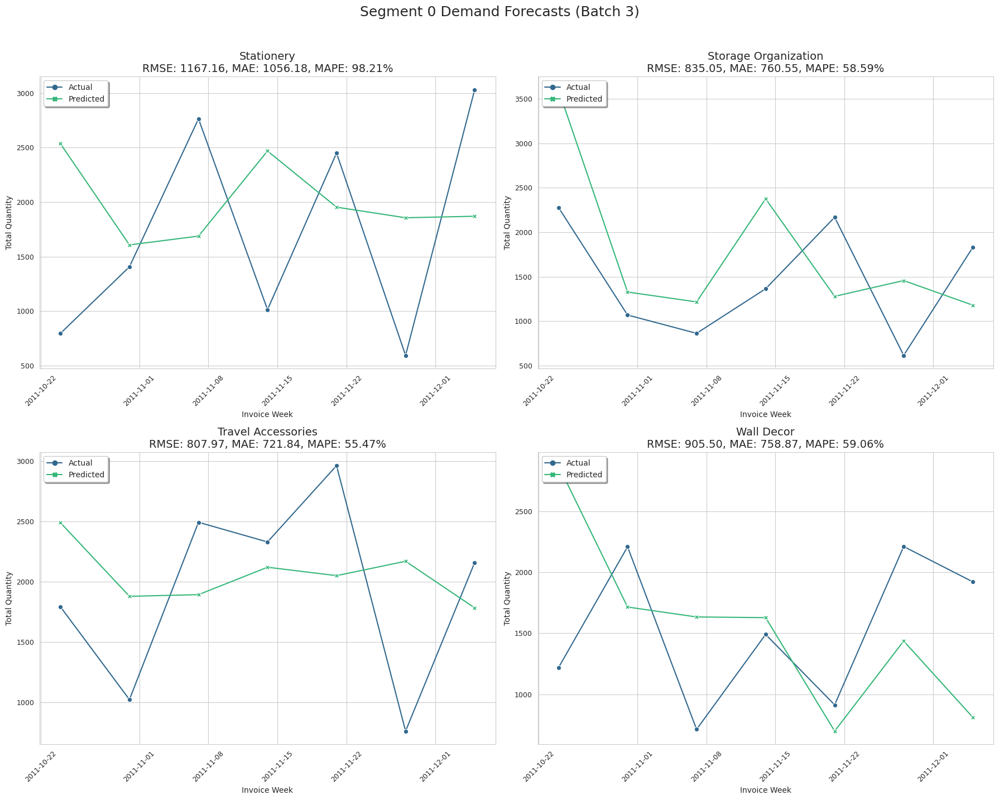

In [60]:
print(f"** Modeling for Segment {segment_id} (Wholesalers) using XGBoost Regressor **")

X_pool = segment_data_splits[segment_id]['X_train_val_pool']
y_pool_dict = segment_data_splits[segment_id]['y_train_val_pool_dict']
tscv_splits = segment_data_splits[segment_id]['tscv_splits']
X_test = segment_data_splits[segment_id]['X_test']
y_test_dict = segment_data_splits[segment_id]['y_test_dict']
target_cols_segment = segment_data_splits[segment_id]['target_cols_segment']

# Prepare to store results
results_summary = []
predictions_for_plotting = {}

# Define the XGBoost Regressor base model
xgb_base_model = XGBRegressor(objective='reg:squarederror',
                              eval_metric='rmse',
                              n_estimators=1000,
                              learning_rate=0.05,
                              random_state=42,
                              n_jobs=-1)

# Define hyperparameters for RandomizedSearchCV
param_distributions = {
    'max_depth': [3, 5, 7, 9, 11, 13, 15],
    'min_child_weight': [1, 2, 3, 4, 5],
    'gamma': [0.0, 0.1, 0.2, 0.3, 0.4],
    'subsample': [0.6, 0.7, 0.8, 0.9, 1.0],
    'colsample_bytree': [0.6, 0.7, 0.8, 0.9, 1.0],
    'reg_alpha': [0, 0.001, 0.01, 0.1, 0.5, 1, 5, 10],
    'reg_lambda': [0, 0.001, 0.01, 0.1, 0.5, 1, 5, 10],
}

print(f"\nBeginning training for {len(target_cols_segment)} product categories in Segment {segment_id}...")

for target_product_category in target_cols_segment:
    print(f"\n--- Training XGBoost for target: {target_product_category} ---")

    y_pool_target = y_pool_dict[target_product_category]
    y_test_target = y_test_dict[target_product_category]

    # Initialize RandomizedSearchCV for the current target
    random_search = RandomizedSearchCV(
        estimator=xgb_base_model,
        param_distributions=param_distributions,
        n_iter=50,
        scoring='neg_mean_squared_error',
        cv=tscv_splits,
        verbose=0,
        random_state=42,
        n_jobs=-1,
        return_train_score=False 
    )

    # Fit RandomizedSearchCV
    print(f"  Starting RandomizedSearchCV for {target_product_category}...")
    random_search.fit(X_pool, y_pool_target)
    print(f"  Best params for {target_product_category}: {random_search.best_params_}")

    # Train the final model with the best parameters on the full training+validation pool
    best_xgb_model = random_search.best_estimator_
    best_xgb_model.fit(X_pool, y_pool_target)

    # Make predictions on the hold-out test set
    predictions = best_xgb_model.predict(X_test)
    predictions[predictions < 0] = 0 # Ensure predictions are non-negative

    # Evaluate the model
    rmse = np.sqrt(mean_squared_error(y_test_target, predictions))
    mae = mean_absolute_error(y_test_target, predictions)
    mape = mean_absolute_percentage_error(y_test_target, predictions)

    results_summary.append({
        'Product_Category': target_product_category.replace('_Total_Quantity', ''),
        'RMSE': rmse,
        'MAE': mae,
        'MAPE': mape
    })

    # Store actuals and predictions for plotting, using the test set's original index
    predictions_for_plotting[target_product_category] = pd.DataFrame({
        'Actual': y_test_target,
        'Predicted': predictions
    }, index=X_test.index)

print("\n--- All models trained and evaluated. ---")

# --- Display Summary Table Statistics ---
print("\n** Segment 2: XGBoost Regressor Performance Summary (Test Set) **")
summary_df = pd.DataFrame(results_summary).set_index('Product_Category')
display(summary_df.sort_values(by='MAPE', ascending=True))

# --- Visualize Predictions for Each Product Category (Revised for clarity) ---
print("\n** Segment 2: XGBoost Regressor - Actual vs. Predicted Demand (Test Set Visuals) **")

sns.set_style("whitegrid")
# Set a custom color palette for better differentiation
colors = sns.color_palette("viridis", n_colors=2) # Or any other suitable palette

# Determine how many plots per figure. Adjust this number based on how many categories you have
# and how large you want each subplot to be. 4 or 6 usually works well.
plots_per_figure = 4 # Example: 2 rows x 2 columns

num_plots = len(predictions_for_plotting)
rows_per_figure = int(np.ceil(plots_per_figure / 2)) # For 2 columns
cols_per_figure = 2

# Iterate through categories and plot in batches
for i, (category, data) in enumerate(predictions_for_plotting.items()):
    # Start a new figure for every 'plots_per_figure' categories
    if i % plots_per_figure == 0:
        if i > 0: # Close the previous figure if not the first batch
            plt.tight_layout()
            plt.show()
        
        # Create a new figure for the current batch
        plt.figure(figsize=(18, 7 * rows_per_figure)) # Adjust overall figure size as needed
        plt.suptitle(f'Segment 0 Demand Forecasts (Batch {int(i/plots_per_figure) + 1})', fontsize=18, y=1.02)


    # Calculate subplot position within the current figure
    subplot_idx = (i % plots_per_figure) + 1
    ax = plt.subplot(rows_per_figure, cols_per_figure, subplot_idx)

    product_name = category.replace('_Total_Quantity', '').replace('_', ' ').title() # Clean name for title

    # Get RMSE, MAE, and MAPE for this specific category to display on the plot
    try:
        category_metrics = summary_df.loc[product_name.lower().replace(' ', '_')]
        rmse_val = category_metrics['RMSE']
        mae_val = category_metrics['MAE']
        mape_val = category_metrics['MAPE']
        plot_title_metrics = f'\nRMSE: {rmse_val:.2f}, MAE: {mae_val:.2f}, MAPE: {mape_val:.2f}%'
    except KeyError:
        plot_title_metrics = "\nMetrics N/A"

    sns.lineplot(data=data, ax=ax, markers=True, dashes=False, palette=colors)
    
    ax.set_title(f'{product_name}{plot_title_metrics}', fontsize=14)
    ax.set_xlabel('Invoice Week', fontsize=10)
    ax.set_ylabel('Total Quantity', fontsize=10)
    
    ax.tick_params(axis='x', rotation=45, labelsize=9)
    ax.tick_params(axis='y', labelsize=9)
    
    ax.legend(loc='upper left', fontsize=10, frameon=True, fancybox=True, shadow=True)

plt.tight_layout()
plt.show()

## LSTM: For Segment 2(Wholesalers)

[I 2025-07-13 17:42:43,143] A new study created in memory with name: no-name-d1e7b38e-aa67-41c5-b3fa-5065412e993b


Using device: cuda
** Modeling for Segment 2 (Mainstream Customers) using LSTM **

--- Tuning and training LSTM for target: home_decor_Total_Quantity ---


[I 2025-07-13 17:42:43,610] Trial 0 finished with value: 1305.4822998046875 and parameters: {'look_back': 9, 'lstm_units': 417, 'dropout': 0.4245710861267423, 'batch_size': 32, 'lr': 0.009684445691577706, 'epochs': 22, 'patience': 27, 'num_lstm_layers': 3}. Best is trial 0 with value: 1305.4822998046875.
[I 2025-07-13 17:42:43,826] Trial 1 finished with value: 1353.0859375 and parameters: {'look_back': 7, 'lstm_units': 420, 'dropout': 0.3953739212863847, 'batch_size': 64, 'lr': 0.003454045603570793, 'epochs': 13, 'patience': 11, 'num_lstm_layers': 2}. Best is trial 0 with value: 1305.4822998046875.
[I 2025-07-13 17:42:44,068] Trial 2 finished with value: 1324.6942138671875 and parameters: {'look_back': 10, 'lstm_units': 42, 'dropout': 0.12741360944550317, 'batch_size': 128, 'lr': 0.0099128948784017, 'epochs': 37, 'patience': 14, 'num_lstm_layers': 3}. Best is trial 0 with value: 1305.4822998046875.
[I 2025-07-13 17:42:44,330] Trial 3 finished with value: 1163.880615234375 and parameter

  Best parameters for home_decor_Total_Quantity: {'look_back': 5, 'lstm_units': 307, 'dropout': 0.2800488063345752, 'batch_size': 128, 'lr': 7.913904718205529e-05, 'epochs': 15, 'patience': 28, 'num_lstm_layers': 1}
  Training final model for home_decor_Total_Quantity with best params...

--- Tuning and training LSTM for target: jewelry_Total_Quantity ---


[I 2025-07-13 17:42:51,829] Trial 0 finished with value: 76.54315185546875 and parameters: {'look_back': 7, 'lstm_units': 328, 'dropout': 0.3534900591828462, 'batch_size': 32, 'lr': 0.005689188737401895, 'epochs': 13, 'patience': 12, 'num_lstm_layers': 3}. Best is trial 0 with value: 76.54315185546875.
[I 2025-07-13 17:42:52,146] Trial 1 finished with value: 9.649454116821289 and parameters: {'look_back': 9, 'lstm_units': 138, 'dropout': 0.06055481478093955, 'batch_size': 128, 'lr': 0.005114679465282189, 'epochs': 38, 'patience': 10, 'num_lstm_layers': 3}. Best is trial 1 with value: 9.649454116821289.
[I 2025-07-13 17:42:52,494] Trial 2 finished with value: 8.744877815246582 and parameters: {'look_back': 6, 'lstm_units': 240, 'dropout': 0.04057352126801361, 'batch_size': 64, 'lr': 0.0021444644099141894, 'epochs': 42, 'patience': 10, 'num_lstm_layers': 2}. Best is trial 2 with value: 8.744877815246582.
[I 2025-07-13 17:42:53,268] Trial 3 finished with value: 46.951019287109375 and para

  Best parameters for jewelry_Total_Quantity: {'look_back': 5, 'lstm_units': 46, 'dropout': 0.14675646909146722, 'batch_size': 128, 'lr': 0.0009943341291595914, 'epochs': 30, 'patience': 19, 'num_lstm_layers': 2}
  Training final model for jewelry_Total_Quantity with best params...

--- Tuning and training LSTM for target: kids_Total_Quantity ---


[I 2025-07-13 17:43:00,995] Trial 0 finished with value: 1281.6253662109375 and parameters: {'look_back': 8, 'lstm_units': 381, 'dropout': 0.028706860094571796, 'batch_size': 128, 'lr': 0.0019683527493668286, 'epochs': 38, 'patience': 25, 'num_lstm_layers': 2}. Best is trial 0 with value: 1281.6253662109375.
[I 2025-07-13 17:43:01,354] Trial 1 finished with value: 1086.545654296875 and parameters: {'look_back': 5, 'lstm_units': 119, 'dropout': 0.09341587597669843, 'batch_size': 32, 'lr': 0.003917147946643779, 'epochs': 33, 'patience': 13, 'num_lstm_layers': 3}. Best is trial 1 with value: 1086.545654296875.
[I 2025-07-13 17:43:01,499] Trial 2 finished with value: 527.0642700195312 and parameters: {'look_back': 10, 'lstm_units': 347, 'dropout': 0.4766474301788602, 'batch_size': 64, 'lr': 0.007431430146193455, 'epochs': 10, 'patience': 14, 'num_lstm_layers': 2}. Best is trial 2 with value: 527.0642700195312.
[I 2025-07-13 17:43:02,421] Trial 3 finished with value: 1716.8232421875 and par

  Best parameters for kids_Total_Quantity: {'look_back': 10, 'lstm_units': 347, 'dropout': 0.4766474301788602, 'batch_size': 64, 'lr': 0.007431430146193455, 'epochs': 10, 'patience': 14, 'num_lstm_layers': 2}
  Training final model for kids_Total_Quantity with best params...

--- Tuning and training LSTM for target: kitchenware_Total_Quantity ---


[I 2025-07-13 17:43:11,057] Trial 0 finished with value: 1231.2379150390625 and parameters: {'look_back': 5, 'lstm_units': 207, 'dropout': 0.2683407072754535, 'batch_size': 64, 'lr': 0.008071187755537626, 'epochs': 37, 'patience': 27, 'num_lstm_layers': 1}. Best is trial 0 with value: 1231.2379150390625.
[I 2025-07-13 17:43:11,202] Trial 1 finished with value: 1137.6240234375 and parameters: {'look_back': 8, 'lstm_units': 65, 'dropout': 0.4374061169472624, 'batch_size': 128, 'lr': 0.0017206998109828187, 'epochs': 37, 'patience': 16, 'num_lstm_layers': 3}. Best is trial 1 with value: 1137.6240234375.
[I 2025-07-13 17:43:11,771] Trial 2 finished with value: 1827.8072509765625 and parameters: {'look_back': 5, 'lstm_units': 371, 'dropout': 0.14621434748063522, 'batch_size': 32, 'lr': 0.005060427682220295, 'epochs': 38, 'patience': 21, 'num_lstm_layers': 2}. Best is trial 1 with value: 1137.6240234375.
[I 2025-07-13 17:43:11,992] Trial 3 finished with value: 1161.780029296875 and parameters

  Best parameters for kitchenware_Total_Quantity: {'look_back': 10, 'lstm_units': 491, 'dropout': 0.3697891187230709, 'batch_size': 64, 'lr': 1.9388716086573242e-05, 'epochs': 25, 'patience': 30, 'num_lstm_layers': 1}
  Training final model for kitchenware_Total_Quantity with best params...


[I 2025-07-13 17:43:19,407] A new study created in memory with name: no-name-301f9b1c-1e6c-4e9e-83da-bc672253b768



--- Tuning and training LSTM for target: lighting_Total_Quantity ---


[I 2025-07-13 17:43:19,893] Trial 0 finished with value: 1050.5316162109375 and parameters: {'look_back': 7, 'lstm_units': 406, 'dropout': 0.19613529996135026, 'batch_size': 32, 'lr': 0.009451131692674428, 'epochs': 29, 'patience': 29, 'num_lstm_layers': 3}. Best is trial 0 with value: 1050.5316162109375.
[I 2025-07-13 17:43:20,108] Trial 1 finished with value: 1069.4140625 and parameters: {'look_back': 9, 'lstm_units': 101, 'dropout': 0.222016752526763, 'batch_size': 64, 'lr': 0.006332016561182356, 'epochs': 35, 'patience': 21, 'num_lstm_layers': 1}. Best is trial 0 with value: 1050.5316162109375.
[I 2025-07-13 17:43:20,373] Trial 2 finished with value: 1063.1663818359375 and parameters: {'look_back': 7, 'lstm_units': 332, 'dropout': 0.3262008204514015, 'batch_size': 64, 'lr': 0.003439895643872477, 'epochs': 18, 'patience': 21, 'num_lstm_layers': 2}. Best is trial 0 with value: 1050.5316162109375.
[I 2025-07-13 17:43:20,474] Trial 3 finished with value: 1150.9937744140625 and paramete

  Best parameters for lighting_Total_Quantity: {'look_back': 8, 'lstm_units': 285, 'dropout': 0.12147178557026689, 'batch_size': 32, 'lr': 0.005872230457459595, 'epochs': 45, 'patience': 24, 'num_lstm_layers': 1}
  Training final model for lighting_Total_Quantity with best params...


[I 2025-07-13 17:43:33,207] A new study created in memory with name: no-name-ea31344c-6aee-44de-b741-58c6732b6ddc



--- Tuning and training LSTM for target: novelty_gifts_Total_Quantity ---


[I 2025-07-13 17:43:33,839] Trial 0 finished with value: 623.2770385742188 and parameters: {'look_back': 5, 'lstm_units': 457, 'dropout': 0.46359537560380737, 'batch_size': 64, 'lr': 0.00013767501518009137, 'epochs': 24, 'patience': 27, 'num_lstm_layers': 3}. Best is trial 0 with value: 623.2770385742188.
[I 2025-07-13 17:43:34,126] Trial 1 finished with value: 683.1227416992188 and parameters: {'look_back': 5, 'lstm_units': 264, 'dropout': 0.02795259106183212, 'batch_size': 64, 'lr': 0.005156466461237366, 'epochs': 41, 'patience': 29, 'num_lstm_layers': 1}. Best is trial 0 with value: 623.2770385742188.
[I 2025-07-13 17:43:34,380] Trial 2 finished with value: 642.9976196289062 and parameters: {'look_back': 5, 'lstm_units': 205, 'dropout': 0.23459105529899132, 'batch_size': 128, 'lr': 0.006124163885284917, 'epochs': 34, 'patience': 25, 'num_lstm_layers': 2}. Best is trial 0 with value: 623.2770385742188.
[I 2025-07-13 17:43:34,488] Trial 3 finished with value: 689.9174194335938 and par

  Best parameters for novelty_gifts_Total_Quantity: {'look_back': 8, 'lstm_units': 407, 'dropout': 0.2137395303514018, 'batch_size': 32, 'lr': 0.006560416718982218, 'epochs': 18, 'patience': 23, 'num_lstm_layers': 3}
  Training final model for novelty_gifts_Total_Quantity with best params...


[I 2025-07-13 17:43:45,528] A new study created in memory with name: no-name-d5d3e1c1-6b77-473f-bafd-0b7f8f7ba44e
[I 2025-07-13 17:43:45,636] Trial 0 finished with value: 284.4721374511719 and parameters: {'look_back': 6, 'lstm_units': 114, 'dropout': 0.021139886341906, 'batch_size': 32, 'lr': 0.0023916068664004177, 'epochs': 11, 'patience': 13, 'num_lstm_layers': 1}. Best is trial 0 with value: 284.4721374511719.



--- Tuning and training LSTM for target: party_supplies_Total_Quantity ---


[I 2025-07-13 17:43:45,799] Trial 1 finished with value: 322.20599365234375 and parameters: {'look_back': 6, 'lstm_units': 246, 'dropout': 0.17356778040483206, 'batch_size': 64, 'lr': 0.002727906986676462, 'epochs': 33, 'patience': 11, 'num_lstm_layers': 3}. Best is trial 0 with value: 284.4721374511719.
[I 2025-07-13 17:43:46,180] Trial 2 finished with value: 450.16278076171875 and parameters: {'look_back': 10, 'lstm_units': 188, 'dropout': 0.19026363480442499, 'batch_size': 128, 'lr': 0.004082415017735947, 'epochs': 41, 'patience': 30, 'num_lstm_layers': 3}. Best is trial 0 with value: 284.4721374511719.
[I 2025-07-13 17:43:46,541] Trial 3 finished with value: 307.55938720703125 and parameters: {'look_back': 10, 'lstm_units': 493, 'dropout': 0.45354517686070145, 'batch_size': 128, 'lr': 0.005885058936614129, 'epochs': 32, 'patience': 10, 'num_lstm_layers': 2}. Best is trial 0 with value: 284.4721374511719.
[I 2025-07-13 17:43:46,667] Trial 4 finished with value: 334.36566162109375 an

  Best parameters for party_supplies_Total_Quantity: {'look_back': 8, 'lstm_units': 86, 'dropout': 0.22710486845350825, 'batch_size': 32, 'lr': 0.00035154171564759856, 'epochs': 21, 'patience': 24, 'num_lstm_layers': 1}
  Training final model for party_supplies_Total_Quantity with best params...

--- Tuning and training LSTM for target: seasonal_Total_Quantity ---


[I 2025-07-13 17:43:53,746] Trial 0 finished with value: 704.9028930664062 and parameters: {'look_back': 5, 'lstm_units': 414, 'dropout': 0.2906639087430812, 'batch_size': 64, 'lr': 0.005009135619672088, 'epochs': 33, 'patience': 23, 'num_lstm_layers': 3}. Best is trial 0 with value: 704.9028930664062.
[I 2025-07-13 17:43:53,863] Trial 1 finished with value: 1313.4951171875 and parameters: {'look_back': 10, 'lstm_units': 379, 'dropout': 0.36521111171508003, 'batch_size': 128, 'lr': 0.00785549572193676, 'epochs': 14, 'patience': 30, 'num_lstm_layers': 1}. Best is trial 0 with value: 704.9028930664062.
[I 2025-07-13 17:43:54,006] Trial 2 finished with value: 623.2666015625 and parameters: {'look_back': 9, 'lstm_units': 251, 'dropout': 0.47179719754607446, 'batch_size': 128, 'lr': 0.005575764102723748, 'epochs': 20, 'patience': 11, 'num_lstm_layers': 2}. Best is trial 2 with value: 623.2666015625.
[I 2025-07-13 17:43:54,221] Trial 3 finished with value: 1593.870849609375 and parameters: {

  Best parameters for seasonal_Total_Quantity: {'look_back': 7, 'lstm_units': 321, 'dropout': 0.06535785068820621, 'batch_size': 64, 'lr': 0.00799306666289561, 'epochs': 18, 'patience': 25, 'num_lstm_layers': 1}
  Training final model for seasonal_Total_Quantity with best params...

--- Tuning and training LSTM for target: stationery_Total_Quantity ---


[I 2025-07-13 17:44:03,218] Trial 0 finished with value: 1013.9560546875 and parameters: {'look_back': 5, 'lstm_units': 200, 'dropout': 0.228736910883175, 'batch_size': 64, 'lr': 0.0007740404520198554, 'epochs': 50, 'patience': 14, 'num_lstm_layers': 2}. Best is trial 0 with value: 1013.9560546875.
[I 2025-07-13 17:44:04,003] Trial 1 finished with value: 922.1138916015625 and parameters: {'look_back': 9, 'lstm_units': 508, 'dropout': 0.05059114752855498, 'batch_size': 64, 'lr': 0.002187550460131291, 'epochs': 18, 'patience': 15, 'num_lstm_layers': 3}. Best is trial 1 with value: 922.1138916015625.
[I 2025-07-13 17:44:04,118] Trial 2 finished with value: 881.5924072265625 and parameters: {'look_back': 7, 'lstm_units': 250, 'dropout': 0.4239611699316829, 'batch_size': 128, 'lr': 0.0014140142296349266, 'epochs': 17, 'patience': 30, 'num_lstm_layers': 1}. Best is trial 2 with value: 881.5924072265625.
[I 2025-07-13 17:44:04,437] Trial 3 finished with value: 1328.8038330078125 and parameter

  Best parameters for stationery_Total_Quantity: {'look_back': 5, 'lstm_units': 246, 'dropout': 0.43815495268163823, 'batch_size': 128, 'lr': 0.00380098587855827, 'epochs': 25, 'patience': 22, 'num_lstm_layers': 3}
  Training final model for stationery_Total_Quantity with best params...


[I 2025-07-13 17:44:12,233] A new study created in memory with name: no-name-2b1921d8-f58e-41c9-a02f-a402598ea1af



--- Tuning and training LSTM for target: storage_organization_Total_Quantity ---


[I 2025-07-13 17:44:12,949] Trial 0 finished with value: 584.5873413085938 and parameters: {'look_back': 5, 'lstm_units': 512, 'dropout': 0.053088439681342026, 'batch_size': 128, 'lr': 0.008622222128360774, 'epochs': 22, 'patience': 25, 'num_lstm_layers': 3}. Best is trial 0 with value: 584.5873413085938.
[I 2025-07-13 17:44:13,279] Trial 1 finished with value: 583.9033813476562 and parameters: {'look_back': 5, 'lstm_units': 434, 'dropout': 0.07143492989047778, 'batch_size': 64, 'lr': 0.000944470796552953, 'epochs': 21, 'patience': 11, 'num_lstm_layers': 2}. Best is trial 1 with value: 583.9033813476562.
[I 2025-07-13 17:44:13,368] Trial 2 finished with value: 559.7039184570312 and parameters: {'look_back': 8, 'lstm_units': 198, 'dropout': 0.3073902748296985, 'batch_size': 64, 'lr': 0.0023757681853734574, 'epochs': 12, 'patience': 29, 'num_lstm_layers': 1}. Best is trial 2 with value: 559.7039184570312.
[I 2025-07-13 17:44:13,614] Trial 3 finished with value: 575.4418334960938 and para

  Best parameters for storage_organization_Total_Quantity: {'look_back': 5, 'lstm_units': 388, 'dropout': 0.10526857362097886, 'batch_size': 128, 'lr': 0.002027566487800278, 'epochs': 34, 'patience': 28, 'num_lstm_layers': 3}
  Training final model for storage_organization_Total_Quantity with best params...


[I 2025-07-13 17:44:29,241] A new study created in memory with name: no-name-dd38cdf5-aaba-4539-83fb-e62a63adf71f
[I 2025-07-13 17:44:29,409] Trial 0 finished with value: 767.1986083984375 and parameters: {'look_back': 10, 'lstm_units': 97, 'dropout': 0.45306593550193663, 'batch_size': 64, 'lr': 0.004398324423206776, 'epochs': 33, 'patience': 28, 'num_lstm_layers': 1}. Best is trial 0 with value: 767.1986083984375.



--- Tuning and training LSTM for target: travel_accessories_Total_Quantity ---


[I 2025-07-13 17:44:29,511] Trial 1 finished with value: 789.9912109375 and parameters: {'look_back': 6, 'lstm_units': 118, 'dropout': 0.31807057111369774, 'batch_size': 128, 'lr': 0.003516334661369941, 'epochs': 19, 'patience': 10, 'num_lstm_layers': 1}. Best is trial 0 with value: 767.1986083984375.
[I 2025-07-13 17:44:30,142] Trial 2 finished with value: 953.0399169921875 and parameters: {'look_back': 6, 'lstm_units': 210, 'dropout': 0.04060602814689107, 'batch_size': 128, 'lr': 0.009570762806580552, 'epochs': 48, 'patience': 26, 'num_lstm_layers': 3}. Best is trial 0 with value: 767.1986083984375.
[I 2025-07-13 17:44:30,476] Trial 3 finished with value: 984.4017333984375 and parameters: {'look_back': 7, 'lstm_units': 152, 'dropout': 0.1925883985533517, 'batch_size': 64, 'lr': 0.007069559561330669, 'epochs': 35, 'patience': 25, 'num_lstm_layers': 3}. Best is trial 0 with value: 767.1986083984375.
[I 2025-07-13 17:44:30,774] Trial 4 finished with value: 748.4866333007812 and paramete

  Best parameters for travel_accessories_Total_Quantity: {'look_back': 10, 'lstm_units': 223, 'dropout': 0.34614643577794374, 'batch_size': 64, 'lr': 0.008281404320363766, 'epochs': 47, 'patience': 17, 'num_lstm_layers': 1}
  Training final model for travel_accessories_Total_Quantity with best params...


[I 2025-07-13 17:44:39,947] A new study created in memory with name: no-name-a4ef54cc-317f-48ed-9d7d-07408a65a9df



--- Tuning and training LSTM for target: wall_decor_Total_Quantity ---


[I 2025-07-13 17:44:40,190] Trial 0 finished with value: 691.8568725585938 and parameters: {'look_back': 9, 'lstm_units': 210, 'dropout': 0.1551827374715396, 'batch_size': 32, 'lr': 0.007044194881225913, 'epochs': 24, 'patience': 26, 'num_lstm_layers': 1}. Best is trial 0 with value: 691.8568725585938.
[I 2025-07-13 17:44:40,503] Trial 1 finished with value: 535.2145385742188 and parameters: {'look_back': 6, 'lstm_units': 92, 'dropout': 0.49795683795374207, 'batch_size': 32, 'lr': 0.0026907151879173507, 'epochs': 38, 'patience': 21, 'num_lstm_layers': 1}. Best is trial 1 with value: 535.2145385742188.
[I 2025-07-13 17:44:40,943] Trial 2 finished with value: 1521.668212890625 and parameters: {'look_back': 9, 'lstm_units': 113, 'dropout': 0.4945249852954936, 'batch_size': 32, 'lr': 0.008462116675136275, 'epochs': 44, 'patience': 14, 'num_lstm_layers': 3}. Best is trial 1 with value: 535.2145385742188.
[I 2025-07-13 17:44:41,487] Trial 3 finished with value: 682.9210815429688 and paramete

  Best parameters for wall_decor_Total_Quantity: {'look_back': 6, 'lstm_units': 136, 'dropout': 0.10776660752041184, 'batch_size': 32, 'lr': 0.009988141748903332, 'epochs': 45, 'patience': 24, 'num_lstm_layers': 1}
  Training final model for wall_decor_Total_Quantity with best params...

--- All LSTM models trained and evaluated. ---

** Segment 2: LSTM with Optuna Tuning - Performance Summary (PyTorch) **


,RMSE,MAE,MAPE
Product_Category,,,
home_decor,1227.262817,1059.796021,33.470842
seasonal,1589.749146,1257.202393,34.896192
storage_organization,555.385742,476.810638,35.568348
wall_decor,702.960022,496.610748,40.059233
kitchenware,1716.991943,1109.147583,43.583733
travel_accessories,810.594238,752.190308,44.713864
stationery,1191.913086,923.752258,49.946478
kids,906.916809,713.725708,51.493251
lighting,1350.220703,929.285583,55.633599



** Segment 2: LSTM Regressor - Actual vs. Predicted Demand (Test Set Visuals) **


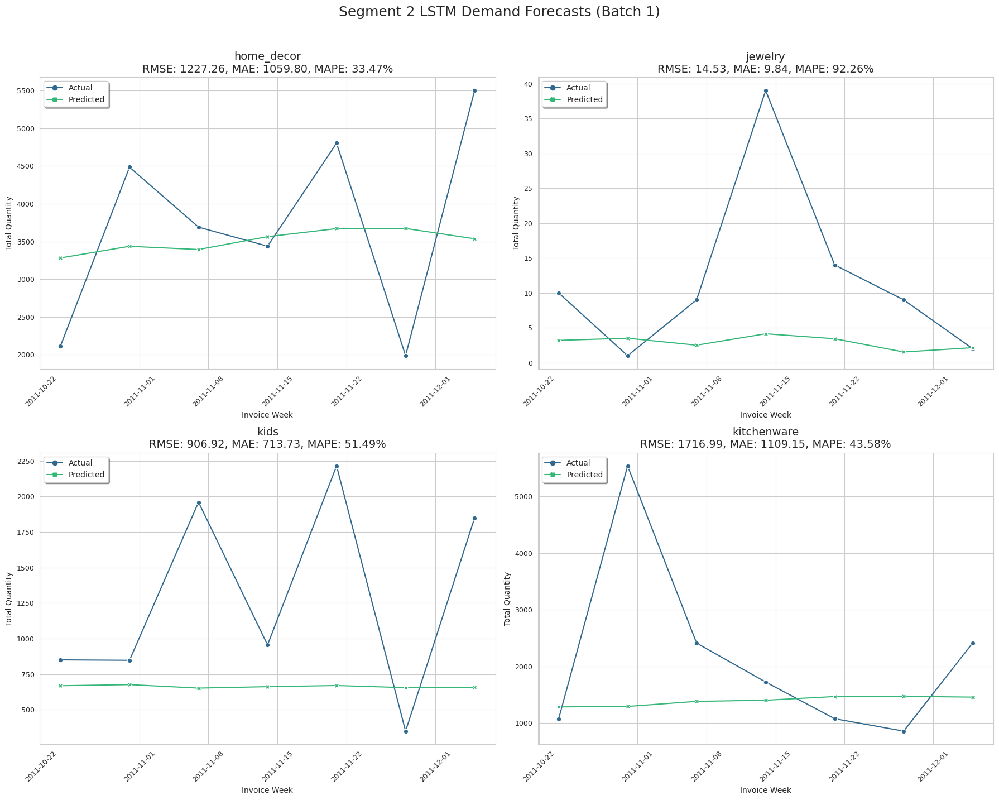

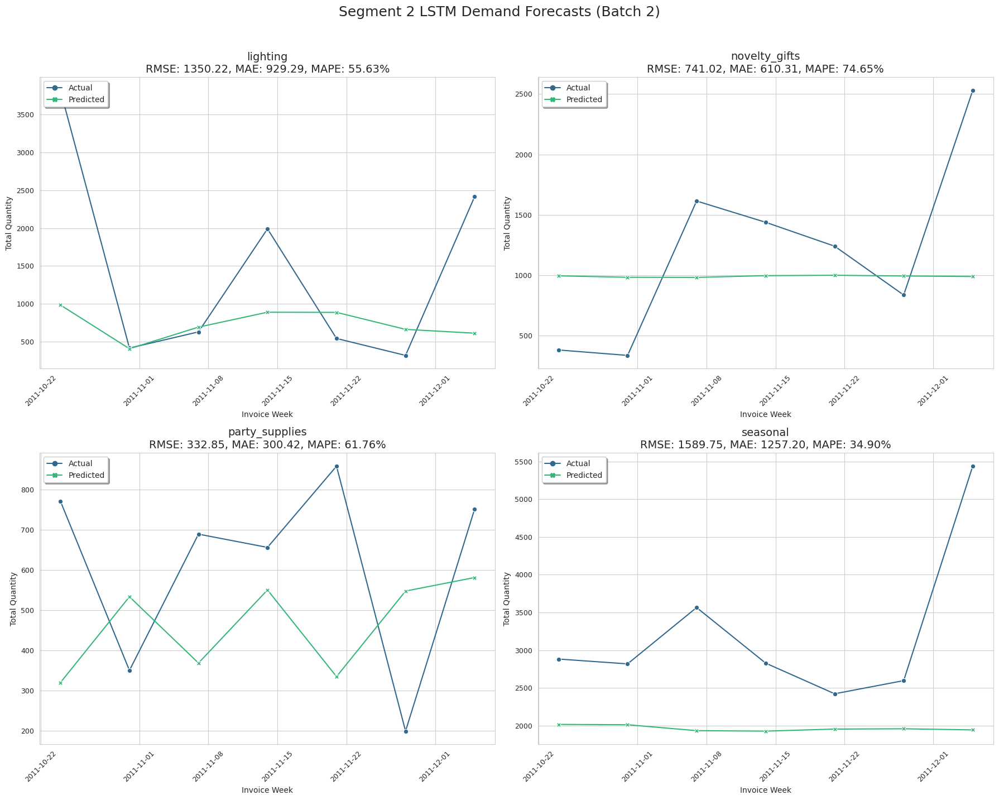

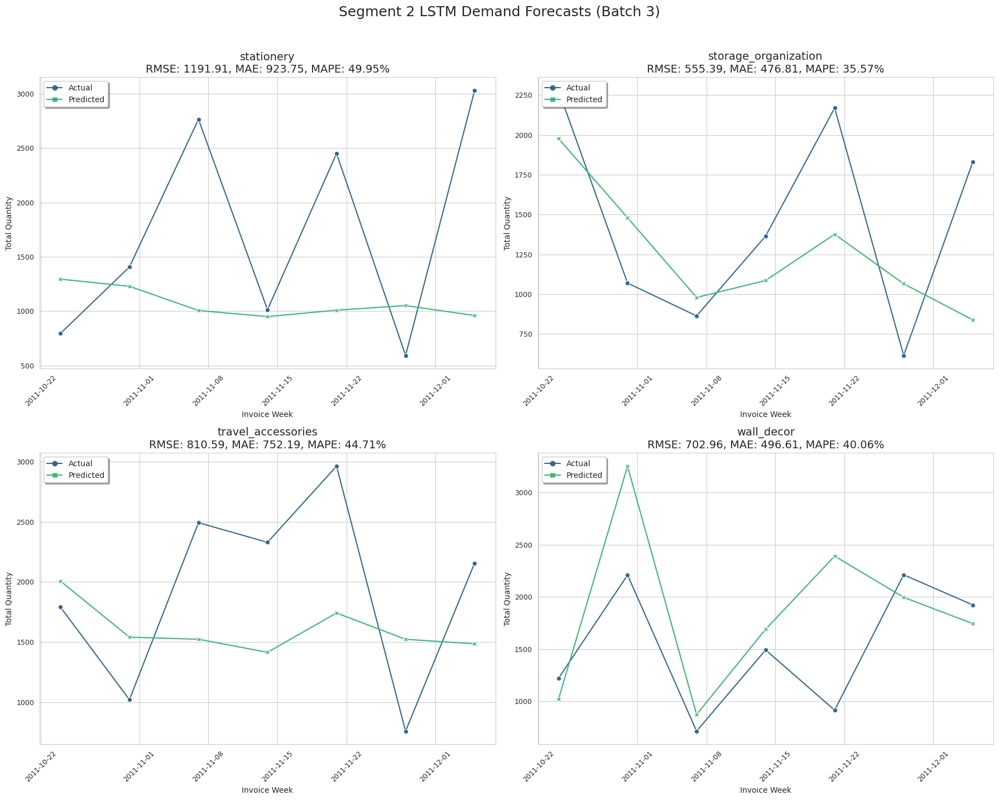

In [71]:
segment_id = 2

def create_sequences(X, y, look_back):
    Xs, ys = [], []
    for i in range(look_back, len(X)):
        Xs.append(X.iloc[i-look_back:i].values)
        ys.append(y.iloc[i])
    return np.array(Xs), np.array(ys)

# --- PyTorch LSTM Model Definition with multiple layers ---
class LSTMModel(nn.Module):
    def __init__(self, input_size, hidden_layer_size, output_size, dropout_rate, num_layers):
        super().__init__()
        self.hidden_layer_size = hidden_layer_size
        self.num_layers = num_layers # Store num_layers
        self.lstm = nn.LSTM(input_size, hidden_layer_size, num_layers=self.num_layers, batch_first=True) # Added num_layers
        self.dropout = nn.Dropout(dropout_rate)
        self.linear = nn.Linear(hidden_layer_size, output_size)

    def forward(self, input_seq):
        lstm_out, _ = self.lstm(input_seq)
        last_output = lstm_out[:, -1, :] # Take the output from the last time step of the last layer
        dropout_out = self.dropout(last_output)
        predictions = self.linear(dropout_out)
        return predictions

# --- Set up GPU device if available ---
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# --- Objective function for Optuna (PyTorch version) ---
def make_objective_pytorch(X_pool, X_test, y_pool_target, y_test_target):
    def objective(trial):
        look_back = trial.suggest_int("look_back", 5, 10)
        lstm_units = trial.suggest_int("lstm_units", 32, 512)
        dropout_rate = trial.suggest_float("dropout", 0.0, 0.5)
        batch_size = trial.suggest_categorical("batch_size", [32, 64, 128])
        learning_rate = trial.suggest_float("lr", 1e-5, 1e-2, log=False)
        epochs = trial.suggest_int("epochs", 10, 50)
        patience = trial.suggest_int("patience", 10, 30)
        num_lstm_layers = trial.suggest_int("num_lstm_layers", 1, 3) 

        # Data Scaling
        feature_scaler = MinMaxScaler()
        feature_scaler.fit(X_pool)
        scaled_full_X = feature_scaler.transform(pd.concat([X_pool, X_test]))

        target_scaler = MinMaxScaler()
        target_scaler.fit(y_pool_target.values.reshape(-1, 1))
        scaled_full_y_target = target_scaler.transform(pd.concat([y_pool_target, y_test_target]).values.reshape(-1, 1)).flatten()

        scaled_full_X_df = pd.DataFrame(scaled_full_X, index=pd.concat([X_pool, X_test]).index, columns=X_pool.columns)
        scaled_full_y_target_series = pd.Series(scaled_full_y_target, index=pd.concat([y_pool_target, y_test_target]).index)

        # Sequence creation
        X_seq, y_seq = create_sequences(scaled_full_X_df, scaled_full_y_target_series, look_back)
        
        original_pool_len = len(X_pool)
        num_train_sequences = original_pool_len - look_back
        
        if num_train_sequences <= 0:
            return float("inf")

        X_train_seq, y_train_seq = X_seq[:num_train_sequences], y_seq[:num_train_sequences]
        X_test_seq, y_test_seq = X_seq[num_train_sequences:], y_seq[num_train_sequences:]

        if len(X_test_seq) == 0:
            return float("inf")

        # Convert to PyTorch tensors and move to device
        X_train_tensor = torch.tensor(X_train_seq, dtype=torch.float32).to(device)
        y_train_tensor = torch.tensor(y_train_seq, dtype=torch.float32).unsqueeze(1).to(device)
        X_test_tensor = torch.tensor(X_test_seq, dtype=torch.float32).to(device)
        y_test_tensor = torch.tensor(y_test_seq, dtype=torch.float32).unsqueeze(1).to(device)

        train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
        train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)

        # Build model and move to device
        model = LSTMModel(input_size=X_train_seq.shape[2],
                          hidden_layer_size=lstm_units,
                          output_size=1,
                          dropout_rate=dropout_rate,
                          num_layers=num_lstm_layers).to(device) # Passed num_lstm_layers
        
        optimizer = optim.Adam(model.parameters(), lr=learning_rate)
        criterion = nn.L1Loss() # MAE loss

        # Early stopping logic
        best_loss = float('inf')
        patience_counter = 0
        
        # Train model
        for epoch in range(epochs):
            model.train()
            for batch_X, batch_y in train_loader:
                optimizer.zero_grad()
                outputs = model(batch_X)
                loss = criterion(outputs, batch_y)
                loss.backward()
                optimizer.step()

            model.eval()
            with torch.no_grad():
                val_split_idx = int(len(X_train_seq) * 0.8)
                if val_split_idx >= len(X_train_seq):
                    val_loss = float('inf')
                else:
                    val_outputs = model(X_train_tensor[val_split_idx:])
                    val_loss = criterion(val_outputs, y_train_tensor[val_split_idx:]).item()
                
            if val_loss < best_loss:
                best_loss = val_loss
                patience_counter = 0
                torch.save(model.state_dict(), 'best_lstm_model.pth')
            else:
                patience_counter += 1
                if patience_counter >= patience:
                    break
        
        # Load best model weights before predicting
        model.load_state_dict(torch.load('best_lstm_model.pth'))
        
        # Predict
        model.eval()
        with torch.no_grad():
            preds_scaled_tensor = model(X_test_tensor)
        
        # Move predictions back to CPU for numpy conversion and inverse scaling
        preds_scaled = preds_scaled_tensor.cpu().numpy().flatten()
        actuals = y_test_tensor.cpu().numpy().flatten()

        # Inverse transform predictions and actuals
        preds = target_scaler.inverse_transform(preds_scaled.reshape(-1, 1)).flatten()
        actuals = target_scaler.inverse_transform(actuals.reshape(-1, 1)).flatten()

        preds[preds < 0] = 0 

        return mean_absolute_error(actuals, preds)
    return objective

print(f"** Modeling for Segment {segment_id} (Mainstream Customers) using LSTM **")

X_pool = segment_data_splits[segment_id]['X_train_val_pool']
y_pool_dict = segment_data_splits[segment_id]['y_train_val_pool_dict']
tscv_splits = segment_data_splits[segment_id]['tscv_splits'] 
X_test = segment_data_splits[segment_id]['X_test']
y_test_dict = segment_data_splits[segment_id]['y_test_dict']
target_cols_segment = segment_data_splits[segment_id]['target_cols_segment']

# Storage for results
results_summary_lstm = []
predictions_for_plotting_lstm = {}

# --- Training Loop per Product Category ---
for target_product_category in target_cols_segment:
    print(f"\n--- Tuning and training LSTM for target: {target_product_category} ---")

    y_pool_target = y_pool_dict[target_product_category]
    y_test_target = y_test_dict[target_product_category]
    
    min_data_points = max(21, len(X_test)) + 1 
    if len(X_pool) + len(X_test) < min_data_points:
        print(f"  Skipping {target_product_category}: Not enough total data points ({len(X_pool) + len(X_test)}) for sequencing.")
        results_summary_lstm.append({
            'Product_Category': target_product_category.replace('_Total_Quantity', ''),
            'RMSE': np.nan, 'MAE': np.nan, 'MAPE': np.nan
        })
        continue

    # Run Optuna study
    study = optuna.create_study(direction="minimize")
    study.optimize(make_objective_pytorch(X_pool, X_test, y_pool_target, y_test_target), n_trials=30, show_progress_bar=False) # Reduced n_trials for quicker demo

    best_params = study.best_params
    print(f"  Best parameters for {target_product_category}: {best_params}")

    # --- Rebuild and Train Final Model with Best Params (outside Optuna's objective) ---
    look_back = best_params["look_back"]
    lstm_units = best_params["lstm_units"]
    dropout_rate = best_params["dropout"]
    batch_size = best_params["batch_size"]
    learning_rate = best_params["lr"]
    epochs = best_params["epochs"]
    patience = best_params["patience"]
    num_lstm_layers = best_params["num_lstm_layers"] # Retrieved num_lstm_layers

    # Prepare sequences using best look_back for the final model training
    feature_scaler = MinMaxScaler()
    feature_scaler.fit(X_pool)
    scaled_full_X = feature_scaler.transform(pd.concat([X_pool, X_test]))

    target_scaler = MinMaxScaler()
    target_scaler.fit(y_pool_target.values.reshape(-1, 1))
    scaled_full_y_target = target_scaler.transform(pd.concat([y_pool_target, y_test_target]).values.reshape(-1, 1)).flatten()

    scaled_full_X_df = pd.DataFrame(scaled_full_X, index=pd.concat([X_pool, X_test]).index, columns=X_pool.columns)
    scaled_full_y_target_series = pd.Series(scaled_full_y_target, index=pd.concat([y_pool_target, y_test_target]).index)

    X_seq, y_seq = create_sequences(scaled_full_X_df, scaled_full_y_target_series, look_back)
    
    num_train_sequences = len(X_pool) - look_back
    
    if num_train_sequences <= 0:
        print(f"  Skipping final training for {target_product_category}: not enough training data for sequences with look_back={look_back}.")
        results_summary_lstm.append({
            'Product_Category': target_product_category.replace('_Total_Quantity', ''),
            'RMSE': np.nan, 'MAE': np.nan, 'MAPE': np.nan
        })
        continue

    X_train_seq_final, y_train_seq_final = X_seq[:num_train_sequences], y_seq[:num_train_sequences]
    X_test_seq_final, y_test_seq_final = X_seq[num_train_sequences:], y_seq[num_train_sequences:]

    if len(X_test_seq_final) == 0:
        print(f"  Skipping final training for {target_product_category}: no test sequences can be formed with look_back={look_back}.")
        results_summary_lstm.append({
            'Product_Category': target_product_category.replace('_Total_Quantity', ''),
            'RMSE': np.nan, 'MAE': np.nan, 'MAPE': np.nan
        })
        continue

    # Convert to PyTorch tensors and move to device for final training
    X_train_tensor_final = torch.tensor(X_train_seq_final, dtype=torch.float32).to(device)
    y_train_tensor_final = torch.tensor(y_train_seq_final, dtype=torch.float32).unsqueeze(1).to(device)
    X_test_tensor_final = torch.tensor(X_test_seq_final, dtype=torch.float32).to(device)
    y_test_tensor_final = torch.tensor(y_test_seq_final, dtype=torch.float32).unsqueeze(1).to(device)

    train_dataset_final = TensorDataset(X_train_tensor_final, y_train_tensor_final)
    train_loader_final = DataLoader(train_dataset_final, batch_size=batch_size, shuffle=False)

    # Final model instance and move to device
    final_model = LSTMModel(input_size=X_train_seq_final.shape[2],
                            hidden_layer_size=lstm_units,
                            output_size=1,
                            dropout_rate=dropout_rate,
                            num_layers=num_lstm_layers).to(device) # Passed num_lstm_layers
    
    optimizer_final = optim.Adam(final_model.parameters(), lr=learning_rate)
    criterion_final = nn.L1Loss() # MAE loss

    best_loss_final = float('inf')
    patience_counter_final = 0

    print(f"  Training final model for {target_product_category} with best params...")
    for epoch in range(epochs):
        final_model.train()
        for batch_X, batch_y in train_loader_final:
            optimizer_final.zero_grad()
            outputs = final_model(batch_X)
            loss = criterion_final(outputs, batch_y)
            loss.backward()
            optimizer_final.step()

        final_model.eval()
        with torch.no_grad():
            val_split_idx_final = int(len(X_train_seq_final) * 0.8)
            if val_split_idx_final >= len(X_train_seq_final):
                val_loss_final = float('inf') 
            else:
                val_outputs_final = final_model(X_train_tensor_final[val_split_idx_final:])
                val_loss_final = criterion_final(val_outputs_final, y_train_tensor_final[val_split_idx_final:]).item()
            
        if val_loss_final < best_loss_final:
            best_loss_final = val_loss_final
            patience_counter_final = 0
            torch.save(final_model.state_dict(), 'final_lstm_model.pth')
        else:
            patience_counter_final += 1
            if patience_counter_final >= patience:
                break
    
    # Load best model weights for prediction
    final_model.load_state_dict(torch.load('final_lstm_model.pth'))

    # Prediction on test set
    final_model.eval()
    with torch.no_grad():
        preds_scaled_tensor_final = final_model(X_test_tensor_final)
    
    # Move predictions and actuals back to CPU for numpy conversion and inverse scaling
    preds_scaled_final = preds_scaled_tensor_final.cpu().numpy().flatten()
    actuals_final = y_test_tensor_final.cpu().numpy().flatten()

    preds_final = target_scaler.inverse_transform(preds_scaled_final.reshape(-1, 1)).flatten()
    actuals_final = target_scaler.inverse_transform(actuals_final.reshape(-1, 1)).flatten()

    preds_final[preds_final < 0] = 0

    # Evaluation
    rmse = np.sqrt(mean_squared_error(actuals_final, preds_final))
    mae = mean_absolute_error(actuals_final, preds_final)
    mape = mean_absolute_percentage_error(actuals_final, preds_final)

    results_summary_lstm.append({
        'Product_Category': target_product_category.replace('_Total_Quantity', ''),
        'RMSE': rmse, 'MAE': mae, 'MAPE': mape
    })

    predictions_for_plotting_lstm[target_product_category] = pd.DataFrame({
        'Actual': actuals_final,
        'Predicted': preds_final
    }, index=X_test.index[-len(actuals_final):])

print("\n--- All LSTM models trained and evaluated. ---")

# --- Display Results ---
summary_df_lstm = pd.DataFrame(results_summary_lstm).set_index('Product_Category')
print(f"\n** Segment {segment_id}: LSTM with Optuna Tuning - Performance Summary (PyTorch) **")
display(summary_df_lstm.sort_values(by='MAPE'))

# Plotting Code (same as yours, with metric titles adjusted for standard metrics)
print(f"\n** Segment {segment_id}: LSTM Regressor - Actual vs. Predicted Demand (Test Set Visuals) **")

sns.set_style("whitegrid")
colors = sns.color_palette("viridis", n_colors=2)
plots_per_figure = 4
rows_per_figure = int(np.ceil(plots_per_figure / 2))
cols_per_figure = 2

# Ensure ordered_categories_display_name is defined for plotting
# It should come from the `summary_df_lstm.index.tolist()` or a similar source
ordered_categories_display_name = summary_df_lstm.index.tolist()


for i, display_name in enumerate(ordered_categories_display_name):
    category_key = display_name.replace(' ', '_') + '_Total_Quantity'
    
    if category_key not in predictions_for_plotting_lstm or predictions_for_plotting_lstm[category_key].empty:
        print(f"  Skipping plot for {display_name} as test set was empty or invalid for LSTM.")
        continue

    data = predictions_for_plotting_lstm[category_key]

    if i % plots_per_figure == 0:
        if i > 0:
            plt.tight_layout()
            plt.show()
            
        plt.figure(figsize=(18, 7 * rows_per_figure))
        plt.suptitle(f'Segment {segment_id} LSTM Demand Forecasts (Batch {int(i/plots_per_figure) + 1})', fontsize=18, y=1.02)

    subplot_idx = (i % plots_per_figure) + 1
    ax = plt.subplot(rows_per_figure, cols_per_figure, subplot_idx)
    product_name = display_name

    try:
        category_metrics = summary_df_lstm.loc[display_name]
        rmse_val = category_metrics['RMSE']
        mae_val = category_metrics['MAE']
        mape_val = category_metrics['MAPE']
        plot_title_metrics = f'\nRMSE: {rmse_val:.2f}, MAE: {mae_val:.2f}, MAPE: {mape_val:.2f}%'
    except KeyError:
        plot_title_metrics = "\nMetrics N/A"

    sns.lineplot(data=data, ax=ax, markers=True, dashes=False, palette=colors)
    
    ax.set_title(f'{product_name}{plot_title_metrics}', fontsize=14)
    ax.set_xlabel('Invoice Week', fontsize=10)
    ax.set_ylabel('Total Quantity', fontsize=10)
    
    ax.tick_params(axis='x', rotation=45, labelsize=9)
    ax.tick_params(axis='y', labelsize=9)
    
    ax.legend(loc='upper left', fontsize=10, frameon=True, fancybox=True, shadow=True)

plt.tight_layout()
plt.show()

## N-Beats: For Segment 2(Wholesalers)

[I 2025-07-13 18:12:30,720] A new study created in memory with name: no-name-d2edfe38-ee83-47e6-bfa0-1aec791534db


Using device: cuda
** Modeling for Segment 2 (Mainstream Customers) using N-BEATS **

--- Tuning and training N-BEATS for target: home_decor_Total_Quantity ---


[I 2025-07-13 18:12:31,648] Trial 0 finished with value: 1561.904296875 and parameters: {'look_back': 15, 'num_blocks_per_stack': 2, 'num_neurons': 256, 'num_layers': 4, 'theta_dims_factor': 8, 'batch_size': 64, 'lr': 0.007481978570028344, 'epochs': 59, 'patience': 12}. Best is trial 0 with value: 1561.904296875.
[I 2025-07-13 18:12:32,397] Trial 1 finished with value: 1669.017822265625 and parameters: {'look_back': 26, 'num_blocks_per_stack': 2, 'num_neurons': 128, 'num_layers': 4, 'theta_dims_factor': 8, 'batch_size': 64, 'lr': 0.008517568099226795, 'epochs': 68, 'patience': 18}. Best is trial 0 with value: 1561.904296875.
[I 2025-07-13 18:12:32,919] Trial 2 finished with value: 1428.2939453125 and parameters: {'look_back': 27, 'num_blocks_per_stack': 4, 'num_neurons': 512, 'num_layers': 4, 'theta_dims_factor': 4, 'batch_size': 32, 'lr': 0.008267011030933757, 'epochs': 76, 'patience': 10}. Best is trial 2 with value: 1428.2939453125.
[I 2025-07-13 18:12:33,766] Trial 3 finished with 

  Best parameters for home_decor_Total_Quantity: {'look_back': 24, 'num_blocks_per_stack': 4, 'num_neurons': 512, 'num_layers': 3, 'theta_dims_factor': 4, 'batch_size': 32, 'lr': 0.00996303857286252, 'epochs': 97, 'patience': 10}
  Training final model for home_decor_Total_Quantity with best params...


[I 2025-07-13 18:12:59,241] A new study created in memory with name: no-name-684021ac-3c88-4558-b859-3992a9aef291



--- Tuning and training N-BEATS for target: jewelry_Total_Quantity ---


[I 2025-07-13 18:13:00,969] Trial 0 finished with value: 9.015774726867676 and parameters: {'look_back': 22, 'num_blocks_per_stack': 4, 'num_neurons': 512, 'num_layers': 4, 'theta_dims_factor': 4, 'batch_size': 128, 'lr': 0.0033729560252847434, 'epochs': 81, 'patience': 13}. Best is trial 0 with value: 9.015774726867676.
[I 2025-07-13 18:13:01,445] Trial 1 finished with value: 35.915645599365234 and parameters: {'look_back': 17, 'num_blocks_per_stack': 3, 'num_neurons': 128, 'num_layers': 3, 'theta_dims_factor': 4, 'batch_size': 128, 'lr': 0.006031459271841796, 'epochs': 64, 'patience': 24}. Best is trial 0 with value: 9.015774726867676.
[I 2025-07-13 18:13:04,176] Trial 2 finished with value: 24.301023483276367 and parameters: {'look_back': 22, 'num_blocks_per_stack': 3, 'num_neurons': 128, 'num_layers': 4, 'theta_dims_factor': 8, 'batch_size': 64, 'lr': 0.008916971672242814, 'epochs': 73, 'patience': 22}. Best is trial 0 with value: 9.015774726867676.
[I 2025-07-13 18:13:05,040] Tria

  Best parameters for jewelry_Total_Quantity: {'look_back': 16, 'num_blocks_per_stack': 2, 'num_neurons': 128, 'num_layers': 3, 'theta_dims_factor': 16, 'batch_size': 64, 'lr': 0.000855319017336352, 'epochs': 92, 'patience': 12}
  Training final model for jewelry_Total_Quantity with best params...


[I 2025-07-13 18:13:24,892] A new study created in memory with name: no-name-0ac94580-d716-49a9-9453-6c923fc678e2



--- Tuning and training N-BEATS for target: kids_Total_Quantity ---


[I 2025-07-13 18:13:26,121] Trial 0 finished with value: 803.1089477539062 and parameters: {'look_back': 24, 'num_blocks_per_stack': 2, 'num_neurons': 512, 'num_layers': 4, 'theta_dims_factor': 16, 'batch_size': 128, 'lr': 0.008005499533343726, 'epochs': 86, 'patience': 30}. Best is trial 0 with value: 803.1089477539062.
[I 2025-07-13 18:13:27,293] Trial 1 finished with value: 1129.8155517578125 and parameters: {'look_back': 27, 'num_blocks_per_stack': 2, 'num_neurons': 512, 'num_layers': 4, 'theta_dims_factor': 8, 'batch_size': 64, 'lr': 0.009526408065219148, 'epochs': 71, 'patience': 27}. Best is trial 0 with value: 803.1089477539062.
[I 2025-07-13 18:13:28,936] Trial 2 finished with value: 956.2909545898438 and parameters: {'look_back': 24, 'num_blocks_per_stack': 4, 'num_neurons': 256, 'num_layers': 4, 'theta_dims_factor': 8, 'batch_size': 32, 'lr': 0.0009053342624924052, 'epochs': 70, 'patience': 18}. Best is trial 0 with value: 803.1089477539062.
[I 2025-07-13 18:13:29,822] Trial

  Best parameters for kids_Total_Quantity: {'look_back': 24, 'num_blocks_per_stack': 2, 'num_neurons': 512, 'num_layers': 4, 'theta_dims_factor': 16, 'batch_size': 128, 'lr': 0.008005499533343726, 'epochs': 86, 'patience': 30}
  Training final model for kids_Total_Quantity with best params...


[I 2025-07-13 18:13:49,066] A new study created in memory with name: no-name-8fd8af24-0dfa-4237-8491-322044db426b



--- Tuning and training N-BEATS for target: kitchenware_Total_Quantity ---


[I 2025-07-13 18:13:50,109] Trial 0 finished with value: 1711.744384765625 and parameters: {'look_back': 26, 'num_blocks_per_stack': 3, 'num_neurons': 512, 'num_layers': 2, 'theta_dims_factor': 8, 'batch_size': 64, 'lr': 0.004861570291335486, 'epochs': 64, 'patience': 13}. Best is trial 0 with value: 1711.744384765625.
[I 2025-07-13 18:13:50,887] Trial 1 finished with value: 1206.2003173828125 and parameters: {'look_back': 14, 'num_blocks_per_stack': 2, 'num_neurons': 256, 'num_layers': 4, 'theta_dims_factor': 16, 'batch_size': 64, 'lr': 0.0020695337339651427, 'epochs': 55, 'patience': 23}. Best is trial 1 with value: 1206.2003173828125.
[I 2025-07-13 18:13:51,691] Trial 2 finished with value: 1278.927001953125 and parameters: {'look_back': 26, 'num_blocks_per_stack': 2, 'num_neurons': 512, 'num_layers': 4, 'theta_dims_factor': 4, 'batch_size': 64, 'lr': 0.008444333253334423, 'epochs': 68, 'patience': 15}. Best is trial 1 with value: 1206.2003173828125.
[I 2025-07-13 18:13:52,596] Tria

  Best parameters for kitchenware_Total_Quantity: {'look_back': 18, 'num_blocks_per_stack': 4, 'num_neurons': 256, 'num_layers': 2, 'theta_dims_factor': 4, 'batch_size': 128, 'lr': 0.007544805801606376, 'epochs': 75, 'patience': 21}
  Training final model for kitchenware_Total_Quantity with best params...


[I 2025-07-13 18:14:08,047] A new study created in memory with name: no-name-a68bf3f9-66db-4c19-b1fe-ca1719480bb7



--- Tuning and training N-BEATS for target: lighting_Total_Quantity ---


[I 2025-07-13 18:14:09,067] Trial 0 finished with value: 1206.885009765625 and parameters: {'look_back': 18, 'num_blocks_per_stack': 2, 'num_neurons': 256, 'num_layers': 3, 'theta_dims_factor': 8, 'batch_size': 32, 'lr': 0.00391706180668737, 'epochs': 89, 'patience': 19}. Best is trial 0 with value: 1206.885009765625.
[I 2025-07-13 18:14:10,204] Trial 1 finished with value: 1040.5528564453125 and parameters: {'look_back': 20, 'num_blocks_per_stack': 3, 'num_neurons': 128, 'num_layers': 4, 'theta_dims_factor': 8, 'batch_size': 64, 'lr': 0.0069800741832910206, 'epochs': 68, 'patience': 21}. Best is trial 1 with value: 1040.5528564453125.
[I 2025-07-13 18:14:11,029] Trial 2 finished with value: 1317.7113037109375 and parameters: {'look_back': 16, 'num_blocks_per_stack': 3, 'num_neurons': 256, 'num_layers': 2, 'theta_dims_factor': 4, 'batch_size': 32, 'lr': 0.007570161733198041, 'epochs': 57, 'patience': 24}. Best is trial 1 with value: 1040.5528564453125.
[I 2025-07-13 18:14:12,557] Trial

  Best parameters for lighting_Total_Quantity: {'look_back': 21, 'num_blocks_per_stack': 3, 'num_neurons': 128, 'num_layers': 2, 'theta_dims_factor': 16, 'batch_size': 128, 'lr': 0.005787584862222787, 'epochs': 99, 'patience': 13}
  Training final model for lighting_Total_Quantity with best params...


[I 2025-07-13 18:14:32,799] A new study created in memory with name: no-name-29c9869c-b46e-4dad-9428-01dd3a11632d



--- Tuning and training N-BEATS for target: novelty_gifts_Total_Quantity ---


[I 2025-07-13 18:14:34,067] Trial 0 finished with value: 523.9427490234375 and parameters: {'look_back': 21, 'num_blocks_per_stack': 3, 'num_neurons': 512, 'num_layers': 2, 'theta_dims_factor': 16, 'batch_size': 32, 'lr': 0.005555160123985281, 'epochs': 76, 'patience': 25}. Best is trial 0 with value: 523.9427490234375.
[I 2025-07-13 18:14:35,956] Trial 1 finished with value: 590.7645263671875 and parameters: {'look_back': 25, 'num_blocks_per_stack': 4, 'num_neurons': 512, 'num_layers': 3, 'theta_dims_factor': 8, 'batch_size': 32, 'lr': 0.005123243408136081, 'epochs': 65, 'patience': 26}. Best is trial 0 with value: 523.9427490234375.
[I 2025-07-13 18:14:36,616] Trial 2 finished with value: 684.7717895507812 and parameters: {'look_back': 14, 'num_blocks_per_stack': 2, 'num_neurons': 128, 'num_layers': 3, 'theta_dims_factor': 16, 'batch_size': 64, 'lr': 0.0055990461426659545, 'epochs': 60, 'patience': 27}. Best is trial 0 with value: 523.9427490234375.
[I 2025-07-13 18:14:37,427] Trial 

  Best parameters for novelty_gifts_Total_Quantity: {'look_back': 21, 'num_blocks_per_stack': 3, 'num_neurons': 256, 'num_layers': 3, 'theta_dims_factor': 8, 'batch_size': 32, 'lr': 0.001580182425192579, 'epochs': 72, 'patience': 19}
  Training final model for novelty_gifts_Total_Quantity with best params...


[I 2025-07-13 18:14:58,105] A new study created in memory with name: no-name-3de29f6b-8783-448e-896e-75c593aa3214



--- Tuning and training N-BEATS for target: party_supplies_Total_Quantity ---


[I 2025-07-13 18:14:59,557] Trial 0 finished with value: 278.35687255859375 and parameters: {'look_back': 28, 'num_blocks_per_stack': 4, 'num_neurons': 128, 'num_layers': 3, 'theta_dims_factor': 4, 'batch_size': 128, 'lr': 0.0016239103462069642, 'epochs': 83, 'patience': 22}. Best is trial 0 with value: 278.35687255859375.
[I 2025-07-13 18:15:00,744] Trial 1 finished with value: 386.0960998535156 and parameters: {'look_back': 20, 'num_blocks_per_stack': 3, 'num_neurons': 512, 'num_layers': 3, 'theta_dims_factor': 8, 'batch_size': 64, 'lr': 0.002596184660143675, 'epochs': 55, 'patience': 14}. Best is trial 0 with value: 278.35687255859375.
[I 2025-07-13 18:15:01,694] Trial 2 finished with value: 167.5305938720703 and parameters: {'look_back': 15, 'num_blocks_per_stack': 3, 'num_neurons': 512, 'num_layers': 2, 'theta_dims_factor': 16, 'batch_size': 64, 'lr': 0.009064530711326334, 'epochs': 61, 'patience': 14}. Best is trial 2 with value: 167.5305938720703.
[I 2025-07-13 18:15:02,782] Tri

  Best parameters for party_supplies_Total_Quantity: {'look_back': 15, 'num_blocks_per_stack': 3, 'num_neurons': 512, 'num_layers': 2, 'theta_dims_factor': 16, 'batch_size': 64, 'lr': 0.009064530711326334, 'epochs': 61, 'patience': 14}
  Training final model for party_supplies_Total_Quantity with best params...


[I 2025-07-13 18:15:19,081] A new study created in memory with name: no-name-fb2a2d35-00c3-46bc-9b80-fd7e74cccea9



--- Tuning and training N-BEATS for target: seasonal_Total_Quantity ---


[I 2025-07-13 18:15:20,921] Trial 0 finished with value: 2443.182861328125 and parameters: {'look_back': 16, 'num_blocks_per_stack': 4, 'num_neurons': 512, 'num_layers': 3, 'theta_dims_factor': 16, 'batch_size': 32, 'lr': 0.004560429065501515, 'epochs': 54, 'patience': 16}. Best is trial 0 with value: 2443.182861328125.
[I 2025-07-13 18:15:21,927] Trial 1 finished with value: 2389.70263671875 and parameters: {'look_back': 22, 'num_blocks_per_stack': 2, 'num_neurons': 512, 'num_layers': 2, 'theta_dims_factor': 4, 'batch_size': 64, 'lr': 0.0011945730479942177, 'epochs': 96, 'patience': 26}. Best is trial 1 with value: 2389.70263671875.
[I 2025-07-13 18:15:22,462] Trial 2 finished with value: 2685.148193359375 and parameters: {'look_back': 27, 'num_blocks_per_stack': 2, 'num_neurons': 128, 'num_layers': 3, 'theta_dims_factor': 4, 'batch_size': 32, 'lr': 0.0030744242098379735, 'epochs': 87, 'patience': 11}. Best is trial 1 with value: 2389.70263671875.
[I 2025-07-13 18:15:23,603] Trial 3 f

  Best parameters for seasonal_Total_Quantity: {'look_back': 19, 'num_blocks_per_stack': 2, 'num_neurons': 256, 'num_layers': 2, 'theta_dims_factor': 4, 'batch_size': 64, 'lr': 0.0002563002183438335, 'epochs': 58, 'patience': 25}
  Training final model for seasonal_Total_Quantity with best params...


[I 2025-07-13 18:15:38,117] A new study created in memory with name: no-name-32c9c978-26b8-4f13-9957-e920d9a7bf0c



--- Tuning and training N-BEATS for target: stationery_Total_Quantity ---


[I 2025-07-13 18:15:38,632] Trial 0 finished with value: 1206.1123046875 and parameters: {'look_back': 23, 'num_blocks_per_stack': 2, 'num_neurons': 256, 'num_layers': 2, 'theta_dims_factor': 8, 'batch_size': 32, 'lr': 0.004960155363641125, 'epochs': 51, 'patience': 11}. Best is trial 0 with value: 1206.1123046875.
[I 2025-07-13 18:15:40,477] Trial 1 finished with value: 1323.1224365234375 and parameters: {'look_back': 27, 'num_blocks_per_stack': 3, 'num_neurons': 128, 'num_layers': 4, 'theta_dims_factor': 16, 'batch_size': 64, 'lr': 0.0004085355463505657, 'epochs': 96, 'patience': 26}. Best is trial 0 with value: 1206.1123046875.
[I 2025-07-13 18:15:40,939] Trial 2 finished with value: 1387.8916015625 and parameters: {'look_back': 26, 'num_blocks_per_stack': 2, 'num_neurons': 128, 'num_layers': 3, 'theta_dims_factor': 8, 'batch_size': 128, 'lr': 0.007908945893711418, 'epochs': 81, 'patience': 12}. Best is trial 0 with value: 1206.1123046875.
[I 2025-07-13 18:15:42,347] Trial 3 finishe

  Best parameters for stationery_Total_Quantity: {'look_back': 14, 'num_blocks_per_stack': 4, 'num_neurons': 512, 'num_layers': 4, 'theta_dims_factor': 4, 'batch_size': 128, 'lr': 0.00721173522920213, 'epochs': 62, 'patience': 24}
  Training final model for stationery_Total_Quantity with best params...


[I 2025-07-13 18:16:07,846] A new study created in memory with name: no-name-594a619f-3866-48e7-933e-e6cbf1e34a1c



--- Tuning and training N-BEATS for target: storage_organization_Total_Quantity ---


[I 2025-07-13 18:16:09,381] Trial 0 finished with value: 454.6498107910156 and parameters: {'look_back': 17, 'num_blocks_per_stack': 3, 'num_neurons': 512, 'num_layers': 4, 'theta_dims_factor': 16, 'batch_size': 32, 'lr': 0.006709665373287749, 'epochs': 66, 'patience': 22}. Best is trial 0 with value: 454.6498107910156.
[I 2025-07-13 18:16:10,645] Trial 1 finished with value: 543.998046875 and parameters: {'look_back': 15, 'num_blocks_per_stack': 3, 'num_neurons': 256, 'num_layers': 2, 'theta_dims_factor': 8, 'batch_size': 128, 'lr': 0.001022847355131716, 'epochs': 81, 'patience': 22}. Best is trial 0 with value: 454.6498107910156.
[I 2025-07-13 18:16:11,001] Trial 2 finished with value: 651.4252319335938 and parameters: {'look_back': 24, 'num_blocks_per_stack': 2, 'num_neurons': 256, 'num_layers': 3, 'theta_dims_factor': 8, 'batch_size': 32, 'lr': 0.0009297118771722008, 'epochs': 89, 'patience': 12}. Best is trial 0 with value: 454.6498107910156.
[I 2025-07-13 18:16:11,871] Trial 3 fi

  Best parameters for storage_organization_Total_Quantity: {'look_back': 17, 'num_blocks_per_stack': 3, 'num_neurons': 512, 'num_layers': 4, 'theta_dims_factor': 16, 'batch_size': 32, 'lr': 0.006709665373287749, 'epochs': 66, 'patience': 22}
  Training final model for storage_organization_Total_Quantity with best params...


[I 2025-07-13 18:16:34,970] A new study created in memory with name: no-name-6400c84d-2c8a-45f1-95c3-52dcd9fdbcdd



--- Tuning and training N-BEATS for target: travel_accessories_Total_Quantity ---


[I 2025-07-13 18:16:35,736] Trial 0 finished with value: 668.7815551757812 and parameters: {'look_back': 14, 'num_blocks_per_stack': 3, 'num_neurons': 128, 'num_layers': 2, 'theta_dims_factor': 16, 'batch_size': 32, 'lr': 0.00439420635305944, 'epochs': 72, 'patience': 17}. Best is trial 0 with value: 668.7815551757812.
[I 2025-07-13 18:16:36,632] Trial 1 finished with value: 751.1387329101562 and parameters: {'look_back': 14, 'num_blocks_per_stack': 2, 'num_neurons': 256, 'num_layers': 3, 'theta_dims_factor': 8, 'batch_size': 128, 'lr': 0.007412896201472672, 'epochs': 79, 'patience': 21}. Best is trial 0 with value: 668.7815551757812.
[I 2025-07-13 18:16:37,678] Trial 2 finished with value: 798.3683471679688 and parameters: {'look_back': 16, 'num_blocks_per_stack': 3, 'num_neurons': 256, 'num_layers': 3, 'theta_dims_factor': 8, 'batch_size': 64, 'lr': 0.0068550139582287594, 'epochs': 61, 'patience': 22}. Best is trial 0 with value: 668.7815551757812.
[I 2025-07-13 18:16:38,920] Trial 3

  Best parameters for travel_accessories_Total_Quantity: {'look_back': 14, 'num_blocks_per_stack': 3, 'num_neurons': 128, 'num_layers': 2, 'theta_dims_factor': 16, 'batch_size': 32, 'lr': 0.00439420635305944, 'epochs': 72, 'patience': 17}
  Training final model for travel_accessories_Total_Quantity with best params...


[I 2025-07-13 18:16:53,845] A new study created in memory with name: no-name-74cd7d2f-3413-471a-9f44-53165980e83e



--- Tuning and training N-BEATS for target: wall_decor_Total_Quantity ---


[I 2025-07-13 18:16:54,513] Trial 0 finished with value: 568.6963500976562 and parameters: {'look_back': 18, 'num_blocks_per_stack': 2, 'num_neurons': 128, 'num_layers': 4, 'theta_dims_factor': 8, 'batch_size': 32, 'lr': 0.00018611483147796967, 'epochs': 60, 'patience': 11}. Best is trial 0 with value: 568.6963500976562.
[I 2025-07-13 18:16:56,516] Trial 1 finished with value: 534.121337890625 and parameters: {'look_back': 15, 'num_blocks_per_stack': 4, 'num_neurons': 512, 'num_layers': 3, 'theta_dims_factor': 4, 'batch_size': 128, 'lr': 0.006951852410844325, 'epochs': 58, 'patience': 23}. Best is trial 1 with value: 534.121337890625.
[I 2025-07-13 18:16:58,258] Trial 2 finished with value: 570.037109375 and parameters: {'look_back': 20, 'num_blocks_per_stack': 3, 'num_neurons': 256, 'num_layers': 4, 'theta_dims_factor': 16, 'batch_size': 128, 'lr': 0.0076042985842723725, 'epochs': 95, 'patience': 22}. Best is trial 1 with value: 534.121337890625.
[I 2025-07-13 18:16:59,280] Trial 3 fi

  Best parameters for wall_decor_Total_Quantity: {'look_back': 17, 'num_blocks_per_stack': 3, 'num_neurons': 128, 'num_layers': 2, 'theta_dims_factor': 4, 'batch_size': 64, 'lr': 0.0021619120484018426, 'epochs': 79, 'patience': 18}
  Training final model for wall_decor_Total_Quantity with best params...

--- All N-BEATS models trained and evaluated. ---

** Segment 2: N-BEATS with Optuna Tuning - Performance Summary (PyTorch) **


,RMSE,MAE,MAPE
Product_Category,,,
wall_decor,576.540771,433.390198,31.272146
seasonal,1714.741211,1218.648682,32.569185
storage_organization,587.446716,527.591675,39.412108
lighting,1678.179565,1070.732178,49.698108
kitchenware,1392.185913,1138.145752,59.531730
novelty_gifts,711.814148,511.116302,59.828180
home_decor,2273.249268,1704.656250,63.954782
stationery,1356.171021,1155.517944,67.710721
party_supplies,281.208618,235.282181,68.478149



** Segment 2: N-BEATS Regressor - Actual vs. Predicted Demand (Test Set Visuals) **


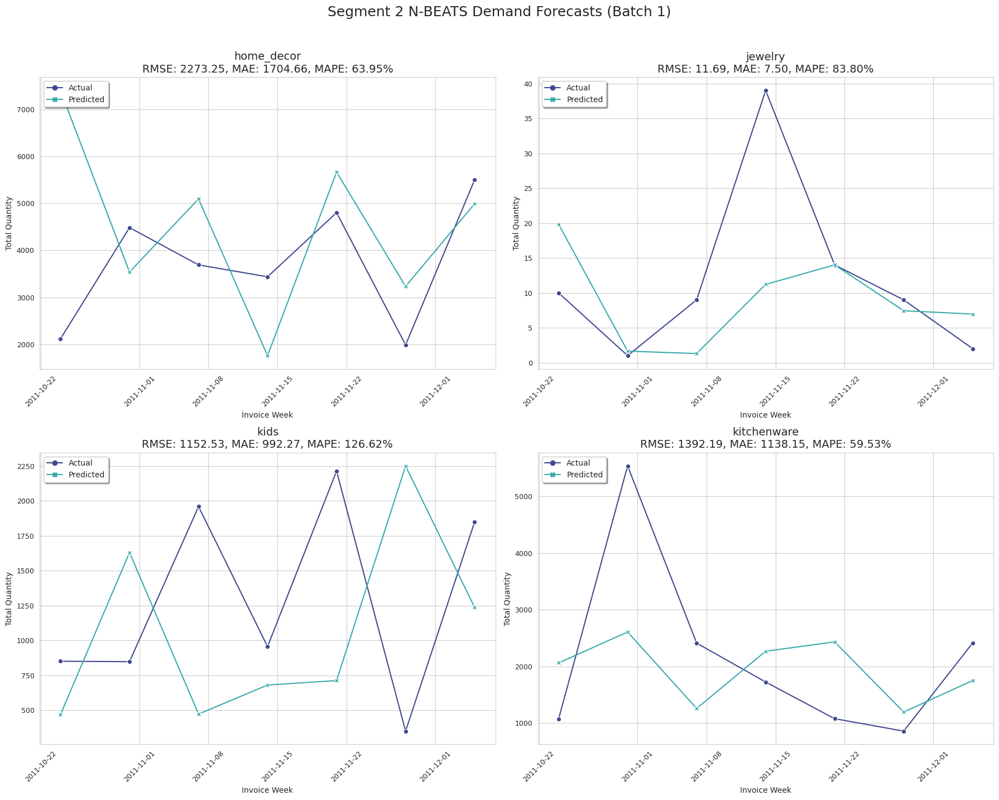

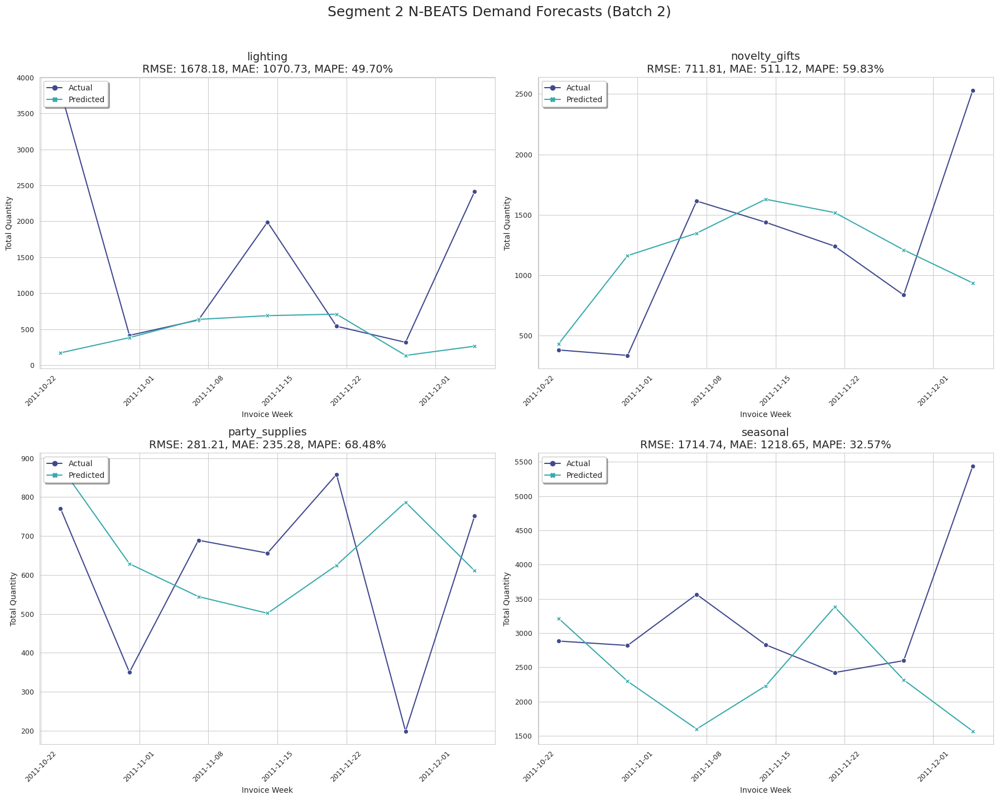

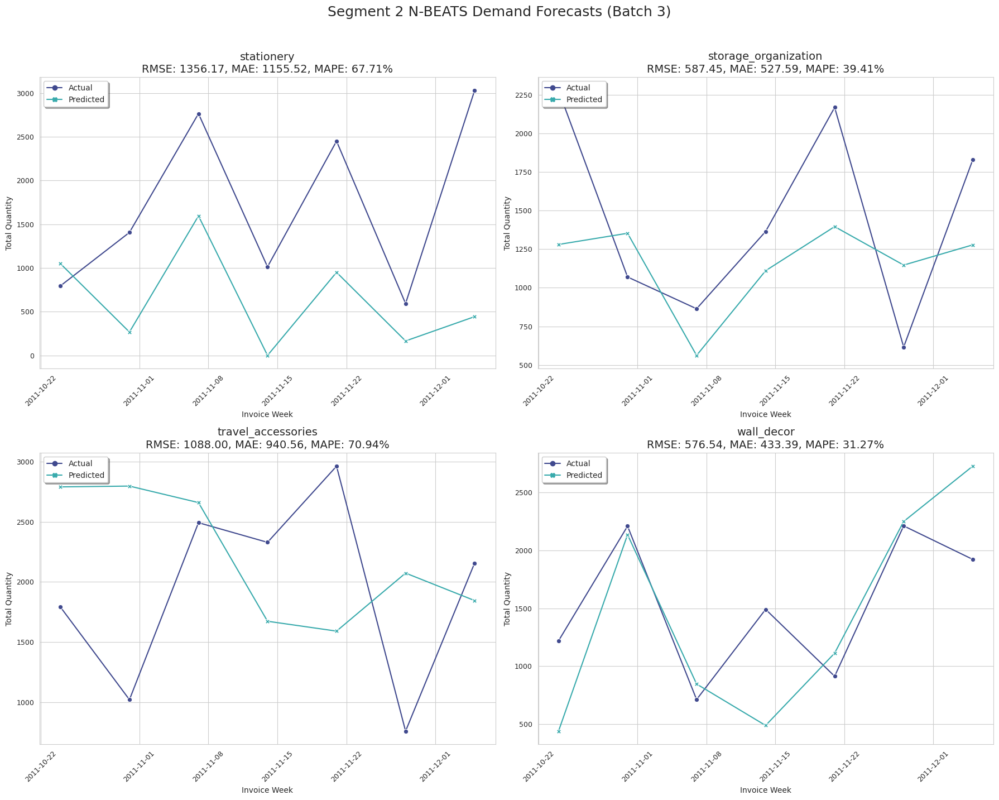

In [74]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
import pandas as pd
import numpy as np
import optuna
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

# Suppress warnings for cleaner output
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning)


segment_id = 2

def create_sequences(X, y, look_back):
    # For N-BEATS, we typically only need the target series itself as input
    # If X contains features, you'll need to decide how to incorporate them.
    # For a classic N-BEATS, input is just the past 'look_back' values of the target.
    # If you want to use external features, it becomes a bit more complex,
    # often by concatenating them or using an auxiliary network.
    # For now, let's assume `X` is used to align indices but `y` provides the sequence.
    Xs, ys = [], []
    for i in range(look_back, len(y)):
        Xs.append(y.iloc[i-look_back:i].values) # N-BEATS usually takes past target values as input
        ys.append(y.iloc[i])
    return np.array(Xs).reshape(-1, look_back, 1), np.array(ys) # Reshape to be 3D for model if needed


class NBeatsBlock(nn.Module):
    def __init__(self, input_dim, theta_dim, num_neurons, num_layers, forecast_length, backcast_length):
        super().__init__()
        self.forecast_length = forecast_length
        self.backcast_length = backcast_length
        
        self.layers = nn.ModuleList()
        self.layers.append(nn.Linear(input_dim, num_neurons))
        for _ in range(num_layers - 1):
            self.layers.append(nn.Linear(num_neurons, num_neurons))
        
        self.fc_theta = nn.Linear(num_neurons, theta_dim)
        
        # Basis functions for forecast and backcast
        self.fc_backcast = nn.Linear(theta_dim, backcast_length)
        self.fc_forecast = nn.Linear(theta_dim, forecast_length)
        
    def forward(self, x):
        for layer in self.layers:
            x = torch.relu(layer(x))
        theta = self.fc_theta(x)
        
        backcast = self.fc_backcast(theta)
        forecast = self.fc_forecast(theta)
        
        return backcast, forecast

class NBeatsNet(nn.Module):
    def __init__(self, look_back, forecast_horizon, stack_types, num_blocks_per_stack, 
                 theta_dims, num_neurons, num_layers,
                 input_size): # input_size is used to conform to your general setup, though for N-BEATS it's often 1
        super().__init__()
        
        self.input_size = input_size # Should be 1 if only target is input
        self.look_back = look_back
        self.forecast_horizon = forecast_horizon # Typically 1 for your setup (predict next step)
        
        self.stacks = nn.ModuleList()
        for i, stack_type in enumerate(stack_types):
            blocks = nn.ModuleList()
            for block_idx in range(num_blocks_per_stack[i]):
                # The input to each block is the backcast_length from the previous block,
                # or look_back for the first block in the first stack.
                block_input_dim = look_back if (i == 0 and block_idx == 0) else num_neurons 
                                # ^ This logic needs careful adjustment for full NBEATS
                                # Here, it's simplified: first block takes look_back, subsequent take num_neurons.
                                # A full N-BEATS often has input_dim as look_back for all blocks if `share_weights=True`

                blocks.append(NBeatsBlock(input_dim=look_back, # Simplified: assume each block takes full look_back
                                          theta_dim=theta_dims[i],
                                          num_neurons=num_neurons,
                                          num_layers=num_layers,
                                          forecast_length=forecast_horizon,
                                          backcast_length=look_back)) # Backcast length is look_back

            self.stacks.append(blocks)

    def forward(self, x):
        # x will be (batch_size, look_back, input_size) where input_size=1
        # Squeeze to (batch_size, look_back) for N-BEATS blocks
        x = x.squeeze(-1) # (batch_size, look_back) 
        
        residuals = x
        forecasts = []
        
        for stack_blocks in self.stacks:
            for block in stack_blocks:
                # The core N-BEATS idea: residuals are passed to the next block
                # However, for simplicity here, we're just summing forecasts.
                # A full N-BEATS passes (residuals - backcast_from_this_block) to next
                
                block_backcast, block_forecast = block(residuals) # Simplified input
                residuals = residuals - block_backcast # Residual connection
                forecasts.append(block_forecast)
        
        # Sum all forecasts for the final prediction
        # Ensure correct shape for final output (batch_size, 1)
        final_forecast = sum(forecasts)
        return final_forecast[:, :self.forecast_horizon] # Take only the required forecast horizon

# --- Set up GPU device if available ---
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# --- Objective function for Optuna (PyTorch N-BEATS version) ---
def make_objective_nbeats(X_pool, X_test, y_pool_target, y_test_target):
    def objective(trial):
        look_back = trial.suggest_int("look_back", 14, 28) # N-BEATS often benefits from longer look-backs
        num_blocks_per_stack = trial.suggest_categorical("num_blocks_per_stack", [2, 3, 4])
        num_neurons = trial.suggest_categorical("num_neurons", [128, 256, 512]) # Num neurons in dense layers
        num_layers = trial.suggest_categorical("num_layers", [2, 3, 4]) # Num layers per block
        theta_dims_factor = trial.suggest_categorical("theta_dims_factor", [4, 8, 16]) # Factor for theta_dims
        
        batch_size = trial.suggest_categorical("batch_size", [32, 64, 128])
        learning_rate = trial.suggest_float("lr", 1e-4, 1e-2, log=False) # Often higher LR than Transformers
        epochs = trial.suggest_int("epochs", 50, 100)
        patience = trial.suggest_int("patience", 10, 30)

        # For N-BEATS, we usually just scale the target variable
        target_scaler = MinMaxScaler()
        target_scaler.fit(y_pool_target.values.reshape(-1, 1))
        scaled_full_y_target = target_scaler.transform(pd.concat([y_pool_target, y_test_target]).values.reshape(-1, 1)).flatten()
        scaled_full_y_target_series = pd.Series(scaled_full_y_target, index=pd.concat([y_pool_target, y_test_target]).index)

        # Sequence creation for N-BEATS (only using target series for input)
        # Note: If your 'X' features contain crucial information not captured by lags,
        # you might need to reconsider N-BEATS or find a way to incorporate them.
        # For simplicity here, sticking to classic N-BEATS input (past target values).
        X_seq, y_seq = create_sequences(None, scaled_full_y_target_series, look_back) # X is not used directly for N-BEATS input sequence

        original_pool_len = len(y_pool_target) # Use y_pool_target length
        num_train_sequences = original_pool_len - look_back
        
        if num_train_sequences <= 0:
            return float("inf")

        X_train_seq, y_train_seq = X_seq[:num_train_sequences], y_seq[:num_train_sequences]
        X_test_seq, y_test_seq = X_seq[num_train_sequences:], y_seq[num_train_sequences:]

        if len(X_test_seq) == 0:
            return float("inf")

        # Convert to PyTorch tensors and move to device
        X_train_tensor = torch.tensor(X_train_seq, dtype=torch.float32).to(device)
        y_train_tensor = torch.tensor(y_train_seq, dtype=torch.float32).unsqueeze(1).to(device)
        X_test_tensor = torch.tensor(X_test_seq, dtype=torch.float32).to(device)
        y_test_tensor = torch.tensor(y_test_seq, dtype=torch.float32).unsqueeze(1).to(device)

        train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
        train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)

        # N-BEATS specific hyperparameters
        stack_types = ["trend", "seasonality"] # Fixed for simplicity, can be tuned
        theta_dims = [theta_dims_factor, theta_dims_factor] # Theta dimensions for each stack

        # Build N-BEATS model and move to device
        model = NBeatsNet(look_back=look_back, 
                          forecast_horizon=1, # Predicting next single step
                          stack_types=stack_types, 
                          num_blocks_per_stack=[num_blocks_per_stack, num_blocks_per_stack], # Same for both stacks
                          theta_dims=theta_dims, 
                          num_neurons=num_neurons, 
                          num_layers=num_layers,
                          input_size=1 # Input is just the target value
                          ).to(device)
        
        optimizer = optim.Adam(model.parameters(), lr=learning_rate)
        criterion = nn.L1Loss() # MAE loss

        # Early stopping logic (same as LSTM)
        best_loss = float('inf')
        patience_counter = 0
        
        # Train model
        for epoch in range(epochs):
            model.train()
            for batch_X, batch_y in train_loader:
                optimizer.zero_grad()
                outputs = model(batch_X)
                loss = criterion(outputs, batch_y)
                loss.backward()
                optimizer.step()

            model.eval()
            with torch.no_grad():
                val_split_idx = int(len(X_train_seq) * 0.8)
                if val_split_idx >= len(X_train_seq):
                    val_loss = float('inf')
                else:
                    val_outputs = model(X_train_tensor[val_split_idx:])
                    val_loss = criterion(val_outputs, y_train_tensor[val_split_idx:]).item()
                
            if val_loss < best_loss:
                best_loss = val_loss
                patience_counter = 0
                torch.save(model.state_dict(), 'best_nbeats_model.pth')
            else:
                patience_counter += 1
                if patience_counter >= patience:
                    break
        
        # Load best model weights before predicting
        model.load_state_dict(torch.load('best_nbeats_model.pth'))
        
        # Predict
        model.eval()
        with torch.no_grad():
            preds_scaled_tensor = model(X_test_tensor)
        
        # Move predictions back to CPU for numpy conversion and inverse scaling
        preds_scaled = preds_scaled_tensor.cpu().numpy().flatten()
        actuals = y_test_tensor.cpu().numpy().flatten()

        # Inverse transform predictions and actuals
        preds = target_scaler.inverse_transform(preds_scaled.reshape(-1, 1)).flatten()
        actuals = target_scaler.inverse_transform(actuals.reshape(-1, 1)).flatten()

        preds[preds < 0] = 0 

        return mean_absolute_error(actuals, preds)
    return objective

print(f"** Modeling for Segment {segment_id} (Mainstream Customers) using N-BEATS **")

# Ensure segment_data_splits is defined from your environment before this script runs

X_pool = segment_data_splits[segment_id]['X_train_val_pool']
y_pool_dict = segment_data_splits[segment_id]['y_train_val_pool_dict']
tscv_splits = segment_data_splits[segment_id]['tscv_splits'] 
X_test = segment_data_splits[segment_id]['X_test']
y_test_dict = segment_data_splits[segment_id]['y_test_dict']
target_cols_segment = segment_data_splits[segment_id]['target_cols_segment']

# Storage for results
results_summary_nbeats = []
predictions_for_plotting_nbeats = {}

# --- Training Loop per Product Category ---
for target_product_category in target_cols_segment:
    print(f"\n--- Tuning and training N-BEATS for target: {target_product_category} ---")

    y_pool_target = y_pool_dict[target_product_category]
    y_test_target = y_test_dict[target_product_category]
    
    # N-BEATS input is typically just the target series, so we use its length for sequence check
    min_data_points = max(28, len(X_test)) + 1 # Adjusted min_data_points for N-BEATS' longer look_back
    if len(y_pool_target) + len(y_test_target) < min_data_points:
        print(f"  Skipping {target_product_category}: Not enough total data points ({len(y_pool_target) + len(y_test_target)}) for N-BEATS sequencing.")
        results_summary_nbeats.append({
            'Product_Category': target_product_category.replace('_Total_Quantity', ''),
            'RMSE': np.nan, 'MAE': np.nan, 'MAPE': np.nan
        })
        continue

    # Run Optuna study
    study = optuna.create_study(direction="minimize")
    study.optimize(make_objective_nbeats(X_pool, X_test, y_pool_target, y_test_target), n_trials=20, show_progress_bar=False) # Reduced n_trials for quicker demo

    best_params = study.best_params
    print(f"  Best parameters for {target_product_category}: {best_params}")

    # --- Rebuild and Train Final Model with Best Params ---
    look_back = best_params["look_back"]
    num_blocks_per_stack = best_params["num_blocks_per_stack"]
    num_neurons = best_params["num_neurons"]
    num_layers = best_params["num_layers"]
    theta_dims_factor = best_params["theta_dims_factor"]
    batch_size = best_params["batch_size"]
    learning_rate = best_params["lr"]
    epochs = best_params["epochs"]
    patience = best_params["patience"]

    # Prepare sequences for N-BEATS (only target series)
    target_scaler = MinMaxScaler()
    target_scaler.fit(y_pool_target.values.reshape(-1, 1))
    scaled_full_y_target = target_scaler.transform(pd.concat([y_pool_target, y_test_target]).values.reshape(-1, 1)).flatten()
    scaled_full_y_target_series = pd.Series(scaled_full_y_target, index=pd.concat([y_pool_target, y_test_target]).index)

    X_seq, y_seq = create_sequences(None, scaled_full_y_target_series, look_back)
    
    num_train_sequences = len(y_pool_target) - look_back # Adjusted length calculation
    
    if num_train_sequences <= 0:
        print(f"  Skipping final training for {target_product_category}: not enough training data for sequences with look_back={look_back}.")
        results_summary_nbeats.append({
            'Product_Category': target_product_category.replace('_Total_Quantity', ''),
            'RMSE': np.nan, 'MAE': np.nan, 'MAPE': np.nan
        })
        continue

    X_train_seq_final, y_train_seq_final = X_seq[:num_train_sequences], y_seq[:num_train_sequences]
    X_test_seq_final, y_test_seq_final = X_seq[num_train_sequences:], y_seq[num_train_sequences:]

    if len(X_test_seq_final) == 0:
        print(f"  Skipping final training for {target_product_category}: no test sequences can be formed with look_back={look_back}.")
        results_summary_nbeats.append({
            'Product_Category': target_product_category.replace('_Total_Quantity', ''),
            'RMSE': np.nan, 'MAE': np.nan, 'MAPE': np.nan
        })
        continue

    # Convert to PyTorch tensors and move to device for final training
    X_train_tensor_final = torch.tensor(X_train_seq_final, dtype=torch.float32).to(device)
    y_train_tensor_final = torch.tensor(y_train_seq_final, dtype=torch.float32).unsqueeze(1).to(device)
    X_test_tensor_final = torch.tensor(X_test_seq_final, dtype=torch.float32).to(device)
    y_test_tensor_final = torch.tensor(y_test_seq_final, dtype=torch.float32).unsqueeze(1).to(device)

    train_dataset_final = TensorDataset(X_train_tensor_final, y_train_tensor_final)
    train_loader_final = DataLoader(train_dataset_final, batch_size=batch_size, shuffle=False)

    # N-BEATS specific hyperparameters for final model
    stack_types = ["trend", "seasonality"]
    theta_dims = [theta_dims_factor, theta_dims_factor]

    # Final N-BEATS model instance
    final_model = NBeatsNet(look_back=look_back, 
                            forecast_horizon=1, 
                            stack_types=stack_types, 
                            num_blocks_per_stack=[num_blocks_per_stack, num_blocks_per_stack],
                            theta_dims=theta_dims, 
                            num_neurons=num_neurons, 
                            num_layers=num_layers,
                            input_size=1 # Input is just the target value
                            ).to(device)
    
    optimizer_final = optim.Adam(final_model.parameters(), lr=learning_rate)
    criterion_final = nn.L1Loss()

    best_loss_final = float('inf')
    patience_counter_final = 0

    print(f"  Training final model for {target_product_category} with best params...")
    for epoch in range(epochs):
        final_model.train()
        for batch_X, batch_y in train_loader_final:
            optimizer_final.zero_grad()
            outputs = final_model(batch_X)
            loss = criterion_final(outputs, batch_y)
            loss.backward()
            optimizer_final.step()

        final_model.eval()
        with torch.no_grad():
            val_split_idx_final = int(len(X_train_seq_final) * 0.8)
            if val_split_idx_final >= len(X_train_seq_final):
                val_loss_final = float('inf') 
            else:
                val_outputs_final = final_model(X_train_tensor_final[val_split_idx_final:])
                val_loss_final = criterion_final(val_outputs_final, y_train_tensor_final[val_split_idx_final:]).item()
            
        if val_loss_final < best_loss_final:
            best_loss_final = val_loss_final
            patience_counter_final = 0
            torch.save(final_model.state_dict(), 'final_nbeats_model.pth')
        else:
            patience_counter_final += 1
            if patience_counter_final >= patience:
                break
    
    final_model.load_state_dict(torch.load('final_nbeats_model.pth'))

    final_model.eval()
    with torch.no_grad():
        preds_scaled_tensor_final = final_model(X_test_tensor_final)
    
    preds_scaled_final = preds_scaled_tensor_final.cpu().numpy().flatten()
    actuals_final = y_test_tensor_final.cpu().numpy().flatten()

    preds_final = target_scaler.inverse_transform(preds_scaled_final.reshape(-1, 1)).flatten()
    actuals_final = target_scaler.inverse_transform(actuals_final.reshape(-1, 1)).flatten()

    preds_final[preds_final < 0] = 0

    rmse = np.sqrt(mean_squared_error(actuals_final, preds_final))
    mae = mean_absolute_error(actuals_final, preds_final)
    mape = mean_absolute_percentage_error(actuals_final, preds_final)

    results_summary_nbeats.append({
        'Product_Category': target_product_category.replace('_Total_Quantity', ''),
        'RMSE': rmse, 'MAE': mae, 'MAPE': mape
    })

    predictions_for_plotting_nbeats[target_product_category] = pd.DataFrame({
        'Actual': actuals_final,
        'Predicted': preds_final
    }, index=X_test.index[-len(actuals_final):])

print("\n--- All N-BEATS models trained and evaluated. ---")

# --- Display Results ---
summary_df_nbeats = pd.DataFrame(results_summary_nbeats).set_index('Product_Category')
print(f"\n** Segment {segment_id}: N-BEATS with Optuna Tuning - Performance Summary (PyTorch) **")
display(summary_df_nbeats.sort_values(by='MAPE'))

# --- Plotting Code (adjusted for N-BEATS results) ---
print(f"\n** Segment {segment_id}: N-BEATS Regressor - Actual vs. Predicted Demand (Test Set Visuals) **")

sns.set_style("whitegrid")
colors = sns.color_palette("viridis", n_colors=2)
plots_per_figure = 4
rows_per_figure = int(np.ceil(plots_per_figure / 2))
cols_per_figure = 2

ordered_categories_display_name = summary_df_nbeats.index.tolist()

for i, display_name in enumerate(ordered_categories_display_name):
    category_key = display_name.replace(' ', '_') + '_Total_Quantity'
    
    if category_key not in predictions_for_plotting_nbeats or predictions_for_plotting_nbeats[category_key].empty:
        print(f"  Skipping plot for {display_name} as test set was empty or invalid for N-BEATS.")
        continue

    data = predictions_for_plotting_nbeats[category_key]

    if i % plots_per_figure == 0:
        if i > 0:
            plt.tight_layout()
            plt.show()
            
        plt.figure(figsize=(18, 7 * rows_per_figure))
        plt.suptitle(f'Segment {segment_id} N-BEATS Demand Forecasts (Batch {int(i/plots_per_figure) + 1})', fontsize=18, y=1.02)

    subplot_idx = (i % plots_per_figure) + 1
    ax = plt.subplot(rows_per_figure, cols_per_figure, subplot_idx)
    product_name = display_name

    try:
        category_metrics = summary_df_nbeats.loc[display_name]
        rmse_val = category_metrics['RMSE']
        mae_val = category_metrics['MAE']
        mape_val = category_metrics['MAPE']
        plot_title_metrics = f'\nRMSE: {rmse_val:.2f}, MAE: {mae_val:.2f}, MAPE: {mape_val:.2f}%'
    except KeyError:
        plot_title_metrics = "\nMetrics N/A"

    sns.lineplot(data=data, ax=ax, markers=True, dashes=False, palette=colors)
    
    ax.set_title(f'{product_name}{plot_title_metrics}', fontsize=14)
    ax.set_xlabel('Invoice Week', fontsize=10)
    ax.set_ylabel('Total Quantity', fontsize=10)
    
    ax.tick_params(axis='x', rotation=45, labelsize=9)
    ax.tick_params(axis='y', labelsize=9)
    
    ax.legend(loc='upper left', fontsize=10, frameon=True, fancybox=True, shadow=True)

plt.tight_layout()
plt.show()